--- Starting Part 1: EDA, Feature Engineering & Sector Analysis ---
1. Loading Data...
   Dataset loaded successfully. Shape: (21496, 509)
2. Engineering features for analysis (Blau Index, Critical Mass)...
   Gender diversity features engineered successfully.

3. Analyzing Economic Sector Distribution...
   Found 78 rows with missing sector information. These will be excluded from sector-specific analysis.
   Found 11 unique sectors.


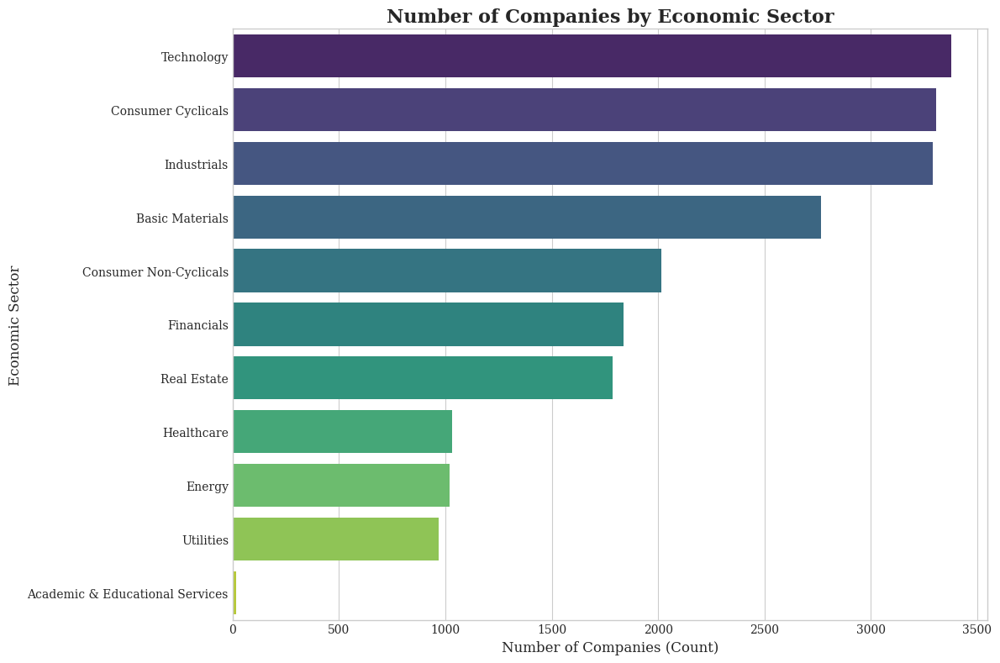


4. Generating Original EDA Figures...


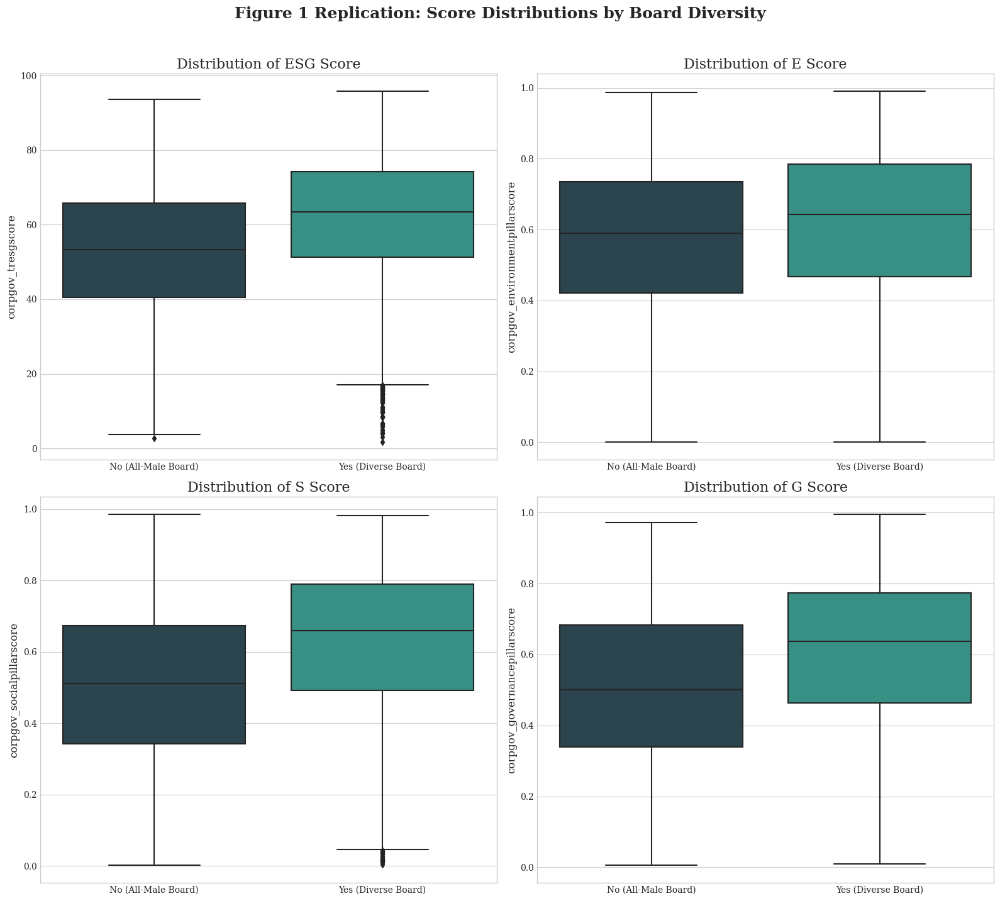

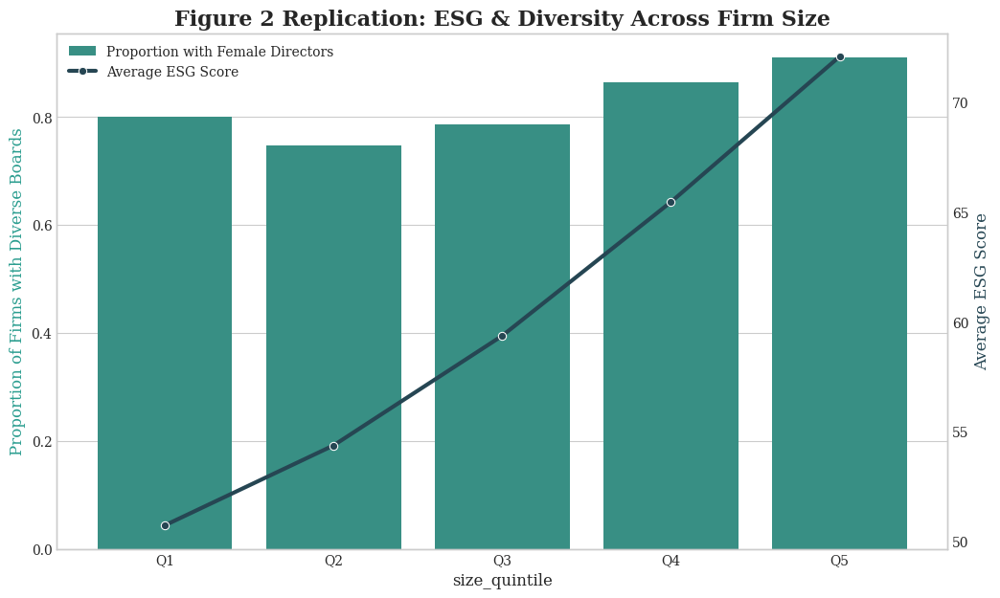

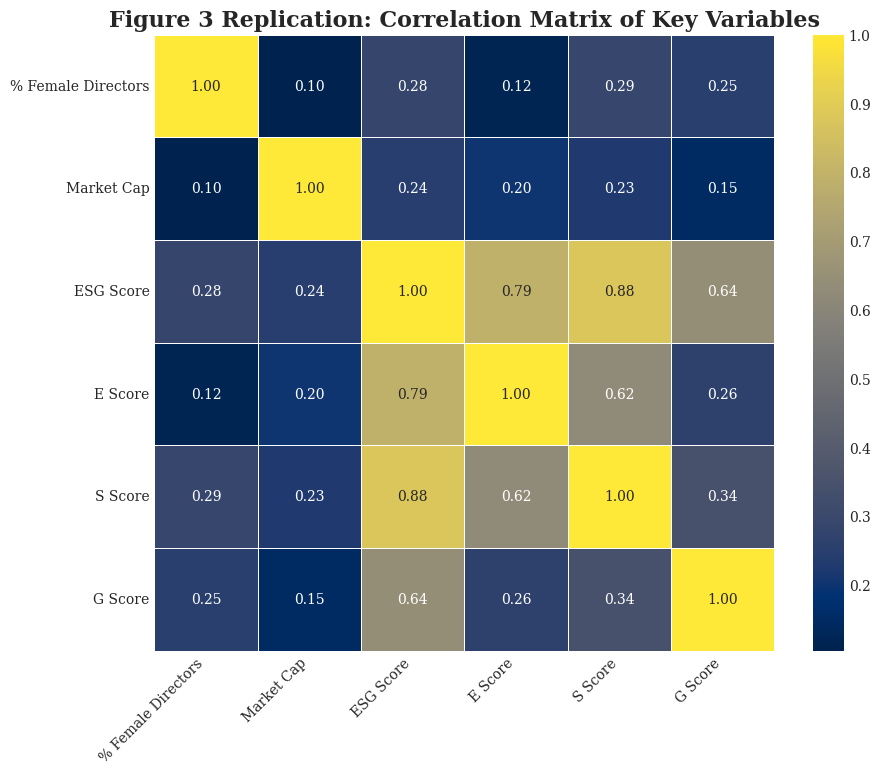


--- Part 1 Complete. Preparing data for modeling scenarios. ---



In [1]:
# ==============================================================================
# Cell 1: EDA, Feature Engineering & Sector Analysis
# ==============================================================================
print("--- Starting Part 1: EDA, Feature Engineering & Sector Analysis ---")

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import os

# --- Configuration ---
color_diverse = '#2a9d8f'
color_male_only = '#264653'
plt.style.use('seaborn-v0_8-whitegrid')
plt.rcParams['font.family'] = 'serif'
plt.rcParams['axes.titlesize'] = 16
plt.rcParams['axes.labelsize'] = 12
plt.rcParams['xtick.labelsize'] = 10
plt.rcParams['ytick.labelsize'] = 10
plt.rcParams['legend.fontsize'] = 10
plt.rcParams['figure.titlesize'] = 18
warnings.filterwarnings('ignore')
pd.set_option('display.max_columns', None)

# --- 1. Load Data ---
print("1. Loading Data...")
try:
    df = pd.read_csv('/kaggle/input/environmental-dataset/Environmental Dataset/Environmental.csv', low_memory=False)
    print(f"   Dataset loaded successfully. Shape: {df.shape}")
except FileNotFoundError:
    print("Error: 'Environmental.csv' not found. Please check the file path.")
    exit()

# --- 2. Feature Engineering (Paper Replication) ---
print("2. Engineering features for analysis (Blau Index, Critical Mass)...")
df['corpgov_cganalyticboardfemale'] = pd.to_numeric(df['corpgov_cganalyticboardfemale'], errors='coerce')
df['corpgov_boardsize'] = pd.to_numeric(df['corpgov_boardsize'], errors='coerce')

# Calculate Blau Index
female_prop = df['corpgov_cganalyticboardfemale'] / 100
male_prop = 1 - female_prop
df['Blau_Index'] = 1 - (female_prop**2 + male_prop**2)
df['Blau_Index'].fillna(0, inplace=True)

# Calculate Number of Female Directors and Critical Mass Dummies
num_female_directors = (female_prop * df['corpgov_boardsize']).round()
df['has_1_woman'] = (num_female_directors == 1).astype(int)
df['has_2_women'] = (num_female_directors == 2).astype(int)
df['has_3plus_women'] = (num_female_directors >= 3).astype(int)
print("   Gender diversity features engineered successfully.")

# --- 3. NEW: Sector Analysis ---
print("\n3. Analyzing Economic Sector Distribution...")
SECTOR_COL = 'iden_trbceconomicsector'
missing_sectors = df[SECTOR_COL].isnull().sum()
print(f"   Found {missing_sectors} rows with missing sector information. These will be excluded from sector-specific analysis.")
df_cleaned_sectors = df.dropna(subset=[SECTOR_COL])
sector_counts = df_cleaned_sectors[SECTOR_COL].value_counts()
unique_sectors = sector_counts.index.tolist()
print(f"   Found {len(unique_sectors)} unique sectors.")

# Visualize Sector Distribution
plt.figure(figsize=(12, 8))
sns.countplot(y=df_cleaned_sectors[SECTOR_COL], order=sector_counts.index, palette='viridis')
plt.title('Number of Companies by Economic Sector', weight='bold')
plt.xlabel('Number of Companies (Count)')
plt.ylabel('Economic Sector')
plt.tight_layout()
plt.show()


# --- 4. Exploratory Visualizations (Replicating Paper) ---
print("\n4. Generating Original EDA Figures...")
# Prepare a clean subset for EDA plots
TARGET_COLS_EDA = {
    'ESG Score': 'corpgov_tresgscore', 'E Score': 'corpgov_environmentpillarscore',
    'S Score': 'corpgov_socialpillarscore', 'G Score': 'corpgov_governancepillarscore'
}
BOARD_FEMALE_COL = 'corpgov_cganalyticboardfemale'
SIZE_COL = 'stock_companymarketcap'
eda_cols = list(TARGET_COLS_EDA.values()) + [BOARD_FEMALE_COL, SIZE_COL]
df_eda_subset = df[eda_cols].copy()
for col in df_eda_subset.columns:
    df_eda_subset[col] = pd.to_numeric(df_eda_subset[col], errors='coerce')
df_eda_subset.dropna(subset=list(TARGET_COLS_EDA.values()) + [BOARD_FEMALE_COL], inplace=True)
df_eda_subset['has_female_directors'] = df_eda_subset[BOARD_FEMALE_COL] > 0

# Figure 1 Replication
fig, axes = plt.subplots(2, 2, figsize=(16, 14))
fig.suptitle('Figure 1 Replication: Score Distributions by Board Diversity', weight='bold', y=1.02)
palette = {False: color_male_only, True: color_diverse}
for i, (name, col) in enumerate(TARGET_COLS_EDA.items()):
    sns.boxplot(ax=axes.flatten()[i], data=df_eda_subset, x='has_female_directors', y=col, palette=palette)
    axes.flatten()[i].set_title(f'Distribution of {name}')
    axes.flatten()[i].set_xticklabels(['No (All-Male Board)', 'Yes (Diverse Board)'])
    axes.flatten()[i].set_xlabel('')
plt.tight_layout()
plt.show()

# Figure 2 Replication
df_eda_subset.dropna(subset=[SIZE_COL], inplace=True)
df_eda_subset['size_quintile'] = pd.qcut(df_eda_subset[SIZE_COL], 5, labels=[f'Q{i}' for i in range(1, 6)], duplicates='drop')
size_analysis = df_eda_subset.groupby('size_quintile', observed=True).agg(
    avg_esg_score=(TARGET_COLS_EDA['ESG Score'], 'mean'),
    prop_diverse=('has_female_directors', 'mean')
).reset_index()
fig, ax1 = plt.subplots(figsize=(12, 7))
plt.title('Figure 2 Replication: ESG & Diversity Across Firm Size', weight='bold')
sns.barplot(data=size_analysis, x='size_quintile', y='prop_diverse', ax=ax1, color=color_diverse, label='Proportion with Female Directors')
ax1.set_ylabel('Proportion of Firms with Diverse Boards', color=color_diverse)
ax2 = ax1.twinx()
sns.lineplot(data=size_analysis, x='size_quintile', y='avg_esg_score', ax=ax2, color=color_male_only, marker='o', lw=3, label='Average ESG Score')
ax2.set_ylabel('Average ESG Score', color=color_male_only)
ax2.grid(False)
lines, labels = ax1.get_legend_handles_labels(); lines2, labels2 = ax2.get_legend_handles_labels()
ax2.legend(lines + lines2, labels + labels2, loc='upper left')
plt.show()

# Figure 3 Replication
corr_df = df.rename(columns={
    BOARD_FEMALE_COL: '% Female Directors',
    SIZE_COL: 'Market Cap',
    **{v: k for k, v in TARGET_COLS_EDA.items()} # Invert dict for renaming
})

corr_matrix = corr_df[['% Female Directors', 'Market Cap'] + list(TARGET_COLS_EDA.keys())].corr()
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='cividis', fmt='.2f', linewidths=.5)
plt.title('Figure 3 Replication: Correlation Matrix of Key Variables', weight='bold')
plt.xticks(rotation=45, ha='right')
plt.show()

print("\n--- Part 1 Complete. Preparing data for modeling scenarios. ---\n")

In [2]:
# ==============================================================================
# Cell 2: Scenario-Based Modeling, Training & Artifact Saving
# ==============================================================================
print("--- Starting Part 2: Scenario-Based Modeling, Training & Artifact Saving ---")

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import joblib
import os
import re
from sklearn.model_selection import train_test_split, KFold
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.feature_selection import SelectKBest, f_regression
from sklearn.linear_model import Lasso, BayesianRidge
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from catboost import CatBoostRegressor
from sklearn.base import BaseEstimator, RegressorMixin, clone
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# --- Define Constants and Models ---
ALL_POSSIBLE_TARGETS = ['corpgov_tresgscore', 'corpgov_environmentpillarscore', 'corpgov_socialpillarscore', 'corpgov_governancepillarscore']
TARGET_COL_NAME = 'corpgov_tresgscore'
GENDER_COLS = ['corpgov_cganalyticboardfemale', 'Blau_Index', 'has_1_woman', 'has_2_women', 'has_3plus_women']
BASE_ARTIFACT_PATH = '/kaggle/working/artifacts'
SECTOR_COL = 'iden_trbceconomicsector'


# Model Definitions
base_learners_dict = {
    "RF": RandomForestRegressor(n_estimators=100, random_state=42, n_jobs=-1),
    "GBDT": GradientBoostingRegressor(n_estimators=100, random_state=42),
    "LightGBM": LGBMRegressor(random_state=42, verbosity=-1),
    "XGBoost": XGBRegressor(random_state=42),
    "CatBoost": CatBoostRegressor(random_state=42, verbose=0)
}
meta_learner_model = BayesianRidge()

# --- Reusable Classes and Functions ---
class ESGStackNetEnsemble(BaseEstimator, RegressorMixin):
    def __init__(self, base_learners, meta_learner, feature_names, n_folds=5):
        self.base_learners = base_learners
        self.meta_learner = meta_learner
        self.n_folds = n_folds
        self.feature_names = feature_names
    
    def fit(self, X, y):
        if isinstance(y, (pd.DataFrame, pd.Series)): y_np = y.values.ravel()
        else: y_np = np.asarray(y).ravel()
        if not isinstance(X, pd.DataFrame): X_df = pd.DataFrame(X, columns=self.feature_names)
        else: X_df = X
        self.base_models_ = [clone(model) for _, model in self.base_learners.items()]
        self.meta_learner_ = clone(self.meta_learner)
        kf = KFold(n_splits=self.n_folds, shuffle=True, random_state=42)
        oof_meta_features = np.zeros((X_df.shape[0], len(self.base_learners)))
        for i, (name, model) in enumerate(self.base_learners.items()):
            for train_idx, val_idx in kf.split(X_df, y_np):
                instance = clone(model)
                instance.fit(X_df.iloc[train_idx], y_np[train_idx])
                oof_meta_features[val_idx, i] = instance.predict(X_df.iloc[val_idx])
        self.meta_learner_.fit(oof_meta_features, y_np)
        for i, model in enumerate(self.base_models_):
            model.fit(X_df, y_np)
        return self
    
    def predict(self, X):
        if not isinstance(X, pd.DataFrame): X_df = pd.DataFrame(X, columns=self.feature_names)
        else: X_df = X
        meta_features = np.column_stack([model.predict(X_df) for model in self.base_models_])
        return self.meta_learner_.predict(meta_features)

# CORRECTED Preprocessing function
def preprocess_data(X_train, X_test, y_train, y_test):
    X_train_proc, X_test_proc = X_train.copy(), X_test.copy()
    y_train_proc, y_test_proc = y_train.copy(), y_test.copy()
    
    # Target variable imputation (robustly based on training set)
    median_val = y_train_proc[TARGET_COL_NAME].median()
    if pd.isna(median_val): # Handle cases where median is NaN for very small slices
        median_val = df[TARGET_COL_NAME].median() # Fallback to global median
    y_train_proc[TARGET_COL_NAME] = y_train_proc[TARGET_COL_NAME].fillna(median_val)
    y_test_proc[TARGET_COL_NAME] = y_test_proc[TARGET_COL_NAME].fillna(median_val)
        
    # Feature processing
    missing_percent = X_train_proc.isnull().sum() / len(X_train_proc)
    cols_to_drop_missing = missing_percent[missing_percent > 0.4].index
    cols_to_drop_other = [col for col in X_train_proc.columns if ('iden' in str(col)) or ('year' in str(col) and X_train_proc[col].dtype == 'object') or X_train_proc[col].nunique() <= 1]
    cols_to_drop = list(set(cols_to_drop_missing) | set(cols_to_drop_other))
    cols_to_drop = [col for col in cols_to_drop if col not in GENDER_COLS]
    X_train_proc = X_train_proc.drop(columns=cols_to_drop)
    X_test_proc = X_test_proc.drop(columns=cols_to_drop, errors='ignore')
    
    numerical_cols = X_train_proc.select_dtypes(include=np.number).columns.tolist()
    categorical_cols = X_train_proc.select_dtypes(exclude=np.number).columns.tolist()
    
    num_imputer = SimpleImputer(strategy='median')
    X_train_proc[numerical_cols] = num_imputer.fit_transform(X_train_proc[numerical_cols])
    X_test_proc[numerical_cols] = num_imputer.transform(X_test_proc[numerical_cols])
    
    for col in categorical_cols:
        mode_val = X_train_proc[col].mode()[0]
        X_train_proc[col] = X_train_proc[col].fillna(mode_val); X_test_proc[col] = X_test_proc[col].fillna(mode_val)
        le = LabelEncoder().fit(pd.concat([X_train_proc[col].astype(str), X_test_proc[col].astype(str)]).unique())
        X_train_proc[col] = le.transform(X_train_proc[col].astype(str)); X_test_proc[col] = le.transform(X_test_proc[col].astype(str))
        
    train_cols, test_cols = X_train_proc.columns, X_test_proc.columns
    shared_cols = list(set(train_cols) & set(test_cols))
    return X_train_proc[shared_cols], X_test_proc[shared_cols], y_train_proc, y_test_proc

def get_top_features_combined(X_train, y_train_target, n_features=25):
    y = y_train_target.values.ravel()
    rf = RandomForestRegressor(n_estimators=50, random_state=42, n_jobs=-1, max_depth=10).fit(X_train, y)
    importances = pd.Series(rf.feature_importances_, index=X_train.columns)
    scaler_fs = StandardScaler(); X_train_scaled_fs = scaler_fs.fit_transform(X_train)
    selector_kbest = SelectKBest(f_regression, k='all').fit(X_train, y)
    lasso = Lasso(alpha=0.1, max_iter=1000, random_state=42).fit(X_train_scaled_fs, y)
    combined = (pd.Series(selector_kbest.scores_, index=X_train.columns).fillna(0).rank(pct=True) +
                pd.Series(np.abs(lasso.coef_), index=X_train.columns).fillna(0).rank(pct=True) +
                importances.rank(pct=True))
    return combined.nlargest(n_features).index.tolist()

def sanitize_filename(name):
    return re.sub(r'[^a-zA-Z0-9_-]', '_', name)

# --- NEW: Global Feature Selection (Done Once) ---
print("1. Performing global feature selection on the overall dataset...")
X_full = df.drop(columns=ALL_POSSIBLE_TARGETS, errors='ignore')
y_full = df[[TARGET_COL_NAME]]
X_train_full, _, y_train_full, _ = train_test_split(X_full, y_full, test_size=0.2, random_state=42)

X_train_proc_full, _, y_train_proc_full, _ = preprocess_data(X_train_full, X_train_full.copy(), y_train_full, y_train_full.copy())
top_25_features = get_top_features_combined(X_train_proc_full, y_train_proc_full, n_features=25)
final_feature_set = list(dict.fromkeys(GENDER_COLS + [f for f in top_25_features if f not in GENDER_COLS]))

print(f"\n--- Global Feature Set of {len(final_feature_set)} Features to be Used for All Scenarios ---")
for i, feature in enumerate(final_feature_set, 1):
    print(f"   {i:2d}. {feature}")
print("--------------------------------------------------------------------------------")


# --- Main Processing Function for a Single Scenario ---
def run_analysis_for_scenario(df_scenario, scenario_name, subset_name, global_feature_set):
    print(f"\n{'='*30}\nProcessing: {scenario_name} - {subset_name}\n{'='*30}")
    
    if df_scenario.shape[0] < 50:
        print(f"Skipping scenario '{scenario_name} - {subset_name}' due to insufficient data ({df_scenario.shape[0]} rows).")
        return

    scenario_path_name = sanitize_filename(scenario_name)
    subset_path_name = sanitize_filename(subset_name)
    artifact_dir = os.path.join(BASE_ARTIFACT_PATH, scenario_path_name, subset_path_name)
    os.makedirs(artifact_dir, exist_ok=True)
    
    X = df_scenario.drop(columns=ALL_POSSIBLE_TARGETS, errors='ignore')
    y = df_scenario[[TARGET_COL_NAME]]
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    
    X_train_proc, X_test_proc, y_train_proc, y_test_proc = preprocess_data(X_train, X_test, y_train, y_test)

    # Use the global feature set, ensuring features exist in the current subset
    available_features = [f for f in global_feature_set if f in X_train_proc.columns and f in X_test_proc.columns]
    X_train_selected = X_train_proc[available_features]
    X_test_selected = X_test_proc[available_features]

    scaler = StandardScaler()
    X_train_scaled_df = pd.DataFrame(scaler.fit_transform(X_train_selected), columns=available_features)
    X_test_scaled_df = pd.DataFrame(scaler.transform(X_test_selected), columns=available_features)

    results = []
    for name, model in base_learners_dict.items():
        instance = clone(model).fit(X_train_scaled_df, y_train_proc.values.ravel())
        y_pred = instance.predict(X_test_scaled_df)
        results.append({'Model': name, 'RMSE': np.sqrt(mean_squared_error(y_test_proc, y_pred)),
                        'MAE': mean_absolute_error(y_test_proc, y_pred), 'R2': r2_score(y_test_proc, y_pred)})
        joblib.dump(instance, os.path.join(artifact_dir, f'model_{name}.joblib'))

    proposed_model = ESGStackNetEnsemble(base_learners_dict, meta_learner_model, feature_names=available_features)
    proposed_model.fit(X_train_scaled_df, y_train_proc)
    y_pred_proposed = proposed_model.predict(X_test_scaled_df)
    results.append({'Model': 'ESG-StackNet Ensemble', 'RMSE': np.sqrt(mean_squared_error(y_test_proc, y_pred_proposed)),
                    'MAE': mean_absolute_error(y_test_proc, y_pred_proposed), 'R2': r2_score(y_test_proc, y_pred_proposed)})
    
    results_df = pd.DataFrame(results).set_index('Model').sort_values('RMSE')
    print("\n--- Model Performance Metrics ---"); print(results_df.round(4))

    joblib.dump(proposed_model, os.path.join(artifact_dir, 'model_ESG_StackNet.joblib'))
    joblib.dump(scaler, os.path.join(artifact_dir, 'scaler.joblib'))
    joblib.dump(available_features, os.path.join(artifact_dir, 'features.joblib'))
    X_train_scaled_df.to_csv(os.path.join(artifact_dir, 'X_train_scaled.csv'), index=False)
    X_test_scaled_df.to_csv(os.path.join(artifact_dir, 'X_test_scaled.csv'), index=False)
    print("   All artifacts for this scenario saved successfully.")

# --- Loop Through All Scenarios and Subsets ---
print("\n2. Starting loop through all scenarios and board compositions...")
scenarios = {"Overall": df}
unique_sectors = df[SECTOR_COL].dropna().unique()
for sector in unique_sectors:
    scenarios[sector] = df[df[SECTOR_COL] == sector].copy()

for scenario_name, scenario_df in scenarios.items():
    df_all = scenario_df.copy()
    df_men_only = scenario_df[scenario_df['corpgov_cganalyticboardfemale'] == 0].copy()
    df_mixed = scenario_df[scenario_df['corpgov_cganalyticboardfemale'] > 0].copy()
    
    subsets = {
        "All Board Types": df_all, "All-Men Board": df_men_only, "Diverse Board": df_mixed
    }
    
    for subset_name, subset_df in subsets.items():
        run_analysis_for_scenario(subset_df, scenario_name, subset_name, final_feature_set)

print("\n--- Part 2 Complete. All scenarios processed and artifacts saved. ---")

--- Starting Part 2: Scenario-Based Modeling, Training & Artifact Saving ---
1. Performing global feature selection on the overall dataset...

--- Global Feature Set of 30 Features to be Used for All Scenarios ---
    1. corpgov_cganalyticboardfemale
    2. Blau_Index
    3. has_1_woman
    4. has_2_women
    5. has_3plus_women
    6. INDEXESG1
    7. corpgov_tresgcscore
    8. corpgov_tresgscoregrade
    9. INDEXESG1_N
   10. corpgov_socialpillarscoregrade
   11. corpgov_tresghumanrightsscore
   12. corpgov_tresgworkforcescore
   13. corpgov_tresgprod_resp_score
   14. corpgov_tresgcommunityscore
   15. corpgov_tresgccontroversiesscore
   16. corpgov_tresgresourceusescore
   17. corpgov_tresgemissionsscore
   18. assets_acctsreceivtradenet
   19. income_normalizedebitda
   20. income_costofrevenuetotal
   21. sdg_pctimputed
   22. corpgov_tresgmanagementscore
   23. corpgov_env_pillarscoregrade
   24. corpgov_policyenvsupplychainsco
   25. corpgov_gov_pillarscoregrade
   26. corpgov_p

--- Starting Part 3: Explainable AI (XAI) for All Scenarios ---


--- XAI Analysis for Scenario: Overall | Subset: All-Men_Board ---
1. Loading artifacts...
   Artifacts loaded successfully.

2. Running SHAP Analysis...


  0%|          | 0/50 [00:00<?, ?it/s]

   SHAP values calculated.

--- SHAP: Global Feature Importance ---


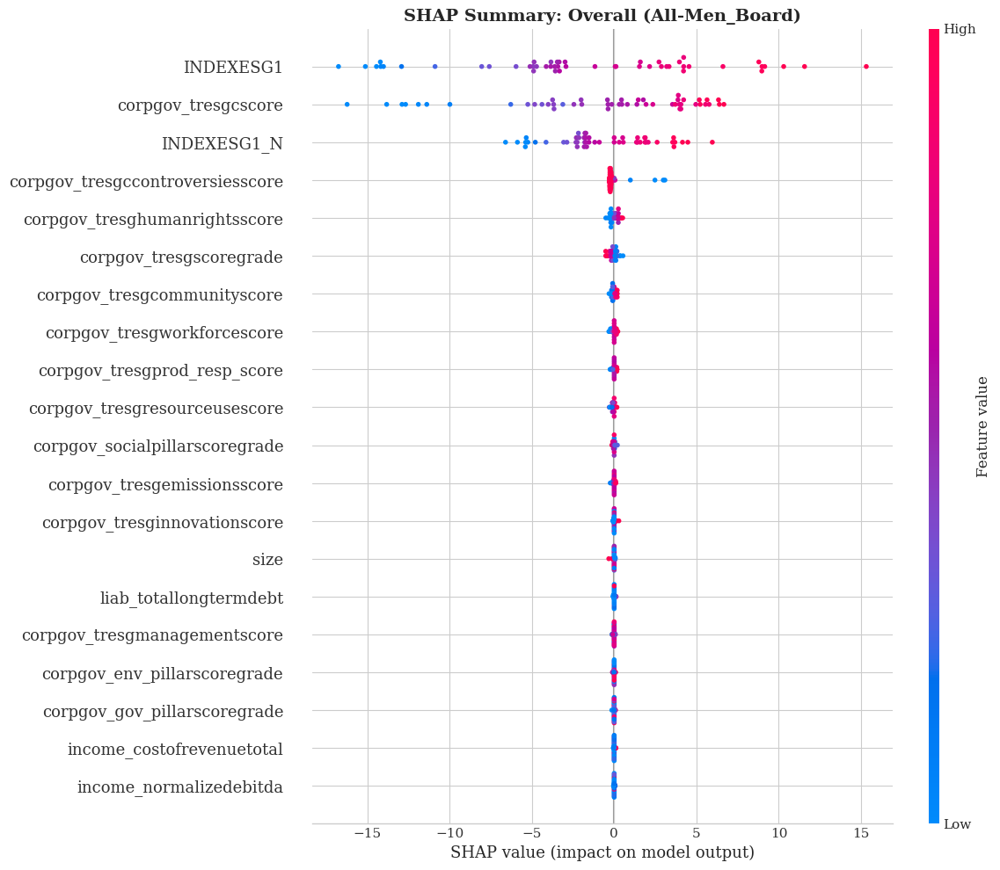


--- SHAP: Feature Contribution by Category ---


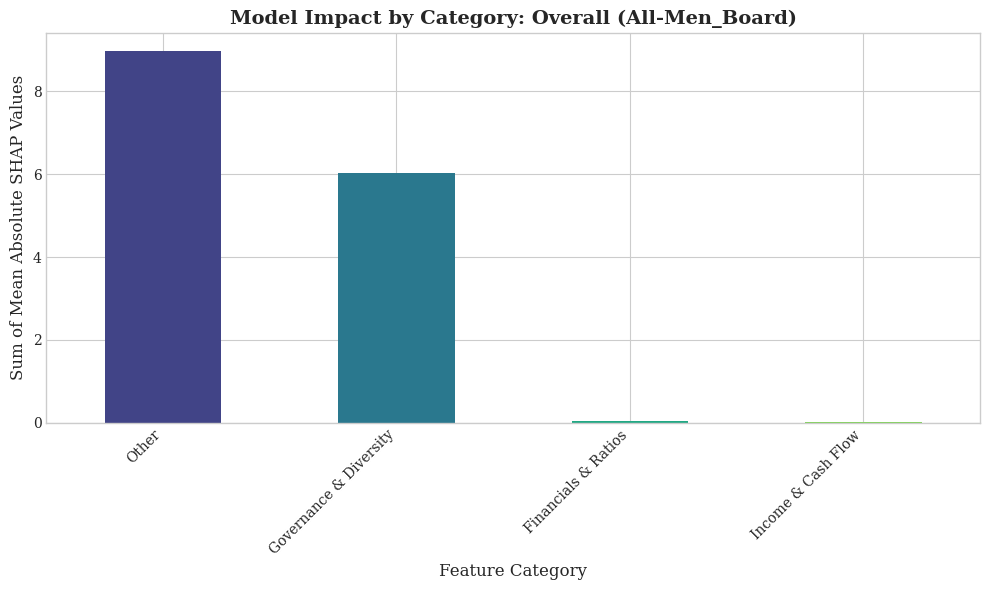


3. Running LIME Analysis...

--- LIME: Explanation for Test Instance #0 ---
Model Prediction for this instance: 33.20


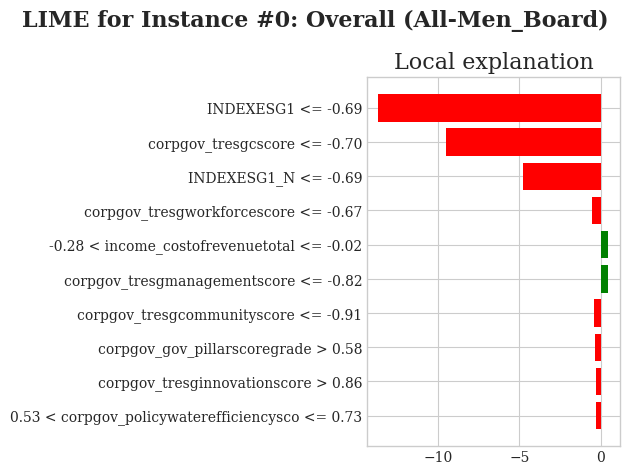


--- LIME: Explanation for Test Instance #318 ---
Model Prediction for this instance: 37.24


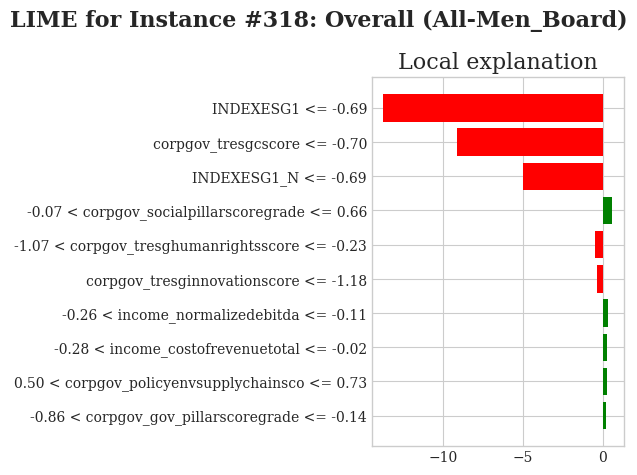


--- LIME: Explanation for Test Instance #636 ---
Model Prediction for this instance: 67.63


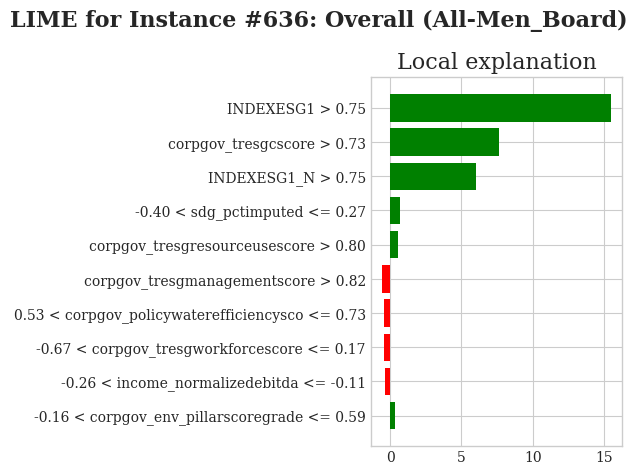



--- XAI Analysis for Scenario: Overall | Subset: All_Board_Types ---
1. Loading artifacts...
   Artifacts loaded successfully.

2. Running SHAP Analysis...


  0%|          | 0/50 [00:00<?, ?it/s]

   SHAP values calculated.

--- SHAP: Global Feature Importance ---


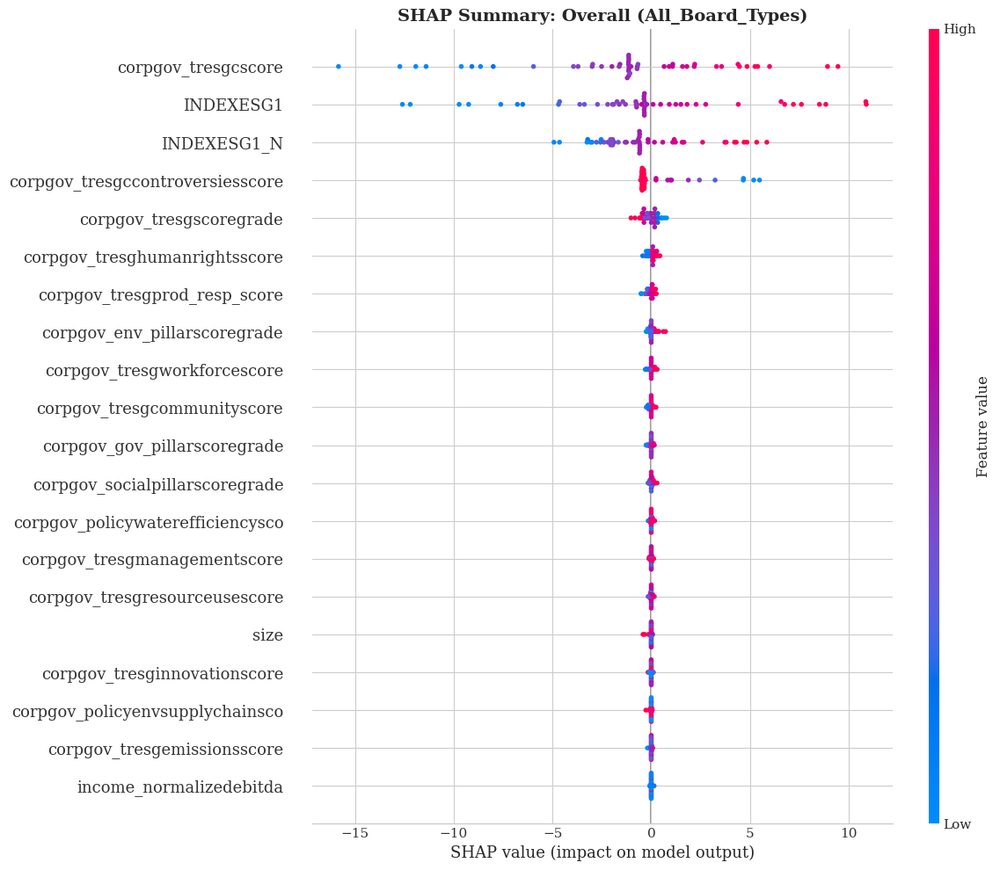


--- SHAP: Feature Contribution by Category ---


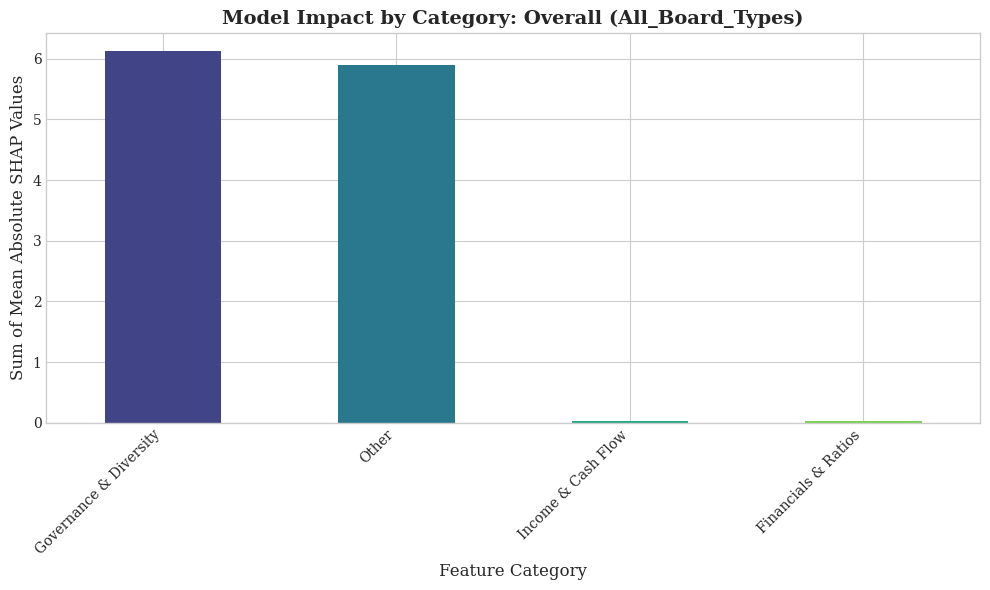


3. Running LIME Analysis...

--- LIME: Explanation for Test Instance #0 ---
Model Prediction for this instance: 80.45


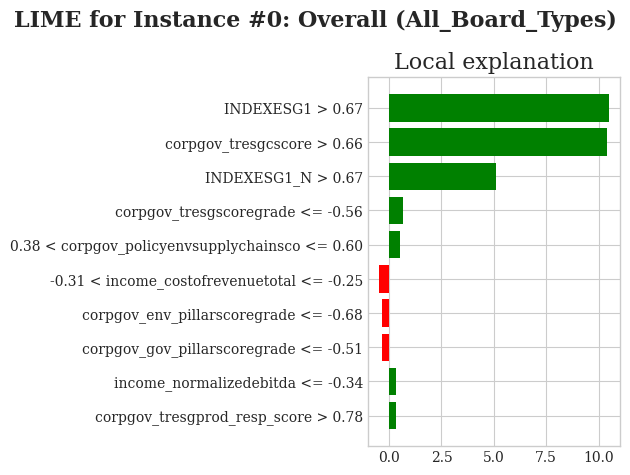


--- LIME: Explanation for Test Instance #2149 ---
Model Prediction for this instance: 78.58


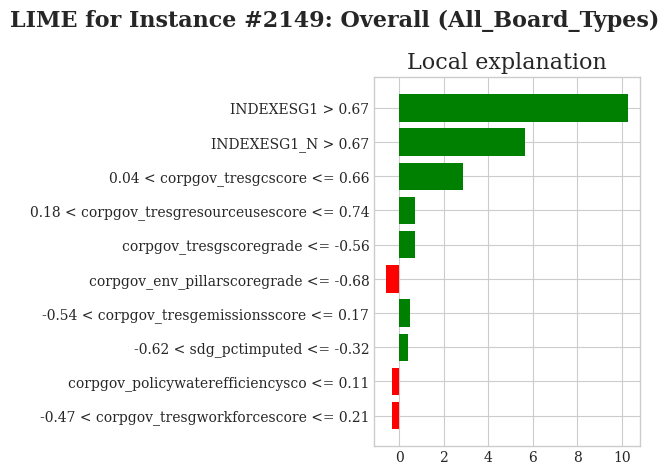


--- LIME: Explanation for Test Instance #4299 ---
Model Prediction for this instance: 51.20


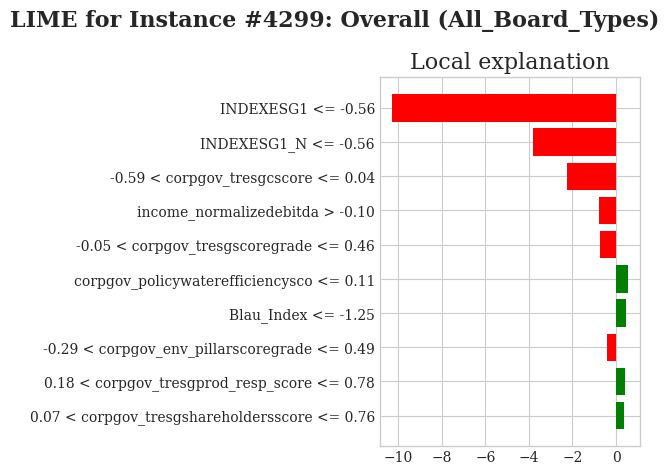



--- XAI Analysis for Scenario: Overall | Subset: Diverse_Board ---
1. Loading artifacts...
   Artifacts loaded successfully.

2. Running SHAP Analysis...


  0%|          | 0/50 [00:00<?, ?it/s]

   SHAP values calculated.

--- SHAP: Global Feature Importance ---


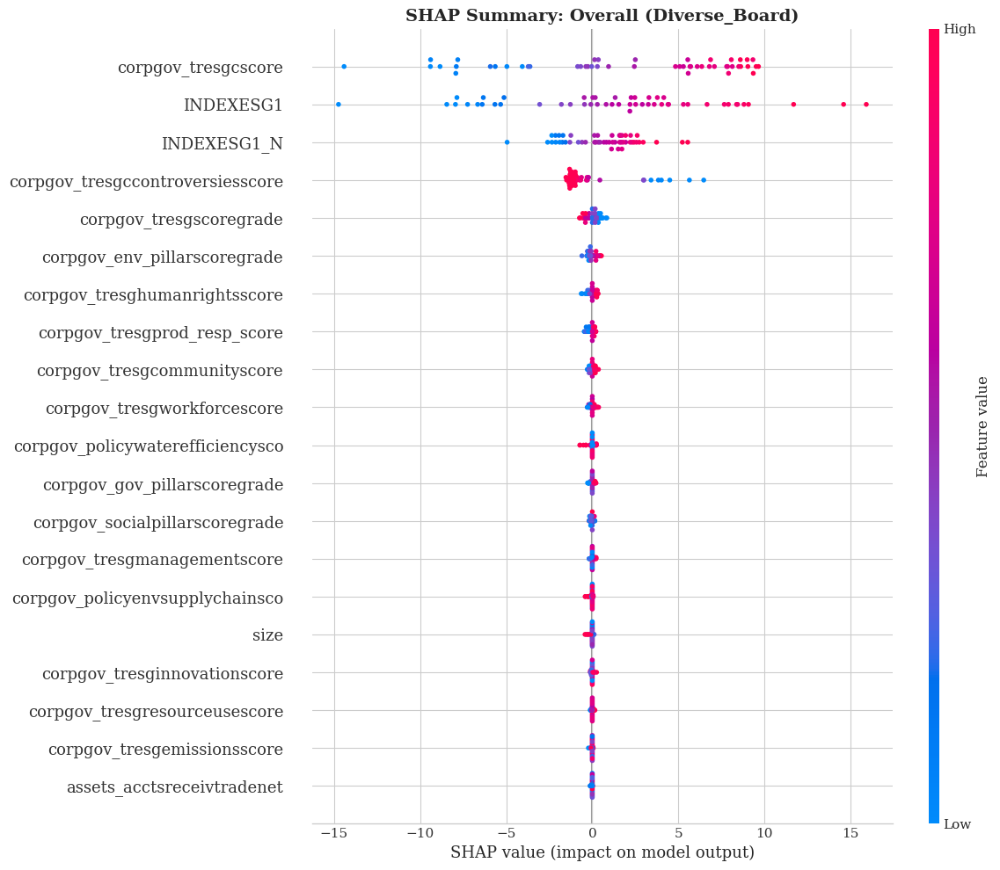


--- SHAP: Feature Contribution by Category ---


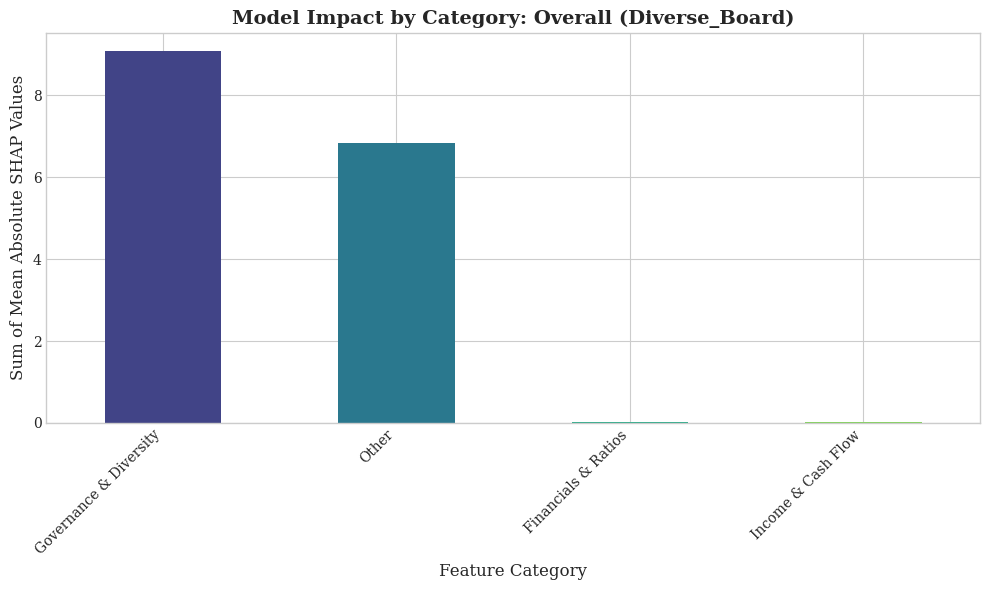


3. Running LIME Analysis...

--- LIME: Explanation for Test Instance #0 ---
Model Prediction for this instance: 64.78


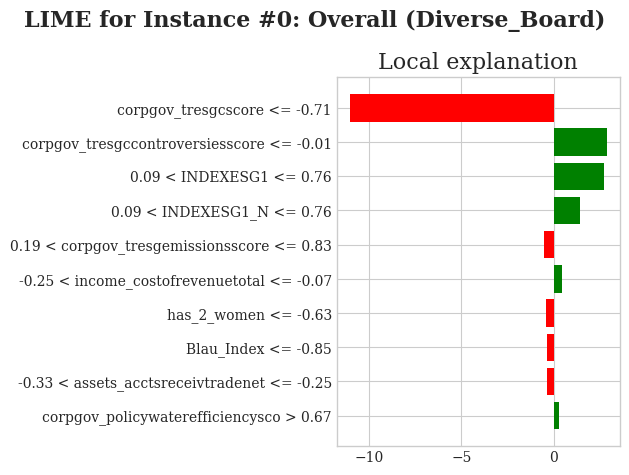


--- LIME: Explanation for Test Instance #1466 ---
Model Prediction for this instance: 76.02


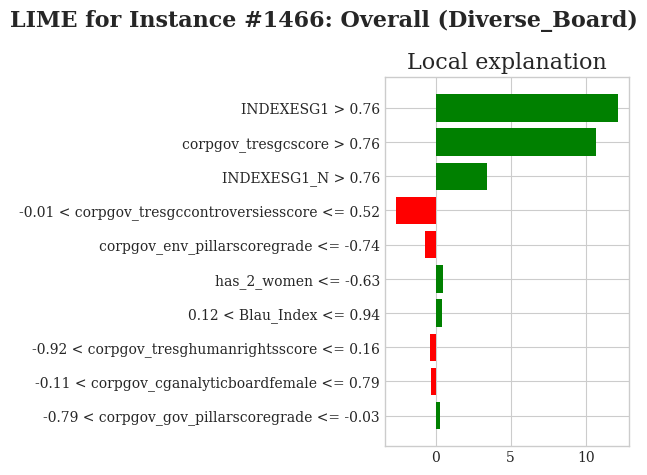


--- LIME: Explanation for Test Instance #2933 ---
Model Prediction for this instance: 63.67


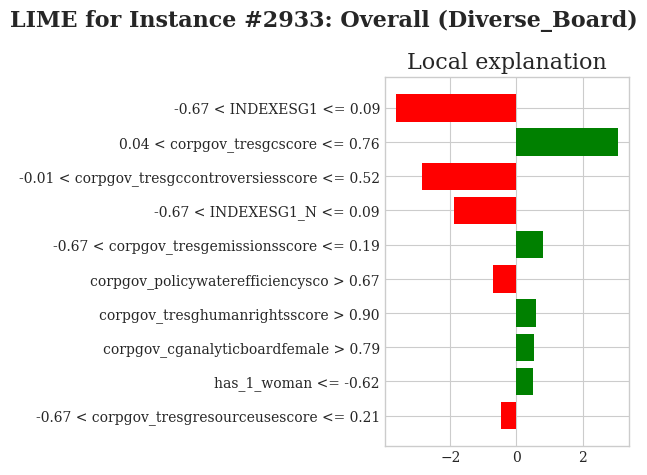



--- XAI Analysis for Scenario: Financials | Subset: All-Men_Board ---
1. Loading artifacts...
   Artifacts loaded successfully.

2. Running SHAP Analysis...


  0%|          | 0/27 [00:00<?, ?it/s]

   SHAP values calculated.

--- SHAP: Global Feature Importance ---


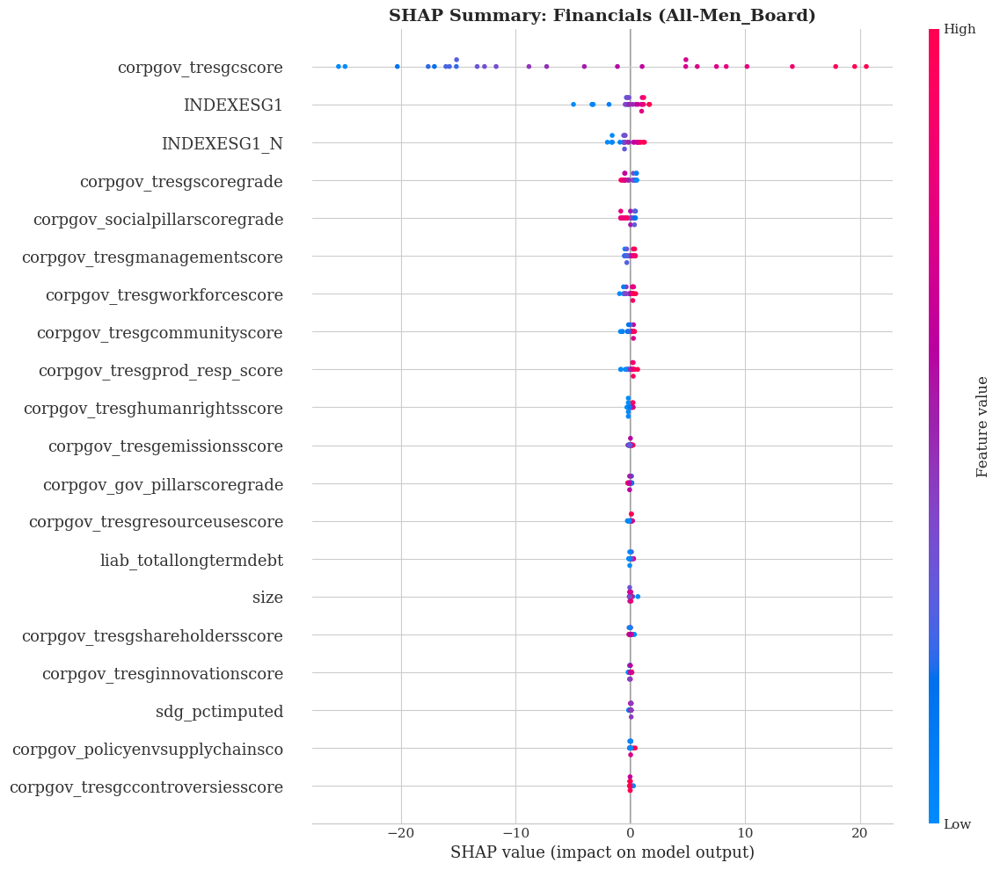


--- SHAP: Feature Contribution by Category ---


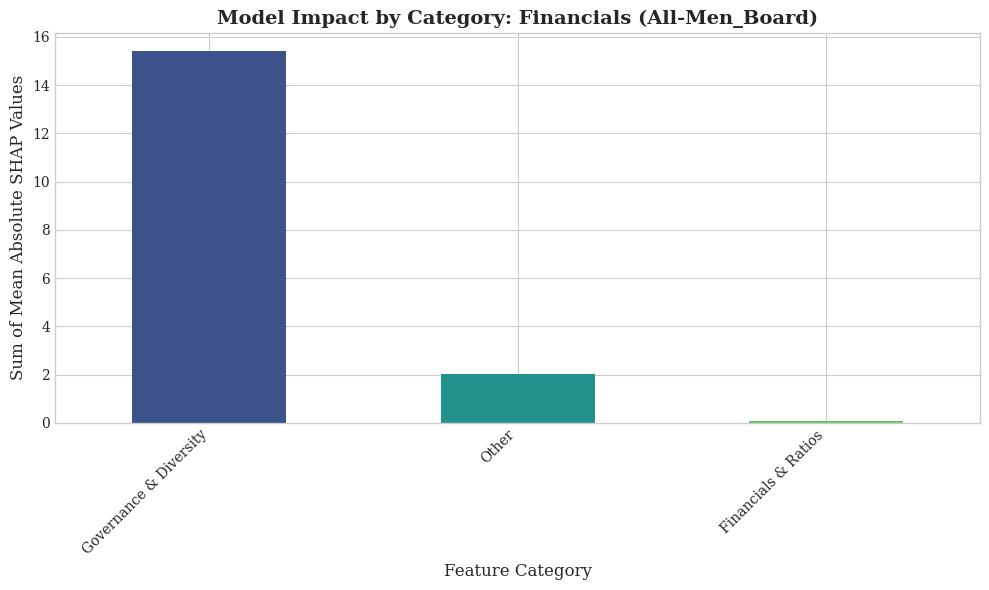


3. Running LIME Analysis...

--- LIME: Explanation for Test Instance #0 ---
Model Prediction for this instance: 82.56


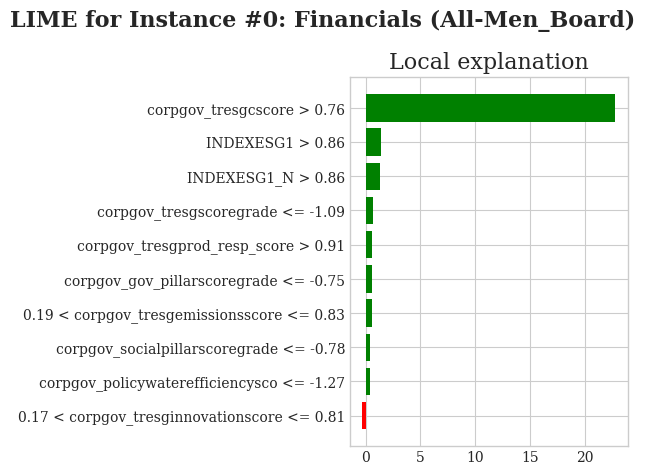


--- LIME: Explanation for Test Instance #13 ---
Model Prediction for this instance: 65.90


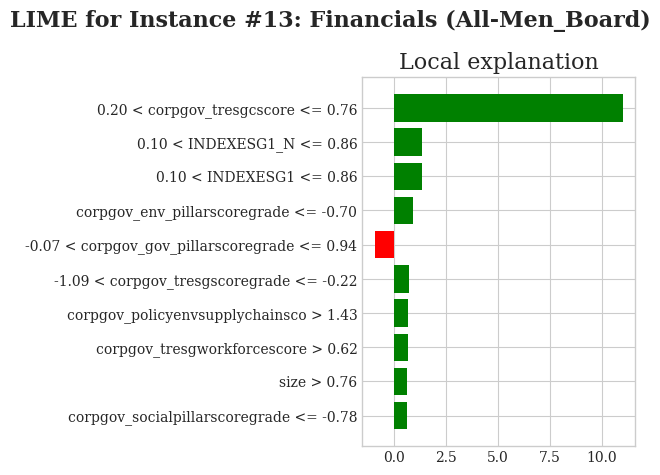


--- LIME: Explanation for Test Instance #26 ---
Model Prediction for this instance: 39.37


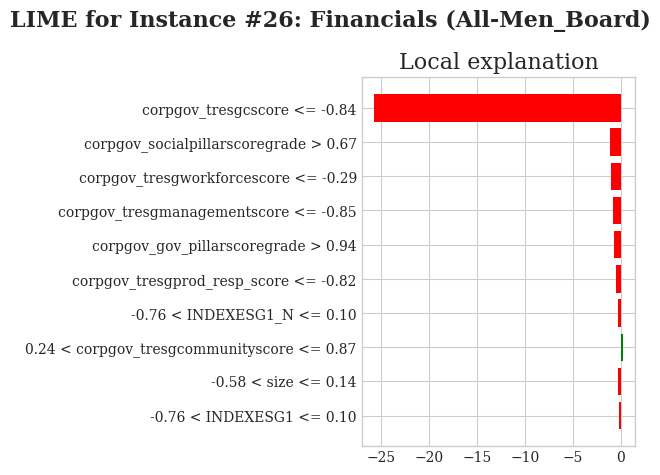



--- XAI Analysis for Scenario: Financials | Subset: All_Board_Types ---
1. Loading artifacts...
   Artifacts loaded successfully.

2. Running SHAP Analysis...


  0%|          | 0/50 [00:00<?, ?it/s]

   SHAP values calculated.

--- SHAP: Global Feature Importance ---


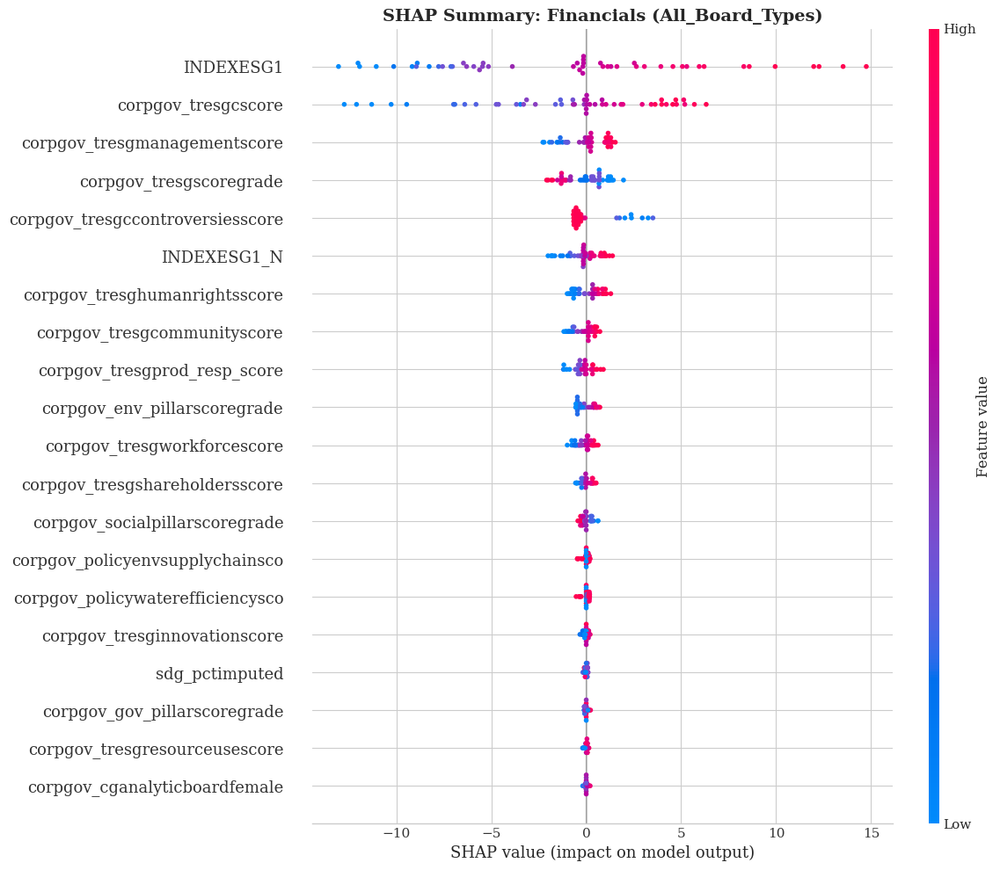


--- SHAP: Feature Contribution by Category ---


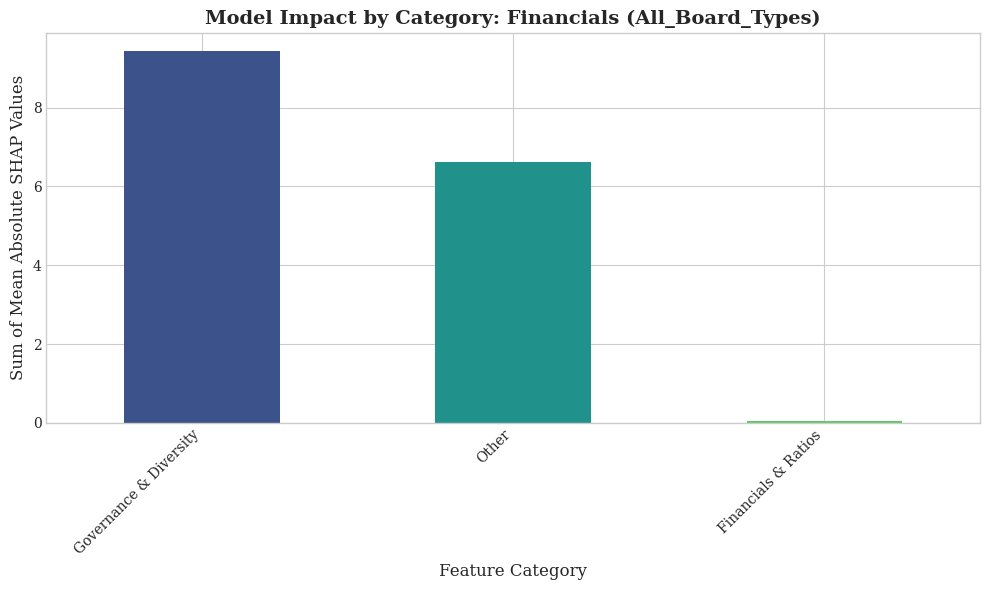


3. Running LIME Analysis...

--- LIME: Explanation for Test Instance #0 ---
Model Prediction for this instance: 86.78


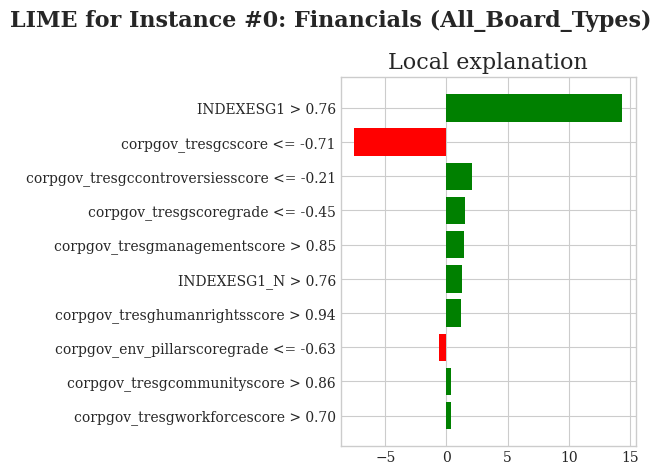


--- LIME: Explanation for Test Instance #183 ---
Model Prediction for this instance: 50.33


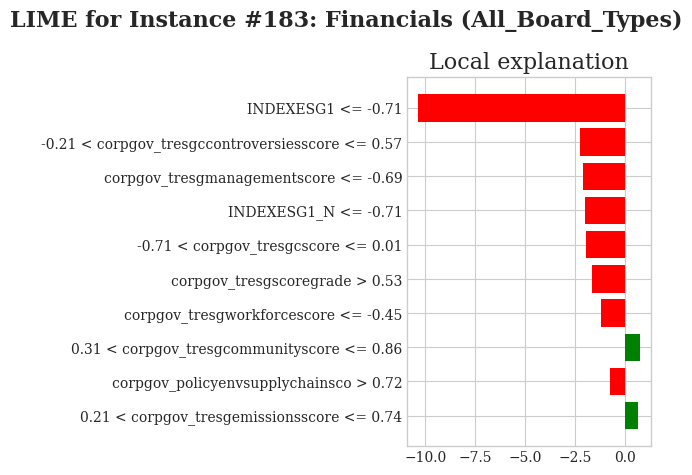


--- LIME: Explanation for Test Instance #367 ---
Model Prediction for this instance: 60.64


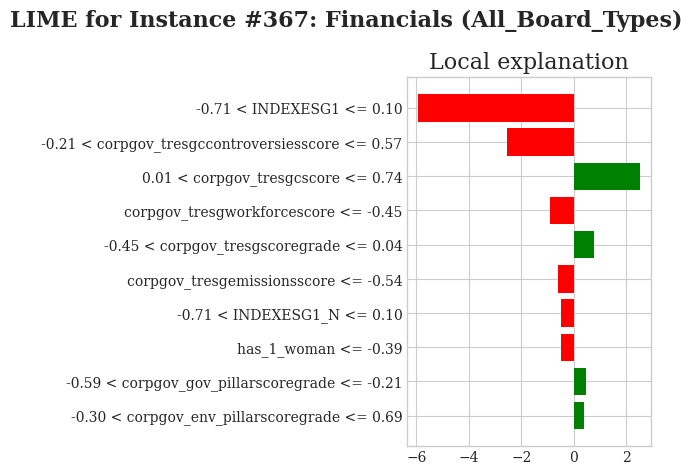



--- XAI Analysis for Scenario: Financials | Subset: Diverse_Board ---
1. Loading artifacts...
   Artifacts loaded successfully.

2. Running SHAP Analysis...


  0%|          | 0/50 [00:00<?, ?it/s]

   SHAP values calculated.

--- SHAP: Global Feature Importance ---


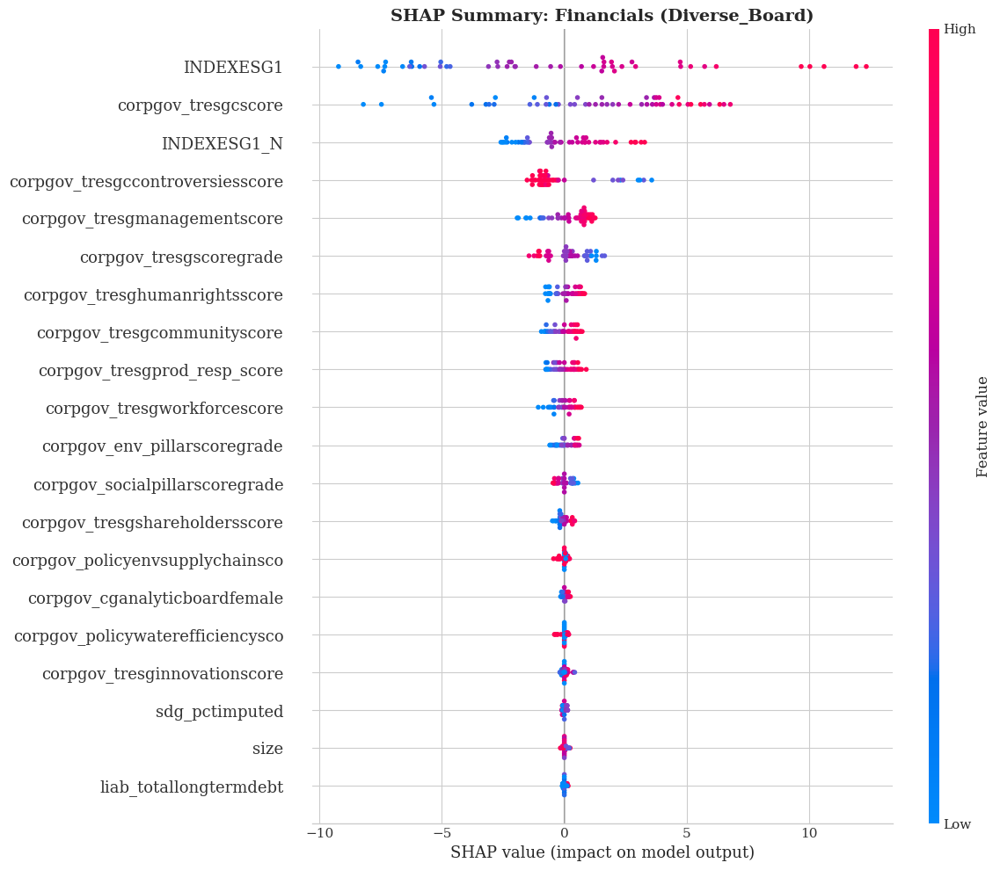


--- SHAP: Feature Contribution by Category ---


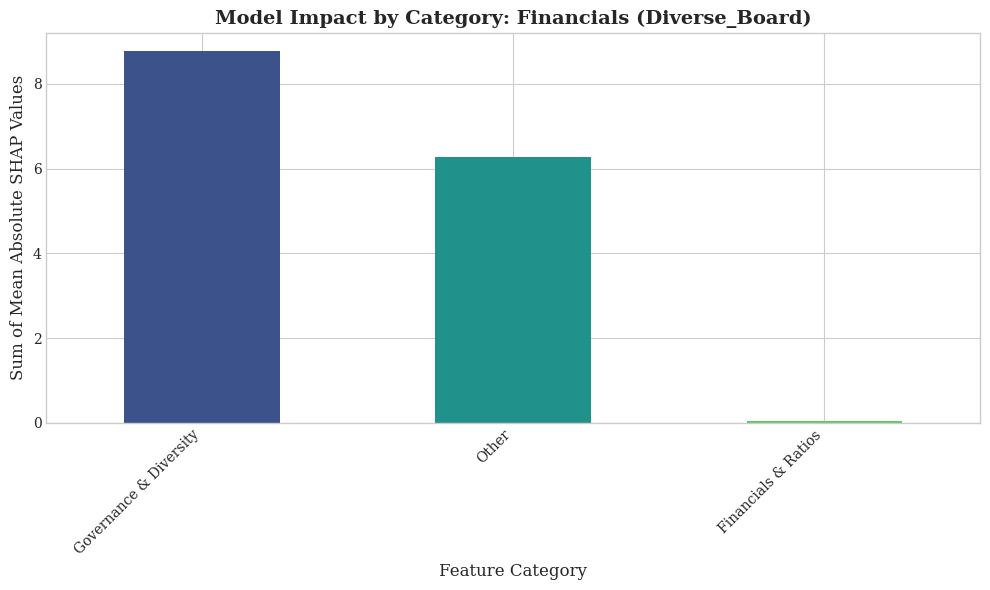


3. Running LIME Analysis...

--- LIME: Explanation for Test Instance #0 ---
Model Prediction for this instance: 57.71


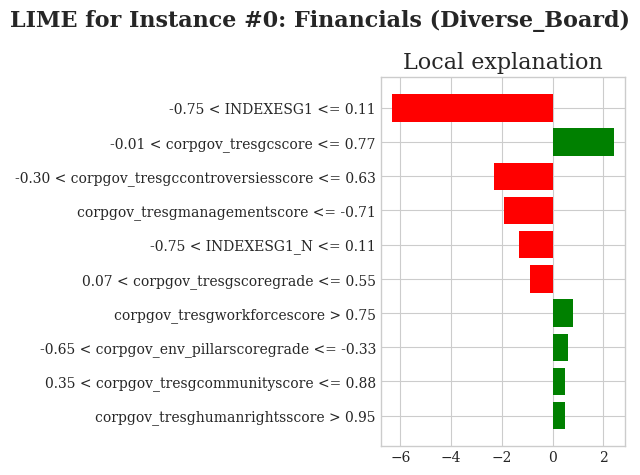


--- LIME: Explanation for Test Instance #153 ---
Model Prediction for this instance: 66.71


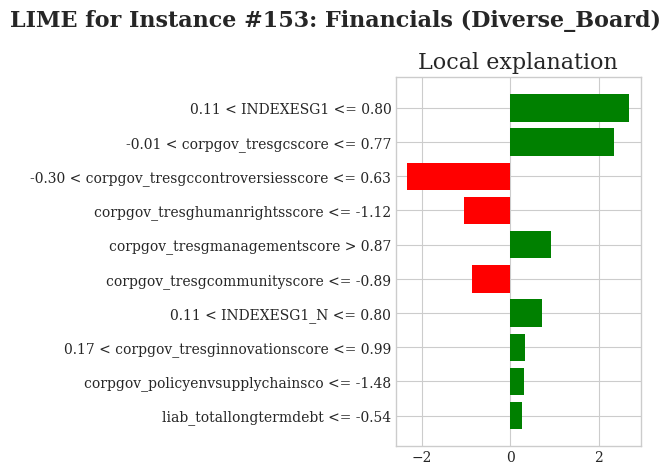


--- LIME: Explanation for Test Instance #306 ---
Model Prediction for this instance: 40.61


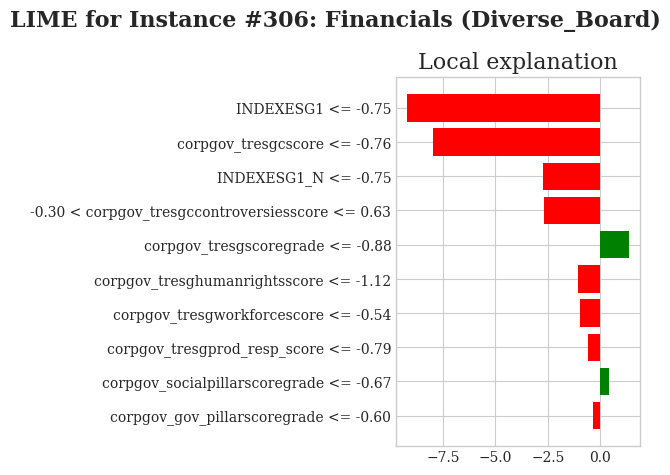



--- XAI Analysis for Scenario: Consumer_Non-Cyclicals | Subset: All-Men_Board ---
1. Loading artifacts...
   Artifacts loaded successfully.

2. Running SHAP Analysis...


  0%|          | 0/47 [00:00<?, ?it/s]

   SHAP values calculated.

--- SHAP: Global Feature Importance ---


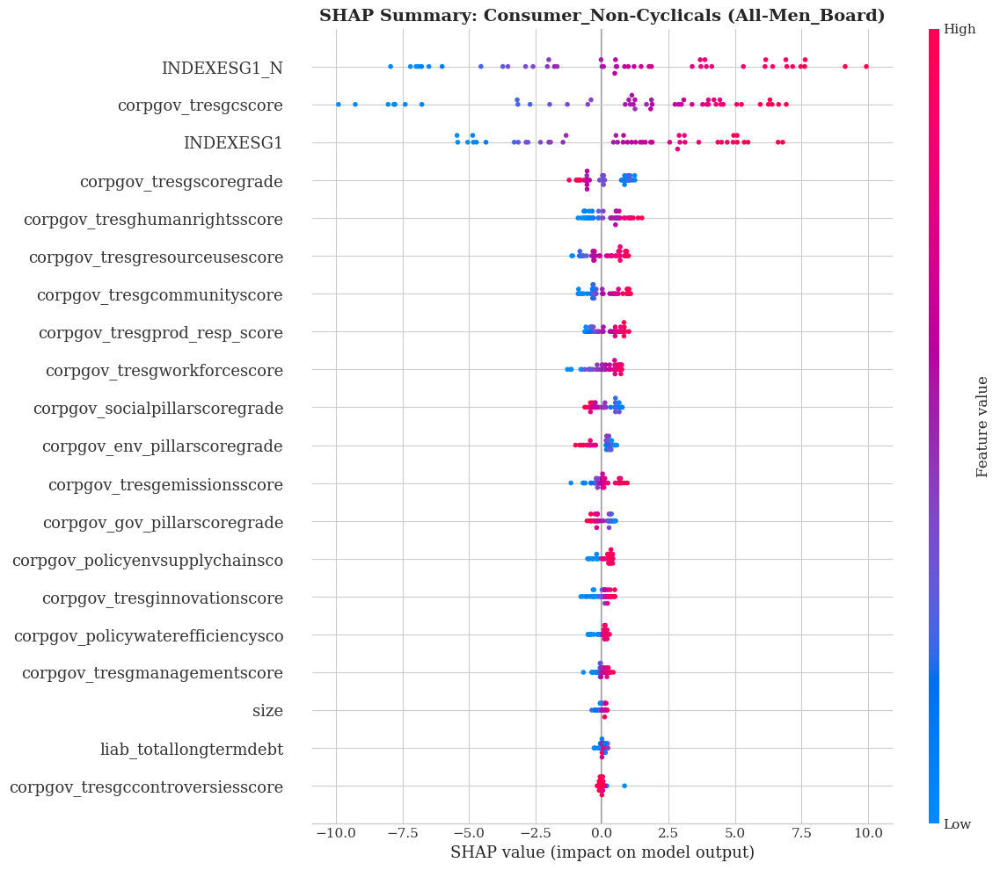


--- SHAP: Feature Contribution by Category ---


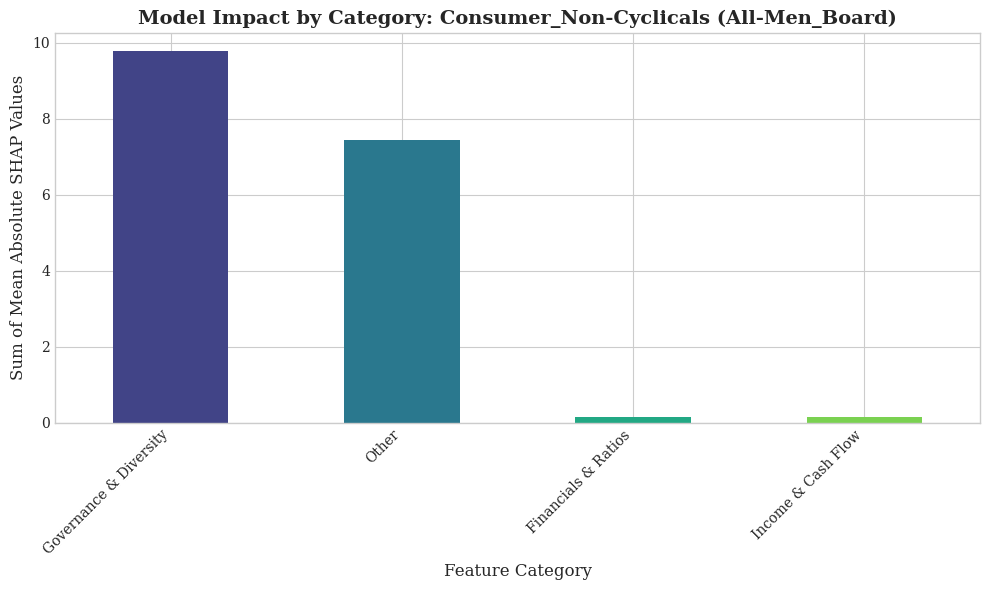


3. Running LIME Analysis...

--- LIME: Explanation for Test Instance #0 ---
Model Prediction for this instance: 72.82


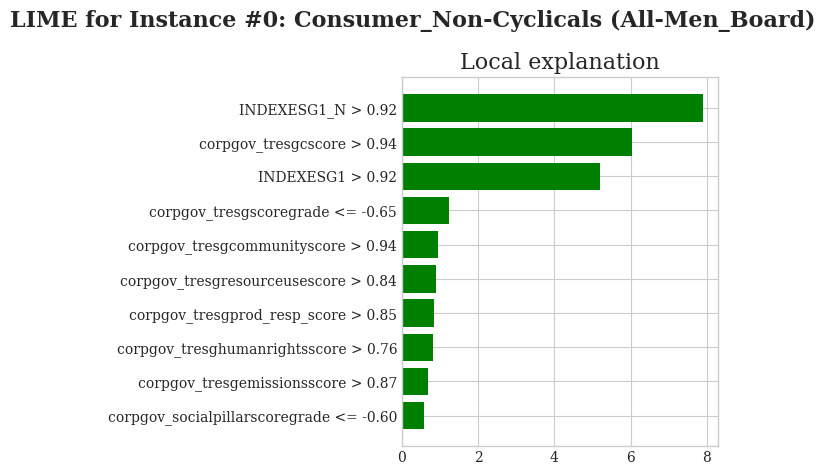


--- LIME: Explanation for Test Instance #23 ---
Model Prediction for this instance: 60.33


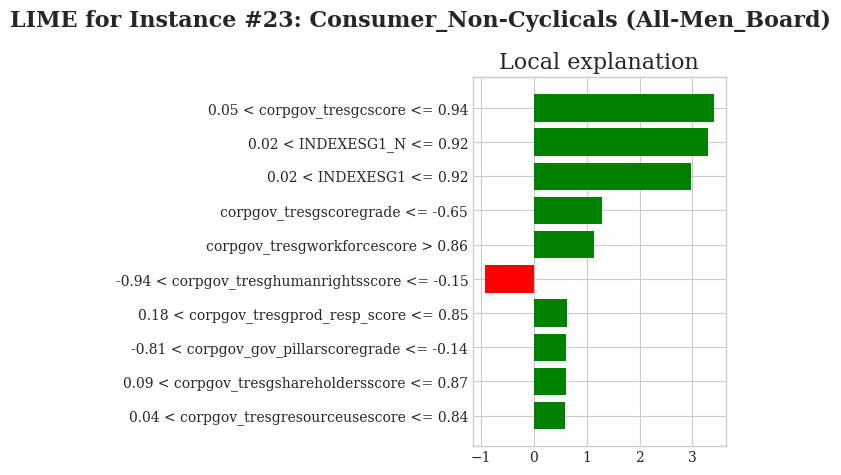


--- LIME: Explanation for Test Instance #46 ---
Model Prediction for this instance: 63.30


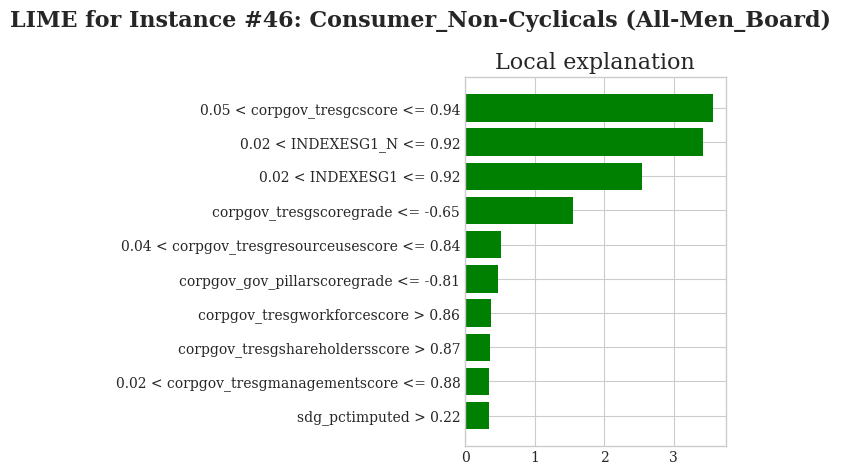



--- XAI Analysis for Scenario: Consumer_Non-Cyclicals | Subset: All_Board_Types ---
1. Loading artifacts...
   Artifacts loaded successfully.

2. Running SHAP Analysis...


  0%|          | 0/50 [00:00<?, ?it/s]

   SHAP values calculated.

--- SHAP: Global Feature Importance ---


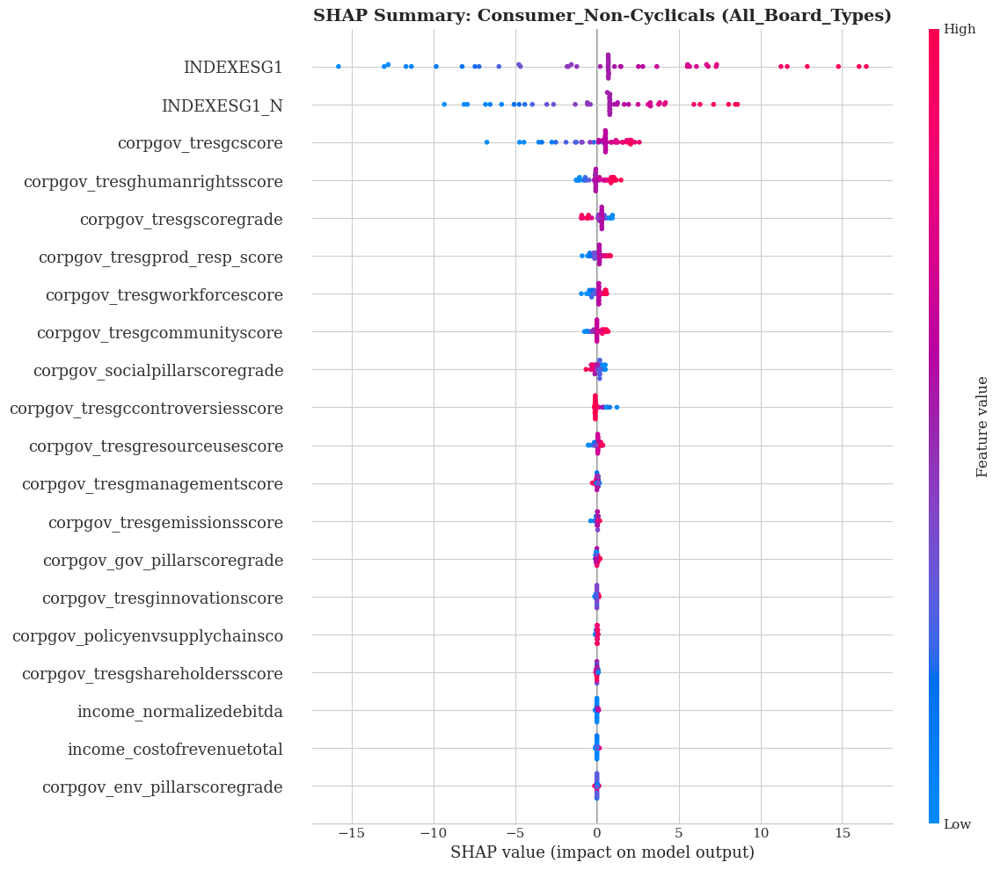


--- SHAP: Feature Contribution by Category ---


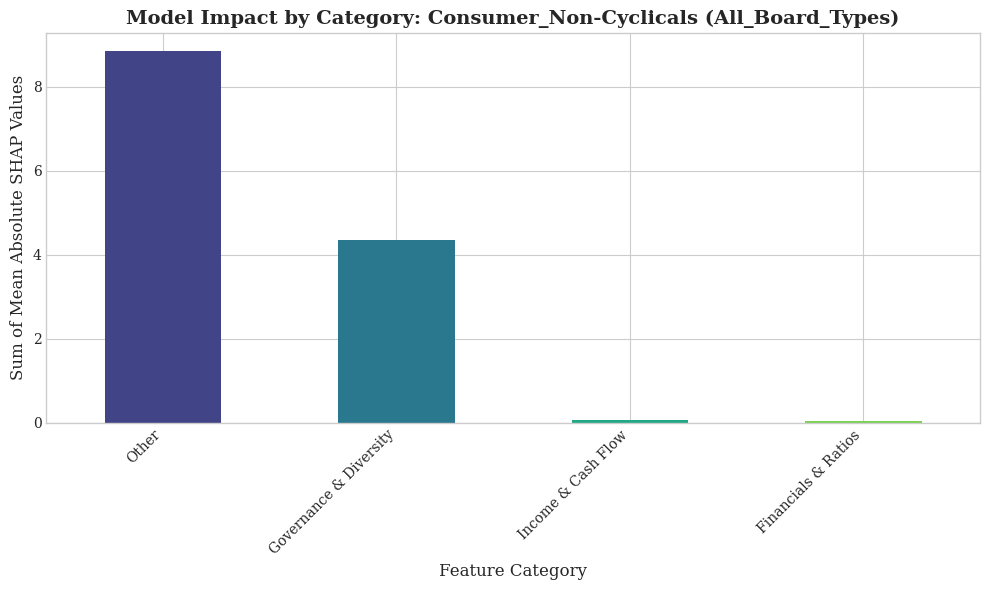


3. Running LIME Analysis...

--- LIME: Explanation for Test Instance #0 ---
Model Prediction for this instance: 43.81


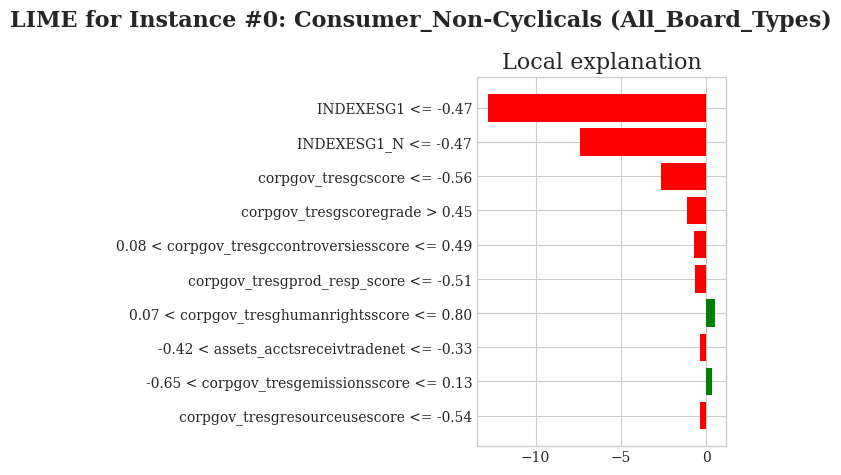


--- LIME: Explanation for Test Instance #201 ---
Model Prediction for this instance: 68.35


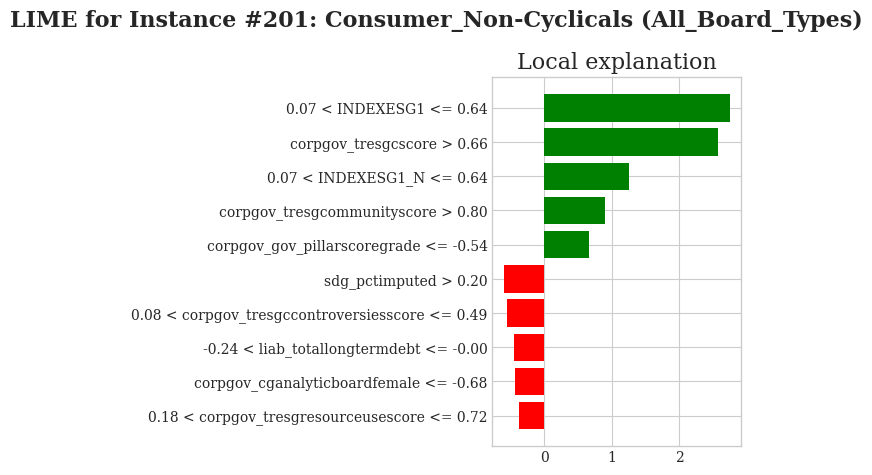


--- LIME: Explanation for Test Instance #402 ---
Model Prediction for this instance: 62.69


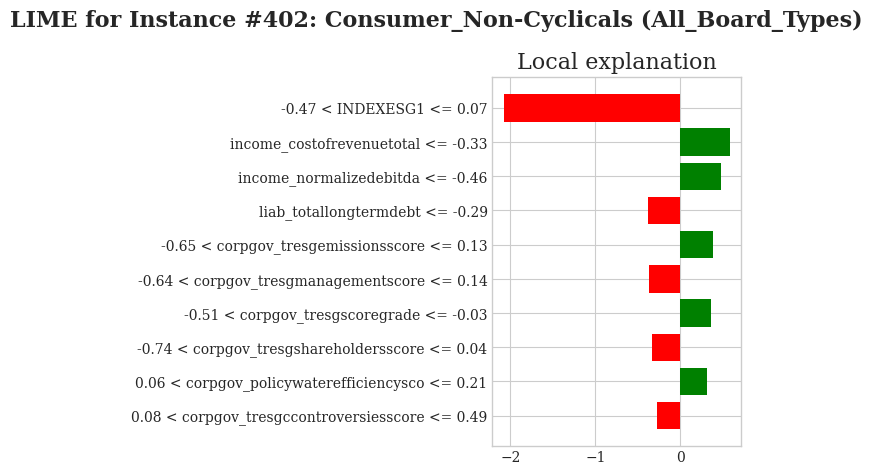



--- XAI Analysis for Scenario: Consumer_Non-Cyclicals | Subset: Diverse_Board ---
1. Loading artifacts...
   Artifacts loaded successfully.

2. Running SHAP Analysis...


  0%|          | 0/50 [00:00<?, ?it/s]

   SHAP values calculated.

--- SHAP: Global Feature Importance ---


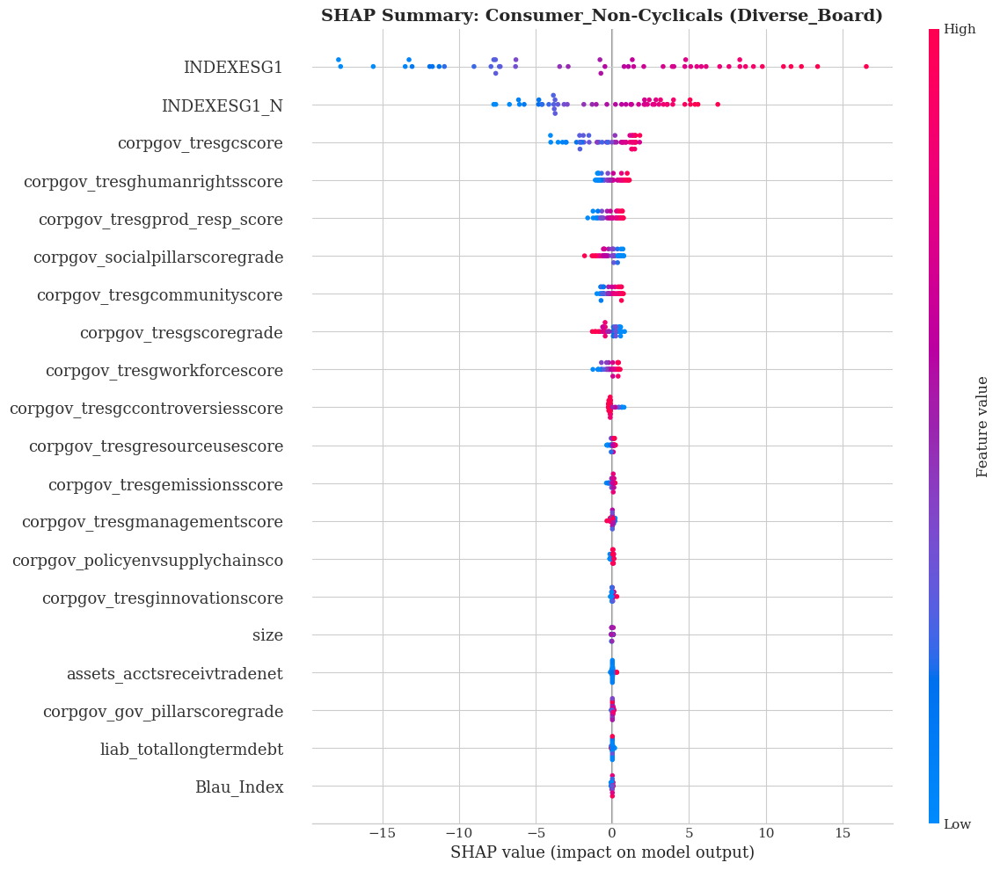


--- SHAP: Feature Contribution by Category ---


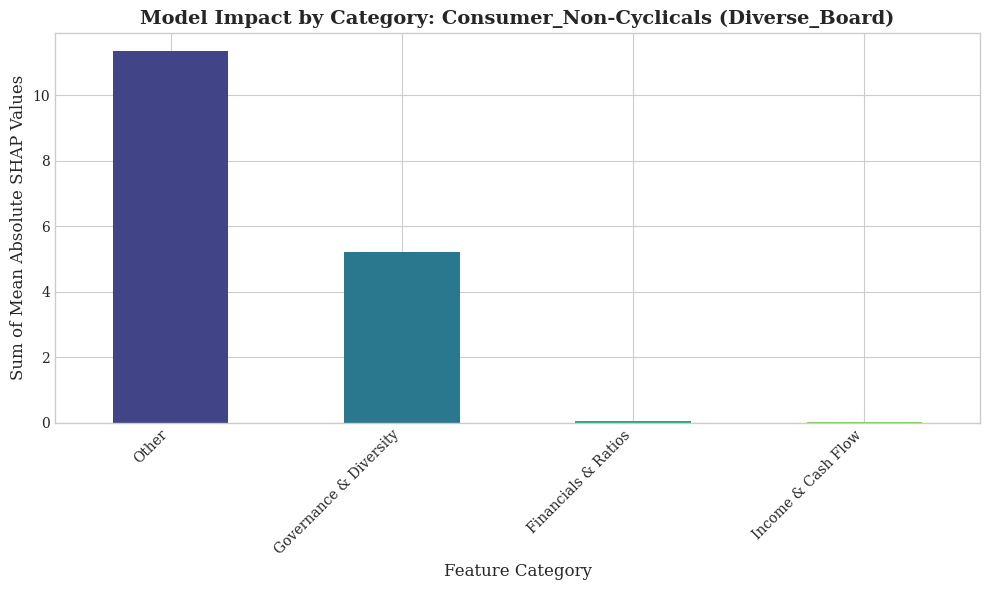


3. Running LIME Analysis...

--- LIME: Explanation for Test Instance #0 ---
Model Prediction for this instance: 64.00


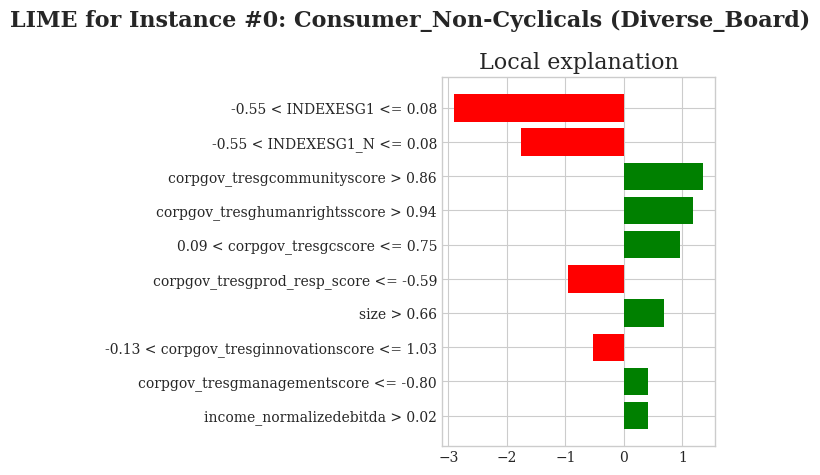


--- LIME: Explanation for Test Instance #141 ---
Model Prediction for this instance: 51.40


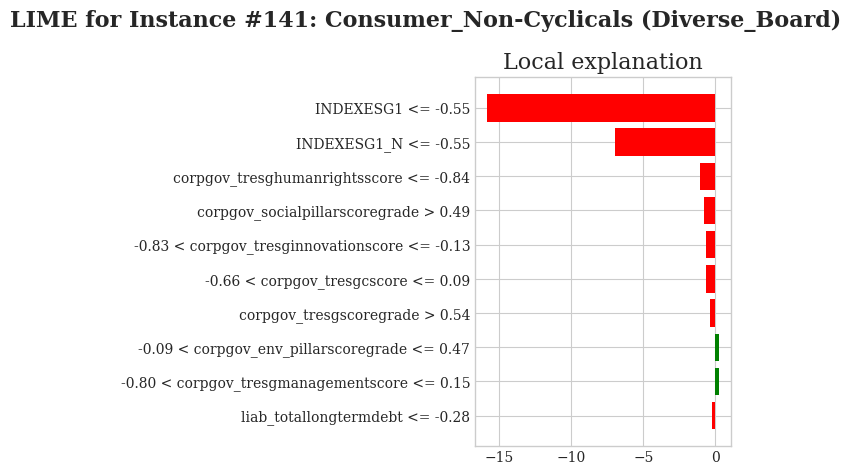


--- LIME: Explanation for Test Instance #283 ---
Model Prediction for this instance: 39.74


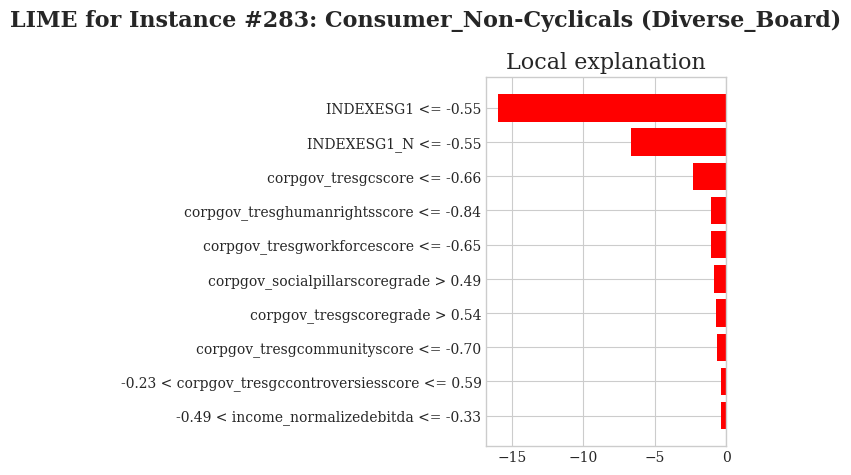



--- XAI Analysis for Scenario: Consumer_Cyclicals | Subset: All-Men_Board ---
1. Loading artifacts...
   Artifacts loaded successfully.

2. Running SHAP Analysis...


  0%|          | 0/50 [00:00<?, ?it/s]

   SHAP values calculated.

--- SHAP: Global Feature Importance ---


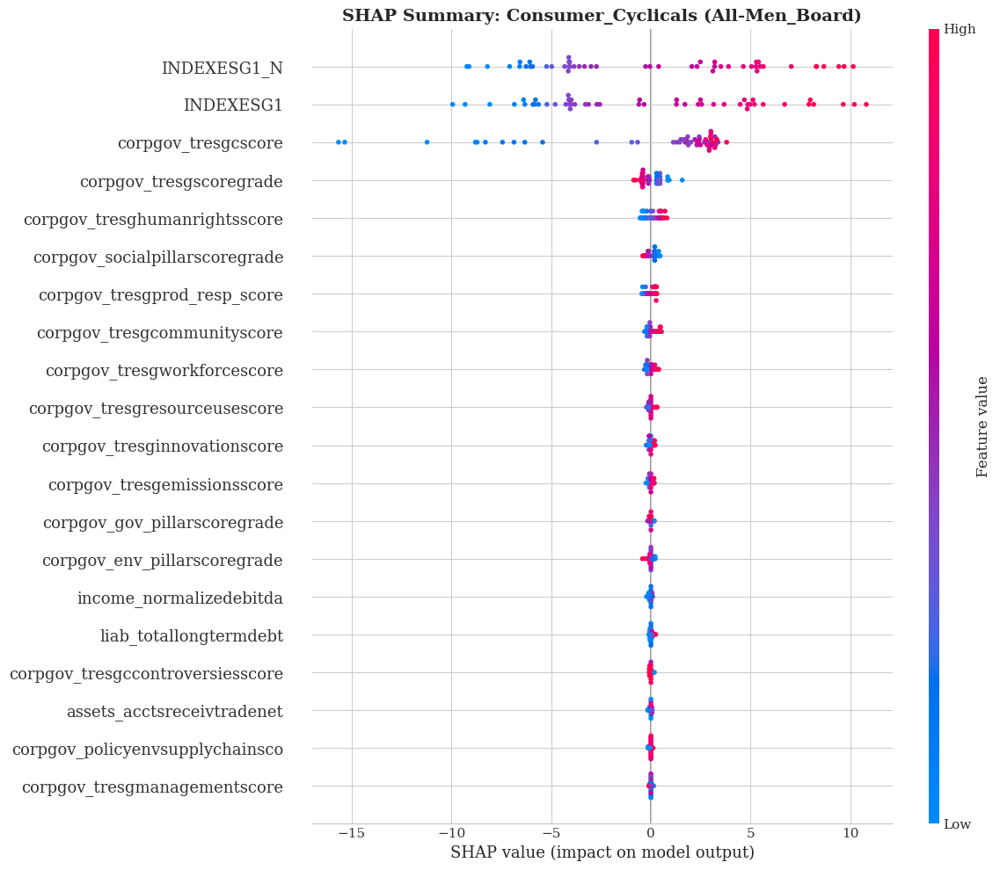


--- SHAP: Feature Contribution by Category ---


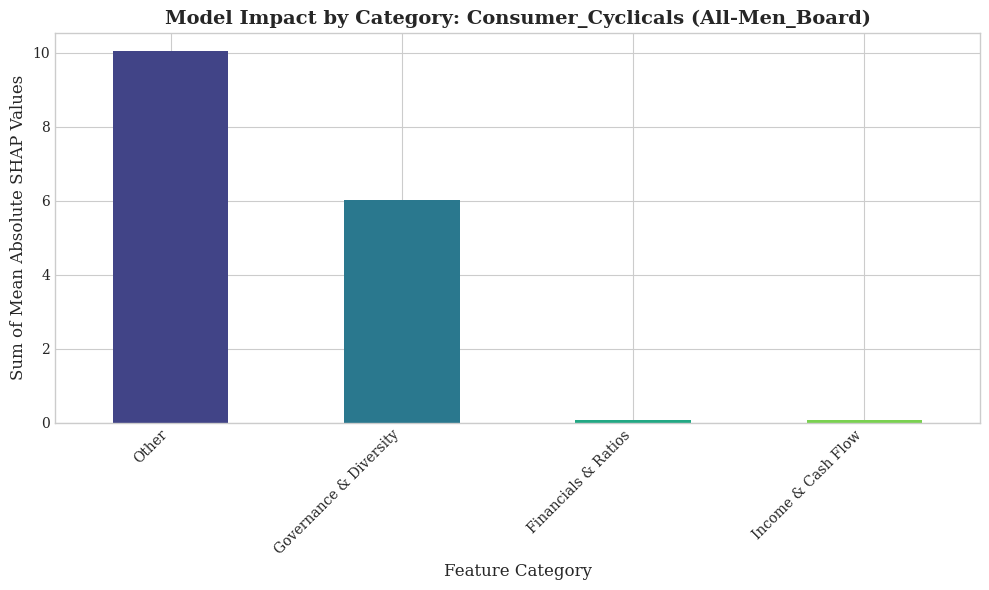


3. Running LIME Analysis...

--- LIME: Explanation for Test Instance #0 ---
Model Prediction for this instance: 45.69


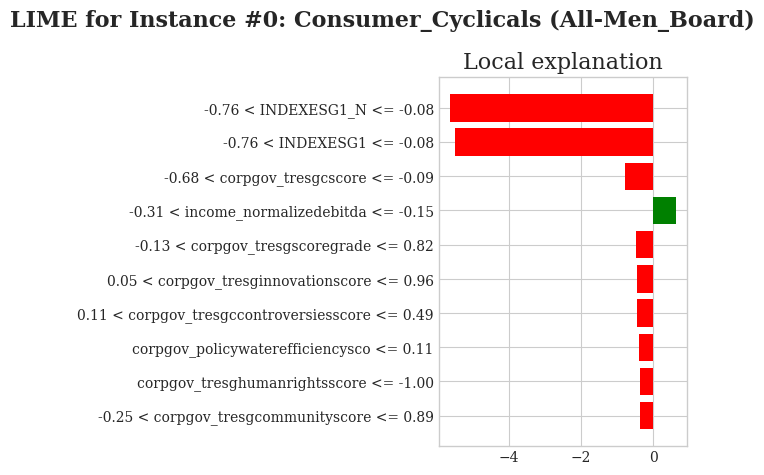


--- LIME: Explanation for Test Instance #52 ---
Model Prediction for this instance: 72.03


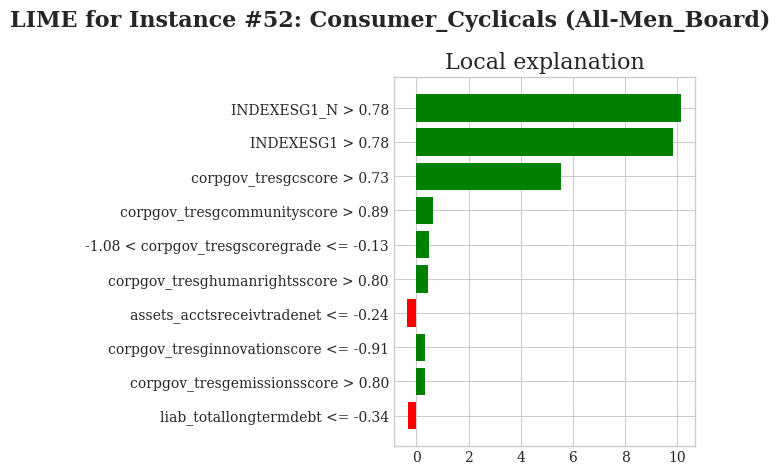


--- LIME: Explanation for Test Instance #104 ---
Model Prediction for this instance: 46.85


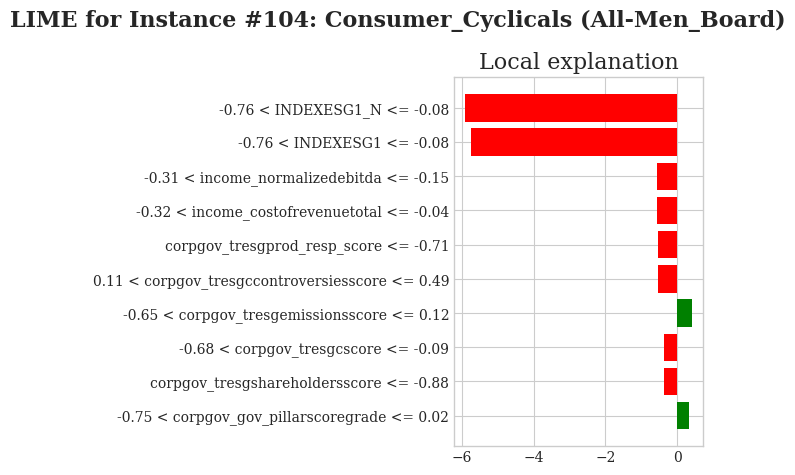



--- XAI Analysis for Scenario: Consumer_Cyclicals | Subset: All_Board_Types ---
1. Loading artifacts...
   Artifacts loaded successfully.

2. Running SHAP Analysis...


  0%|          | 0/50 [00:00<?, ?it/s]

   SHAP values calculated.

--- SHAP: Global Feature Importance ---


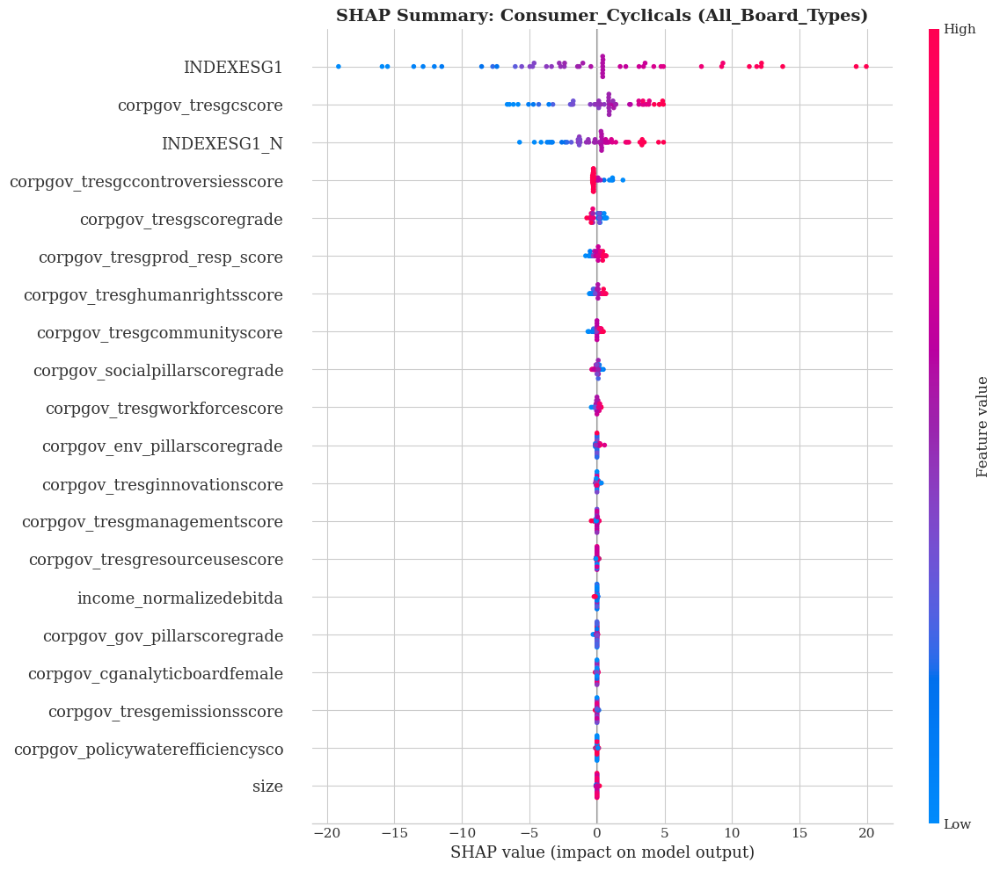


--- SHAP: Feature Contribution by Category ---


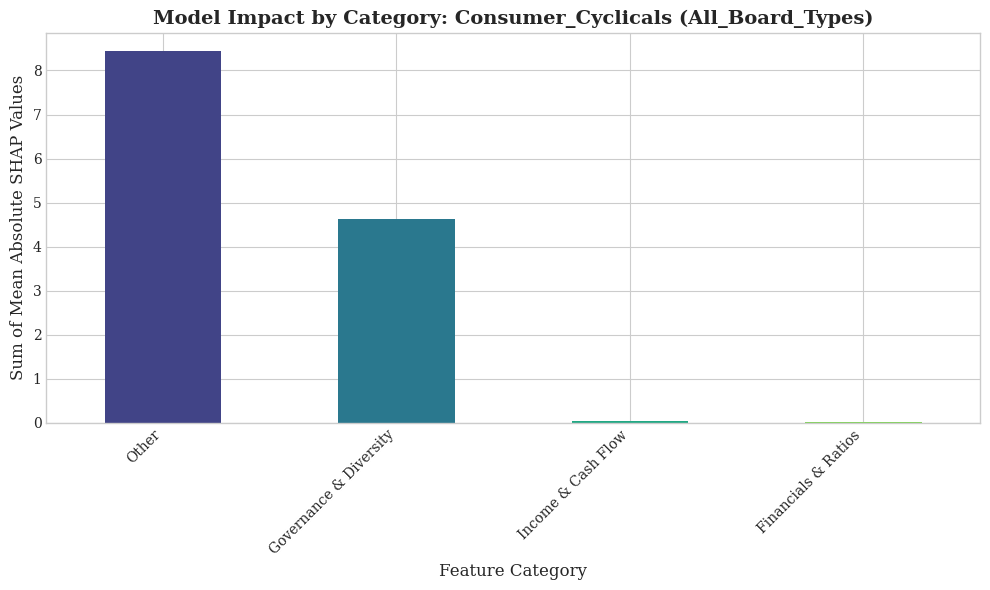


3. Running LIME Analysis...

--- LIME: Explanation for Test Instance #0 ---
Model Prediction for this instance: 32.30


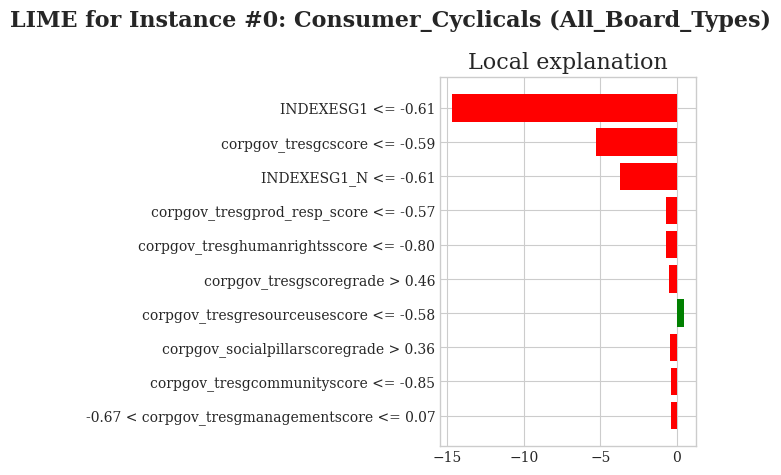


--- LIME: Explanation for Test Instance #330 ---
Model Prediction for this instance: 59.82


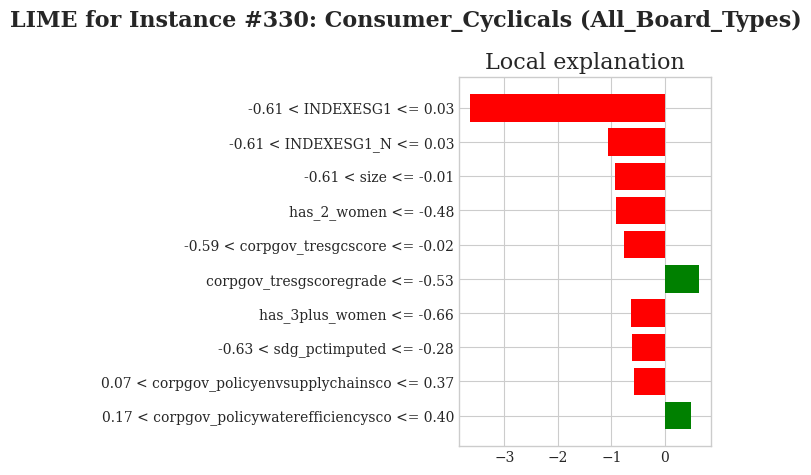


--- LIME: Explanation for Test Instance #661 ---
Model Prediction for this instance: 64.33


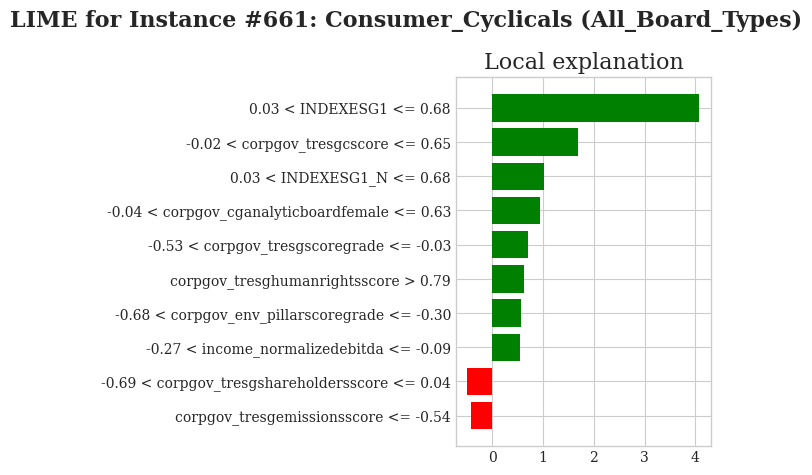



--- XAI Analysis for Scenario: Consumer_Cyclicals | Subset: Diverse_Board ---
1. Loading artifacts...
   Artifacts loaded successfully.

2. Running SHAP Analysis...


  0%|          | 0/50 [00:00<?, ?it/s]

   SHAP values calculated.

--- SHAP: Global Feature Importance ---


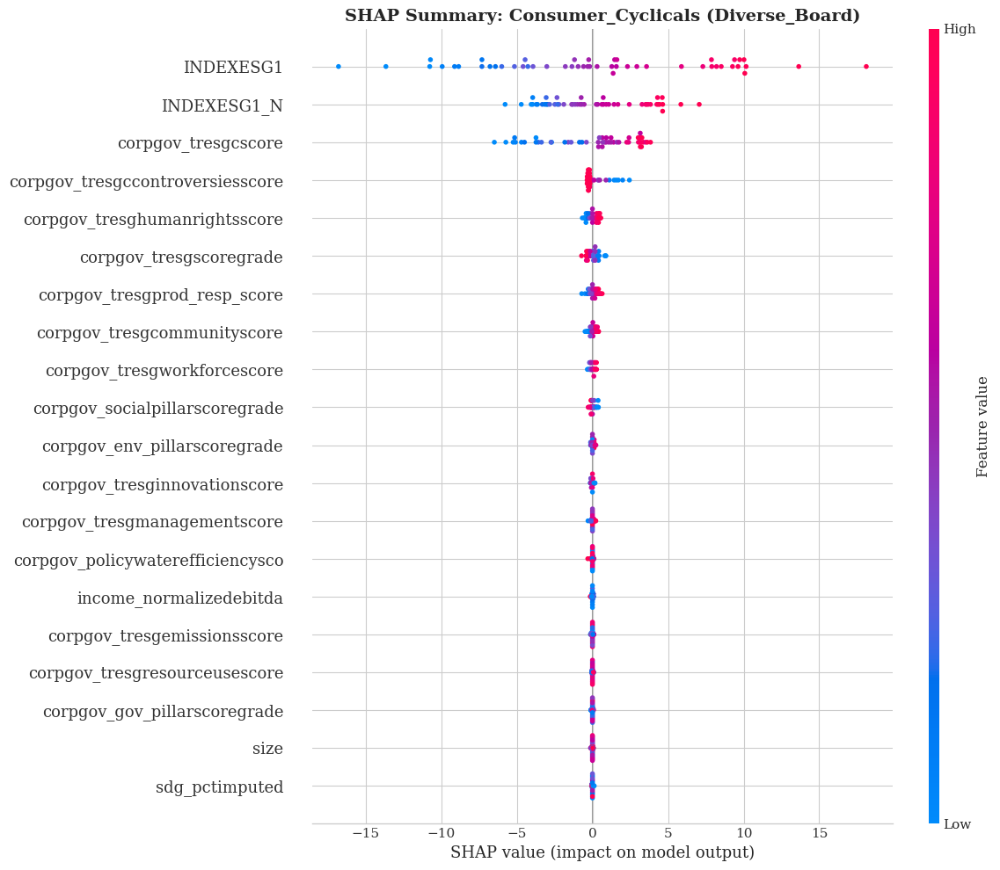


--- SHAP: Feature Contribution by Category ---


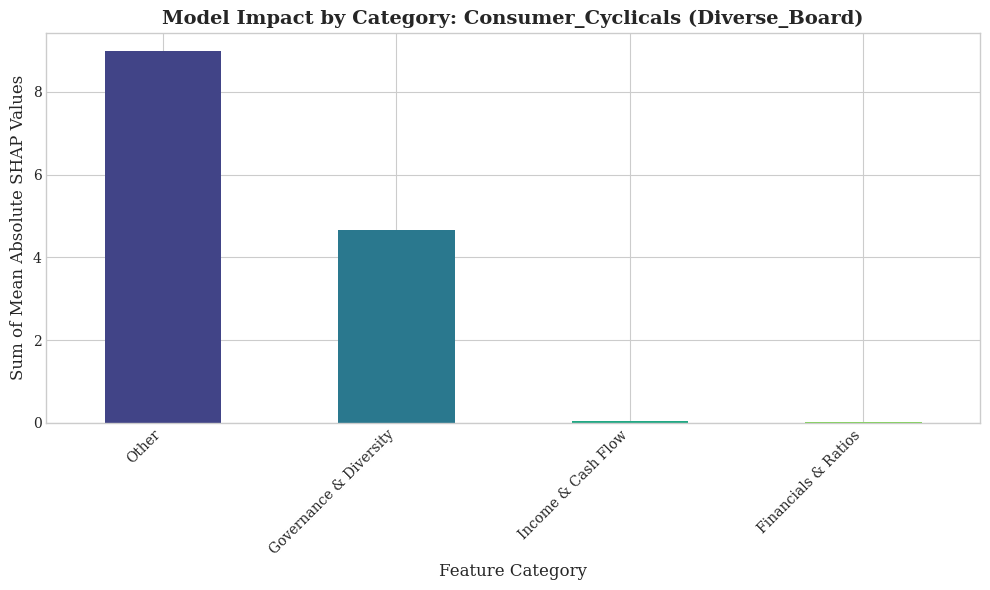


3. Running LIME Analysis...

--- LIME: Explanation for Test Instance #0 ---
Model Prediction for this instance: 85.85


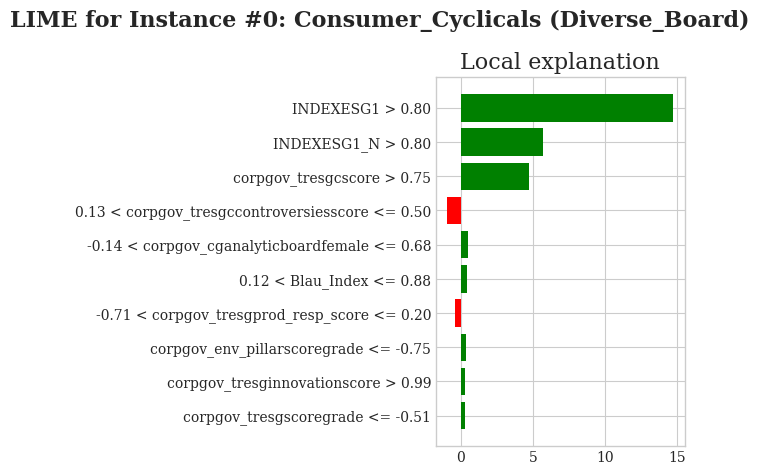


--- LIME: Explanation for Test Instance #219 ---
Model Prediction for this instance: 68.67


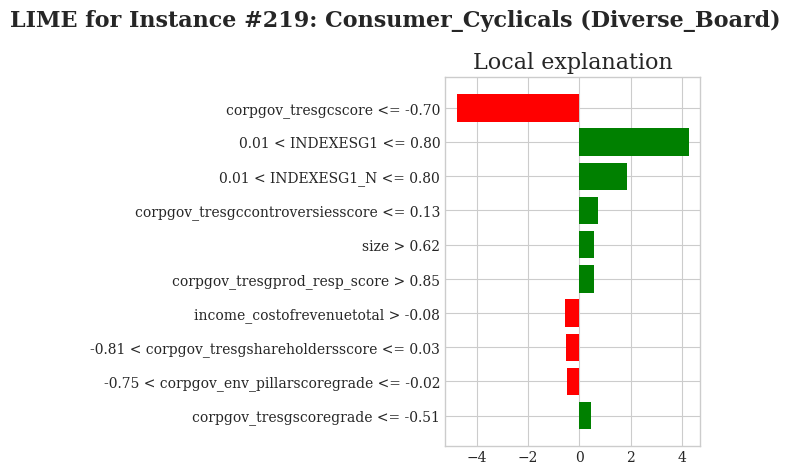


--- LIME: Explanation for Test Instance #439 ---
Model Prediction for this instance: 65.55


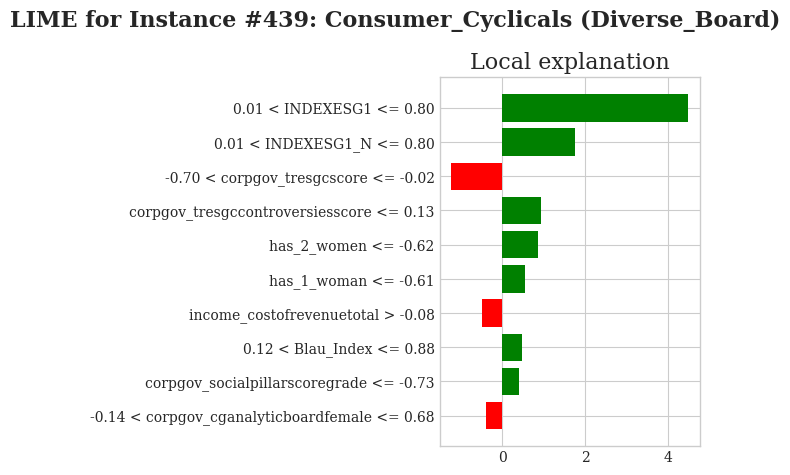



--- XAI Analysis for Scenario: Real_Estate | Subset: All-Men_Board ---
1. Loading artifacts...
   Artifacts loaded successfully.

2. Running SHAP Analysis...


  0%|          | 0/44 [00:00<?, ?it/s]

   SHAP values calculated.

--- SHAP: Global Feature Importance ---


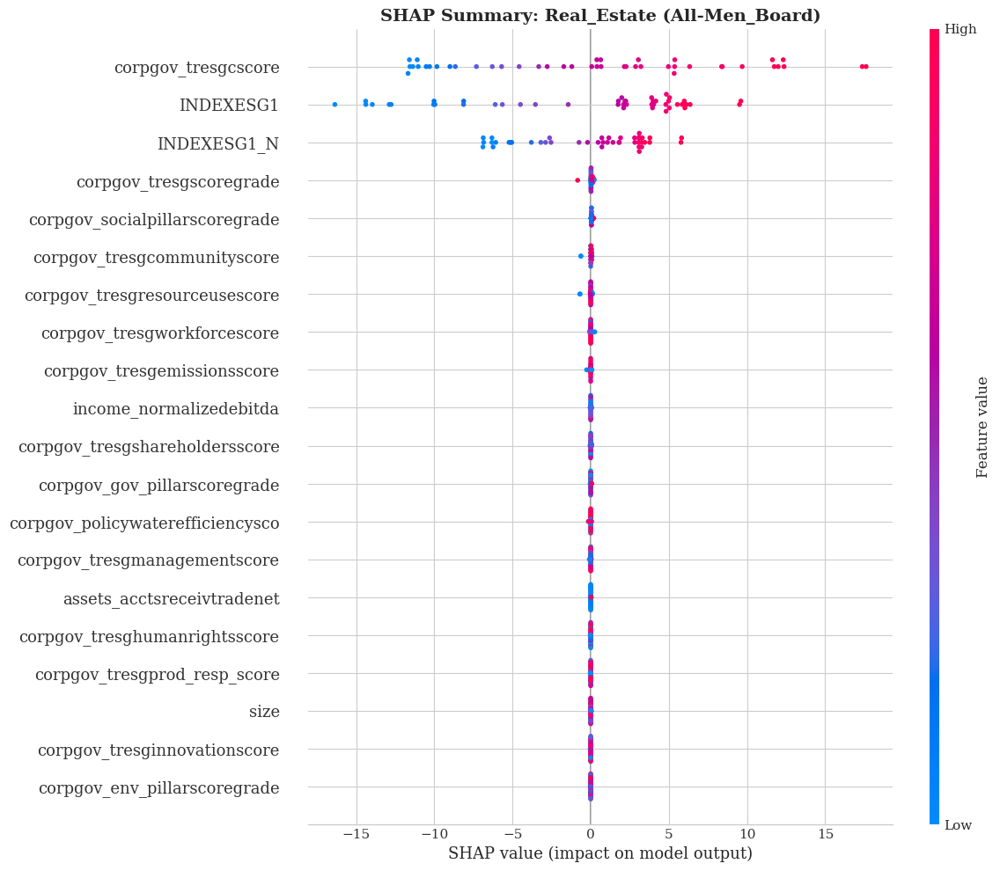


--- SHAP: Feature Contribution by Category ---


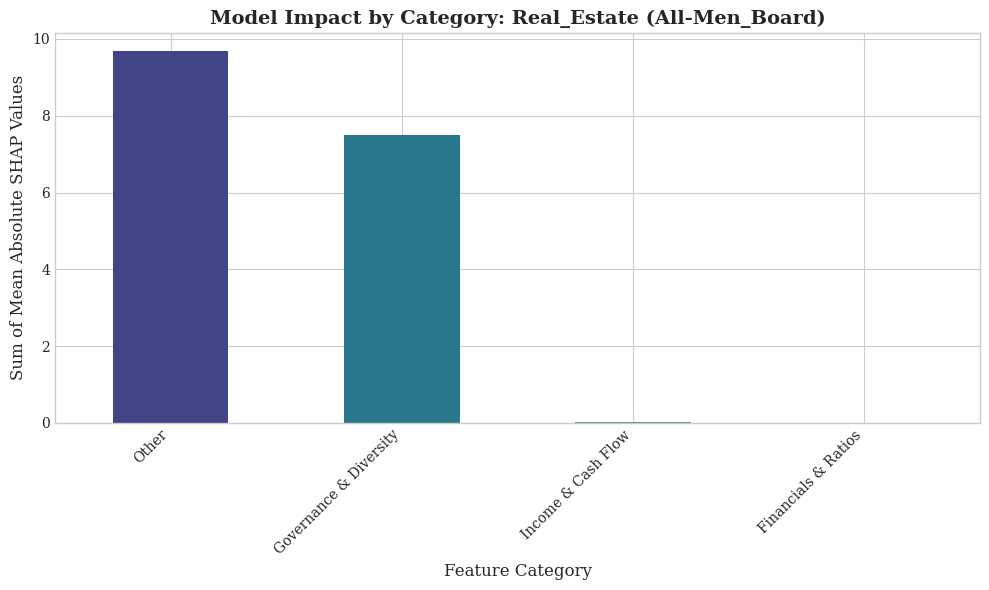


3. Running LIME Analysis...

--- LIME: Explanation for Test Instance #0 ---
Model Prediction for this instance: 62.17


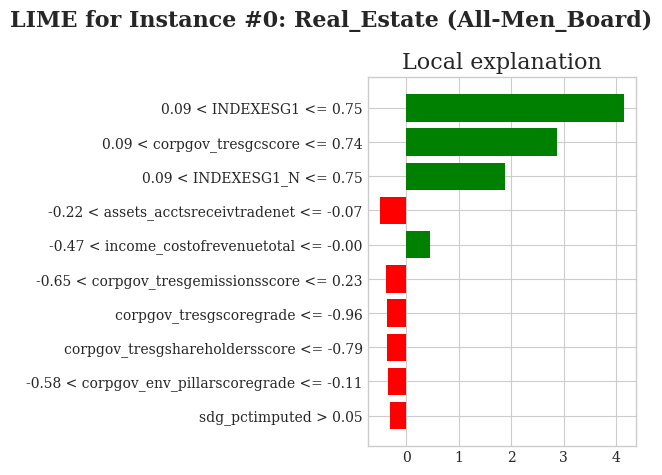


--- LIME: Explanation for Test Instance #21 ---
Model Prediction for this instance: 51.23


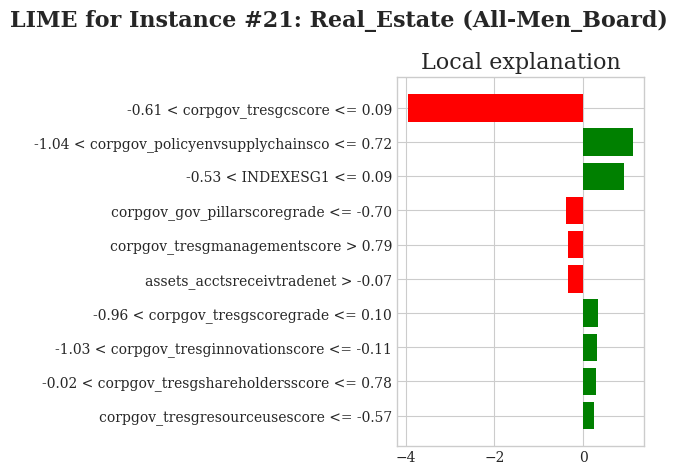


--- LIME: Explanation for Test Instance #43 ---
Model Prediction for this instance: 68.66


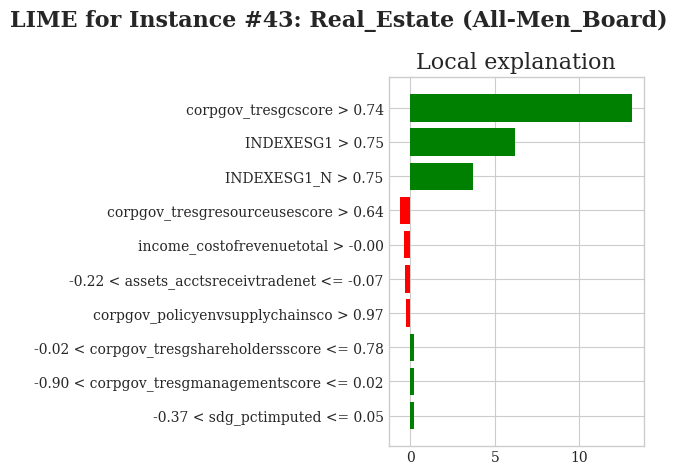



--- XAI Analysis for Scenario: Real_Estate | Subset: All_Board_Types ---
1. Loading artifacts...
   Artifacts loaded successfully.

2. Running SHAP Analysis...


  0%|          | 0/50 [00:00<?, ?it/s]

   SHAP values calculated.

--- SHAP: Global Feature Importance ---


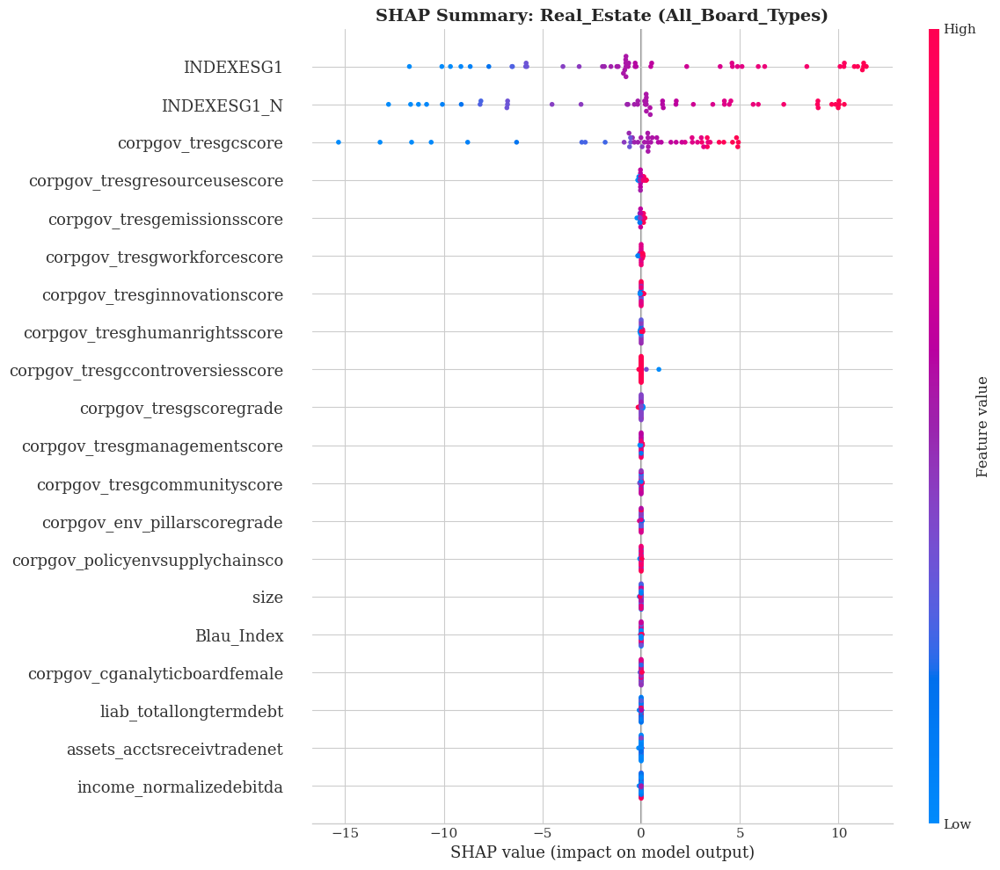


--- SHAP: Feature Contribution by Category ---


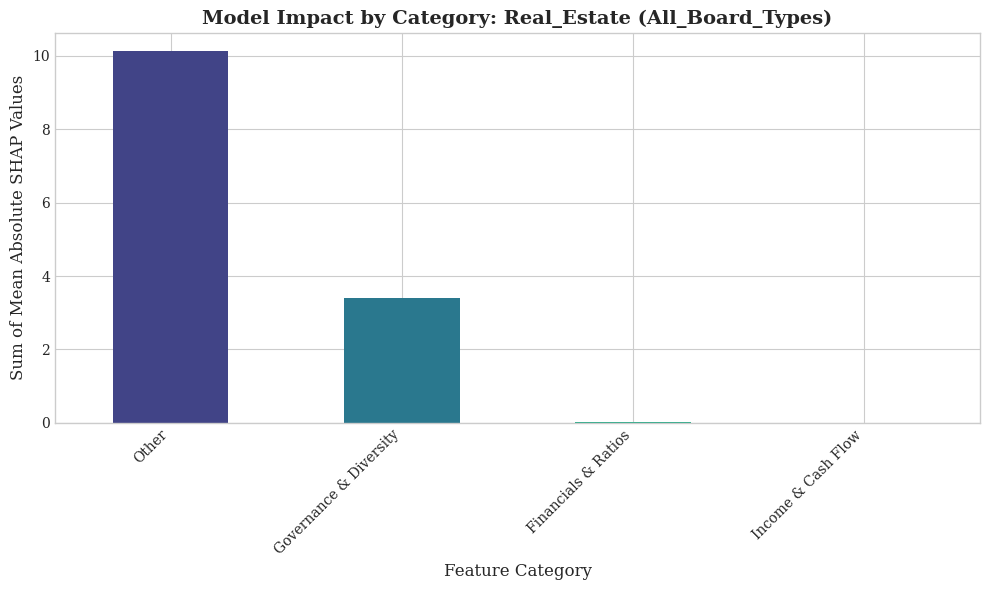


3. Running LIME Analysis...

--- LIME: Explanation for Test Instance #0 ---
Model Prediction for this instance: 61.92


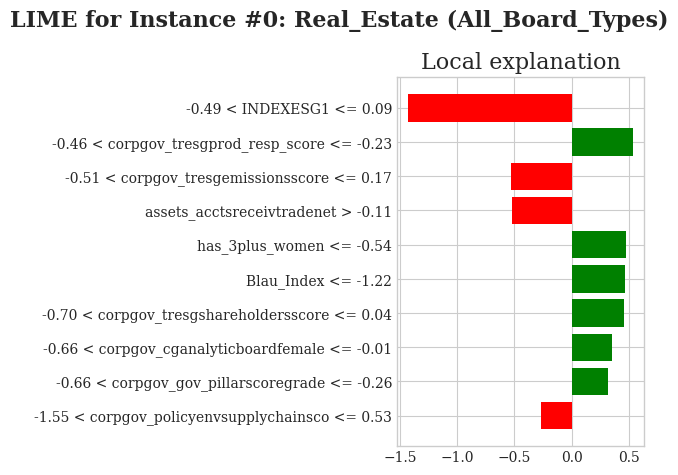


--- LIME: Explanation for Test Instance #178 ---
Model Prediction for this instance: 42.69


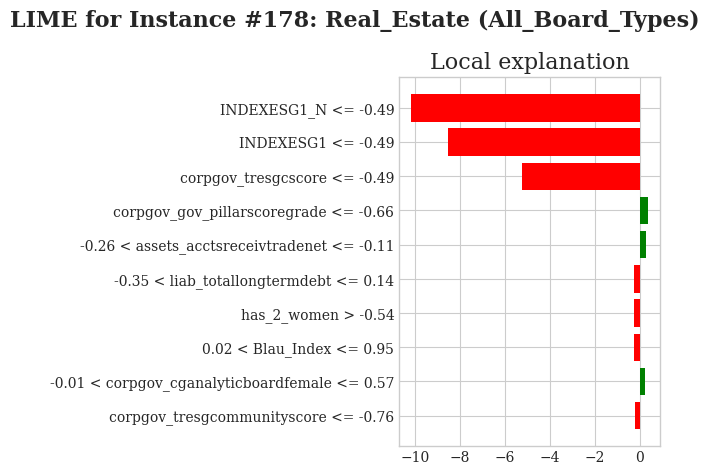


--- LIME: Explanation for Test Instance #357 ---
Model Prediction for this instance: 61.90


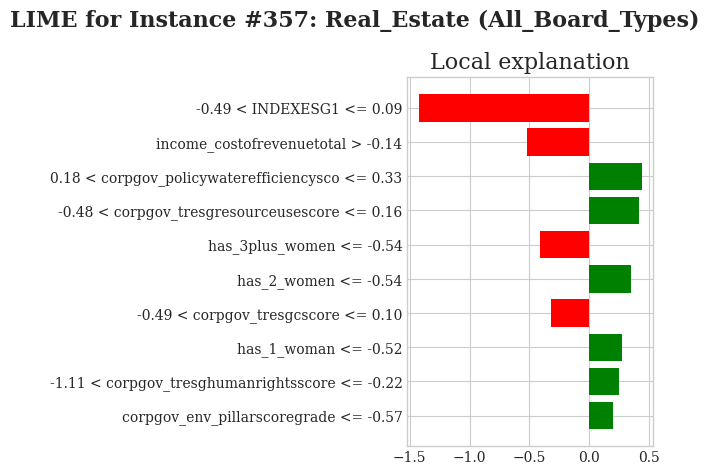



--- XAI Analysis for Scenario: Real_Estate | Subset: Diverse_Board ---
1. Loading artifacts...
   Artifacts loaded successfully.

2. Running SHAP Analysis...


  0%|          | 0/50 [00:00<?, ?it/s]

   SHAP values calculated.

--- SHAP: Global Feature Importance ---


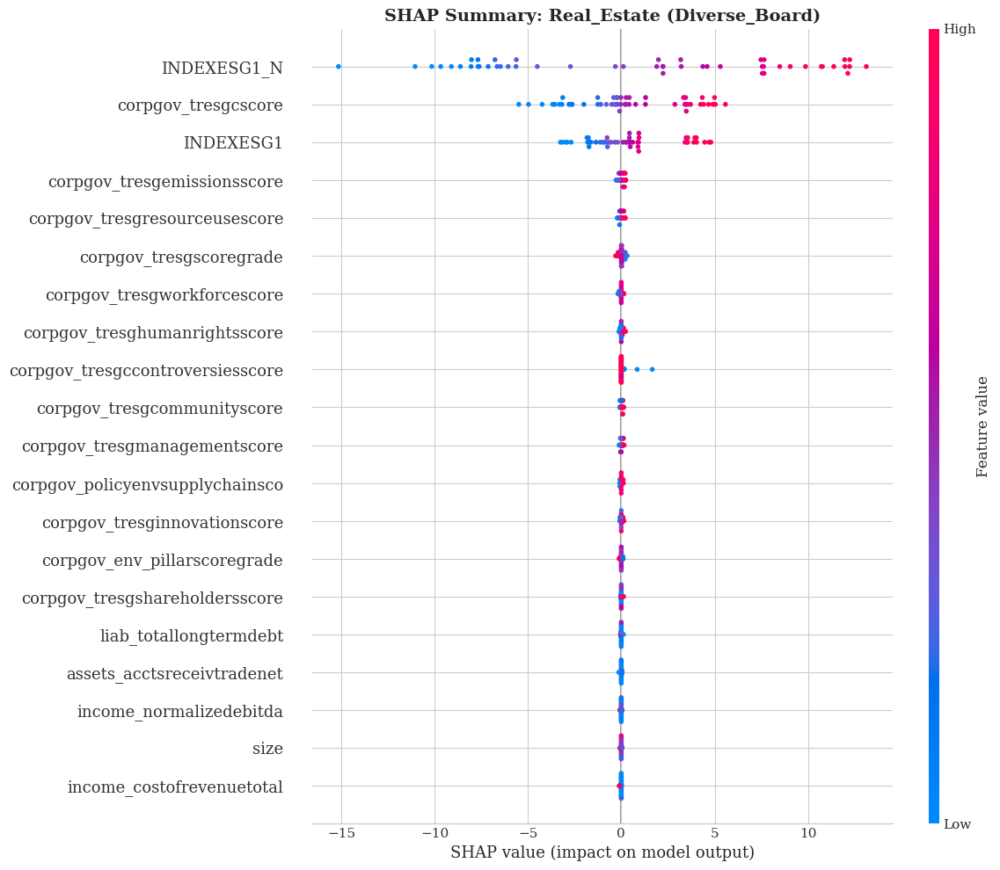


--- SHAP: Feature Contribution by Category ---


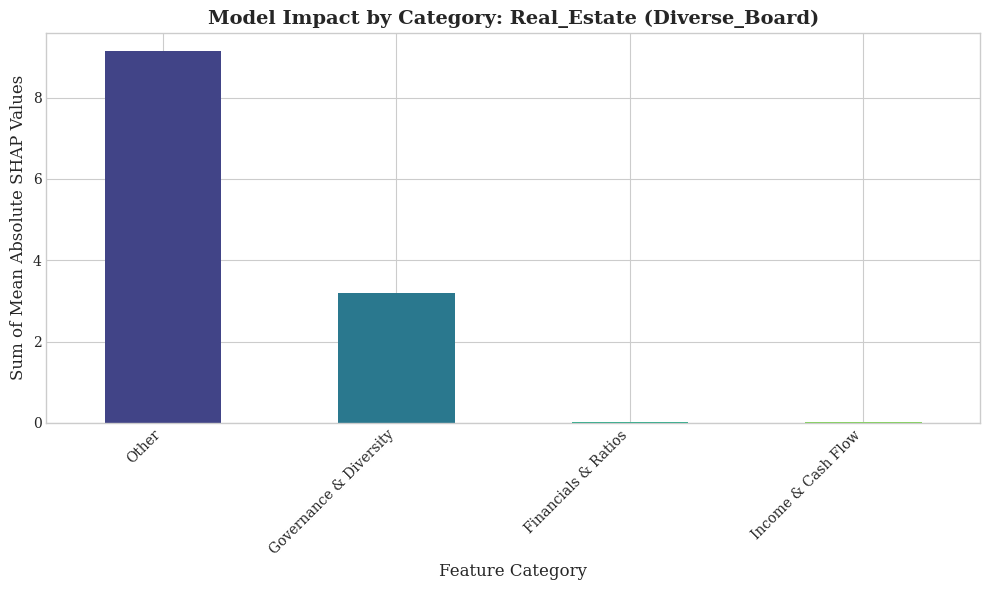


3. Running LIME Analysis...

--- LIME: Explanation for Test Instance #0 ---
Model Prediction for this instance: 57.78


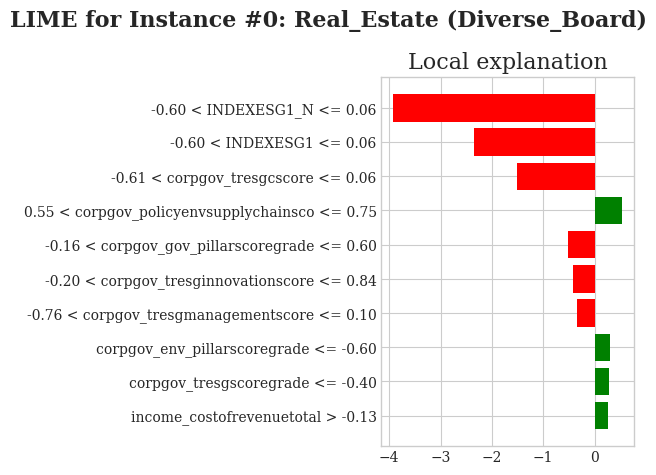


--- LIME: Explanation for Test Instance #122 ---
Model Prediction for this instance: 80.89


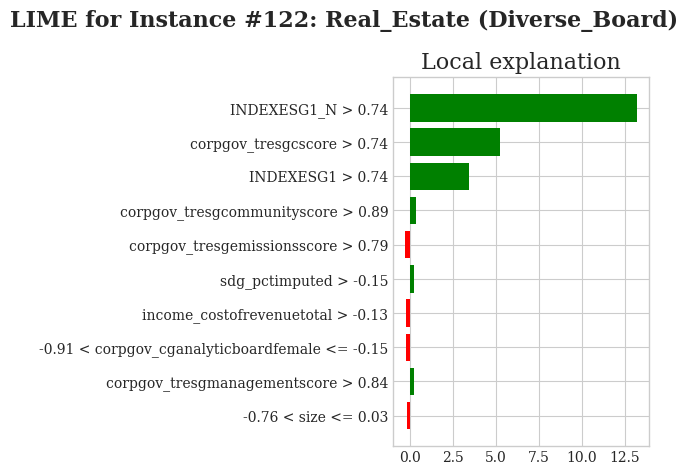


--- LIME: Explanation for Test Instance #244 ---
Model Prediction for this instance: 41.98


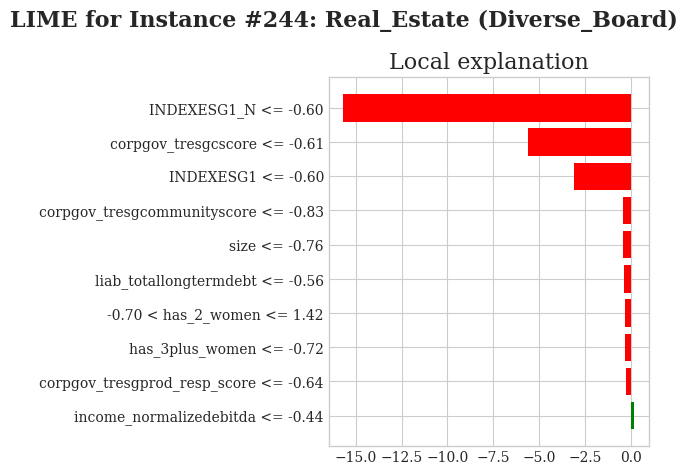



--- XAI Analysis for Scenario: Healthcare | Subset: All-Men_Board ---
1. Loading artifacts...
   Artifacts loaded successfully.

2. Running SHAP Analysis...


  0%|          | 0/22 [00:00<?, ?it/s]

   SHAP values calculated.

--- SHAP: Global Feature Importance ---


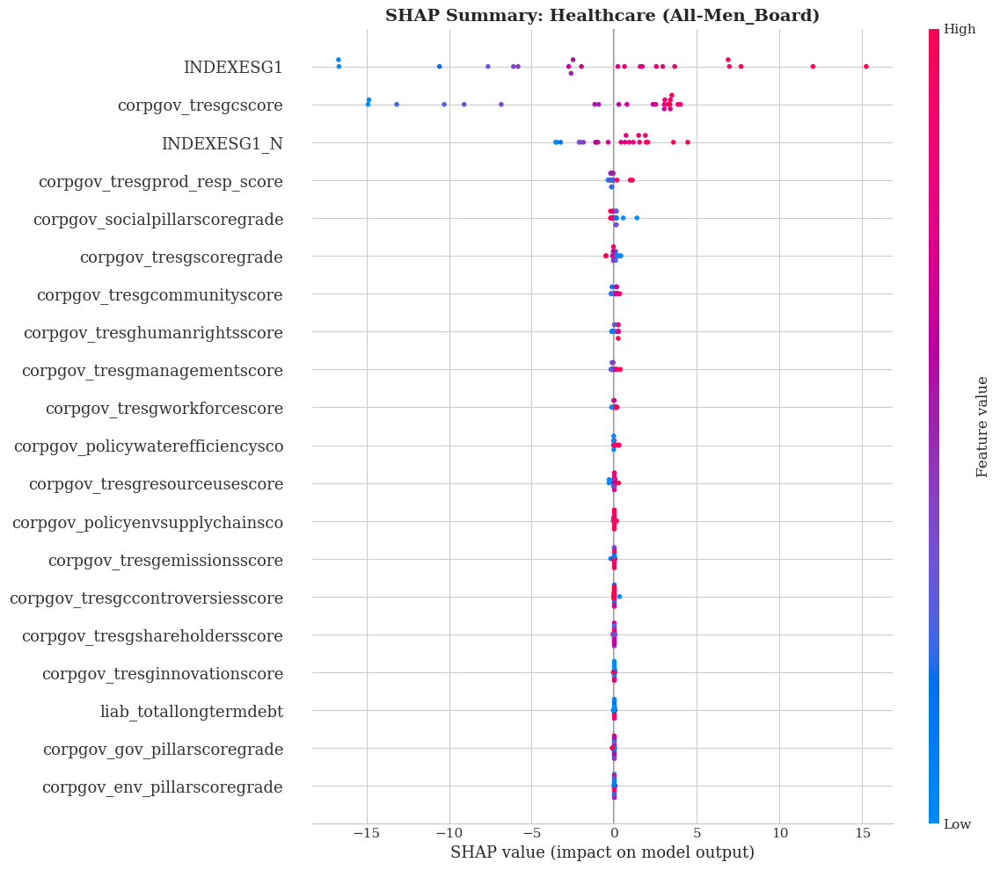


--- SHAP: Feature Contribution by Category ---


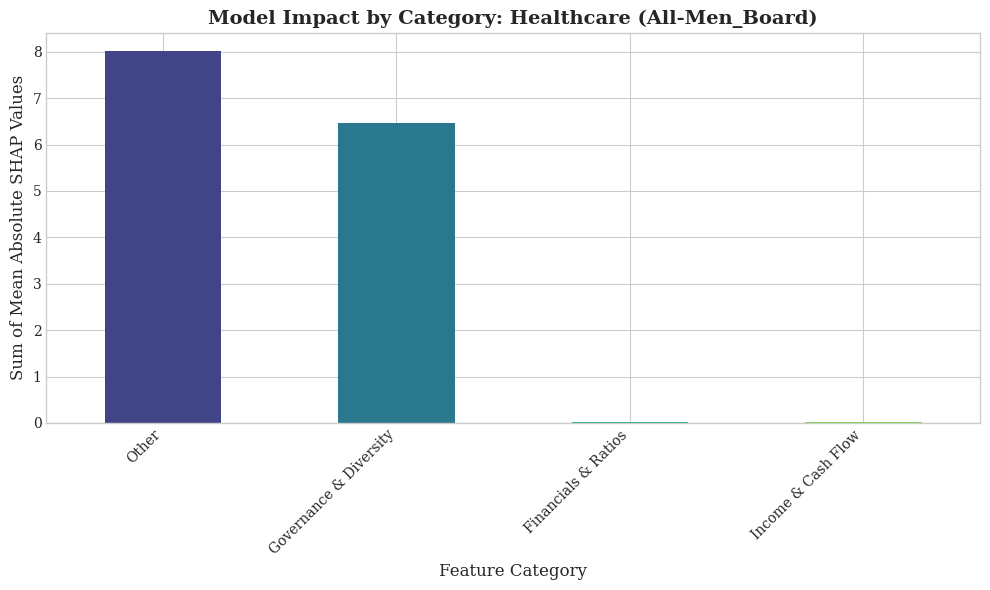


3. Running LIME Analysis...

--- LIME: Explanation for Test Instance #0 ---
Model Prediction for this instance: 64.39


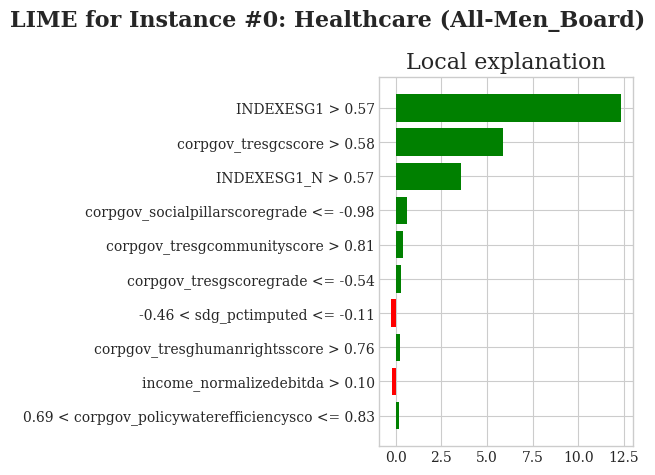


--- LIME: Explanation for Test Instance #10 ---
Model Prediction for this instance: 68.28


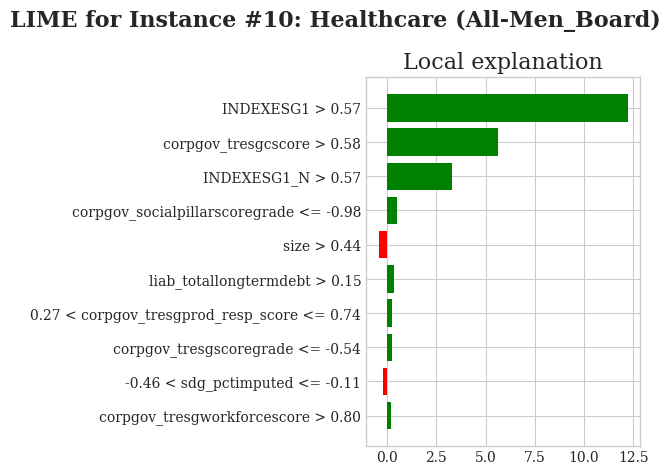


--- LIME: Explanation for Test Instance #21 ---
Model Prediction for this instance: 82.51


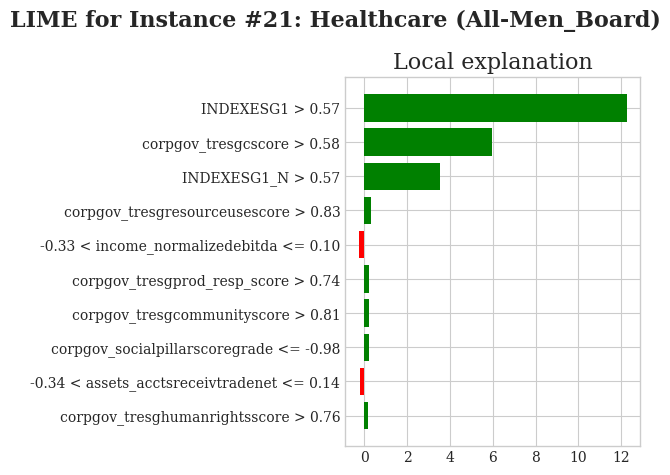



--- XAI Analysis for Scenario: Healthcare | Subset: All_Board_Types ---
1. Loading artifacts...
   Artifacts loaded successfully.

2. Running SHAP Analysis...


  0%|          | 0/50 [00:00<?, ?it/s]

   SHAP values calculated.

--- SHAP: Global Feature Importance ---


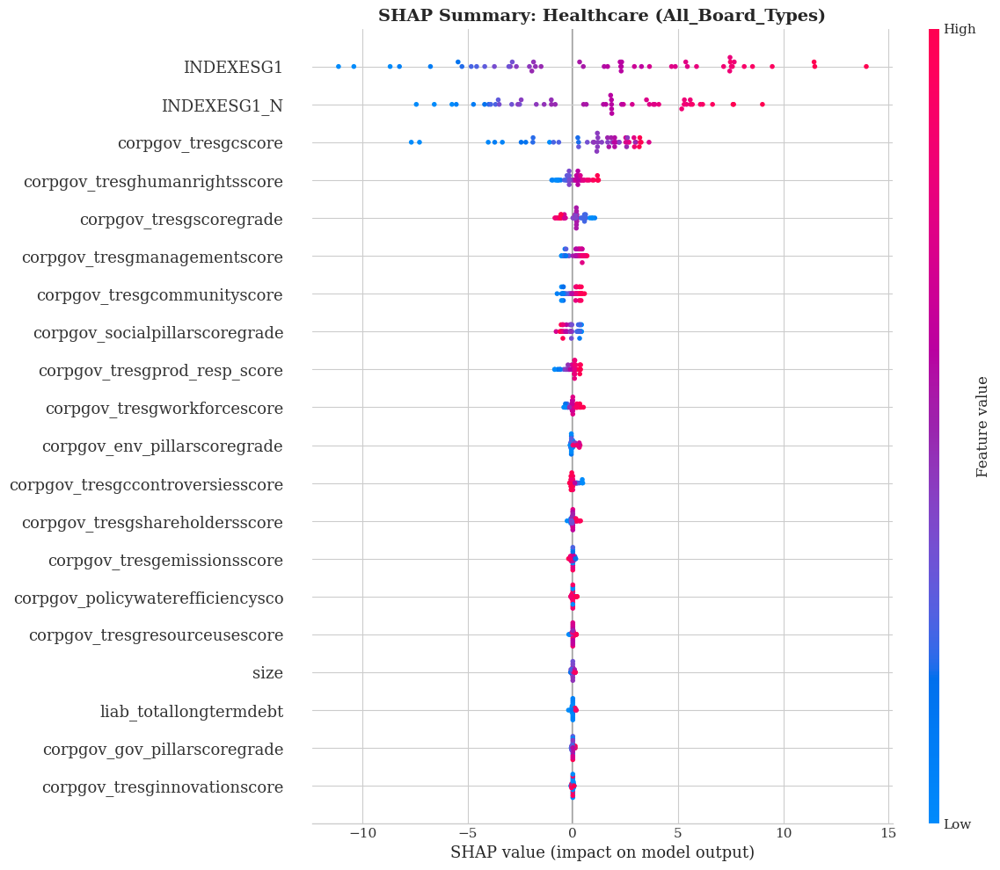


--- SHAP: Feature Contribution by Category ---


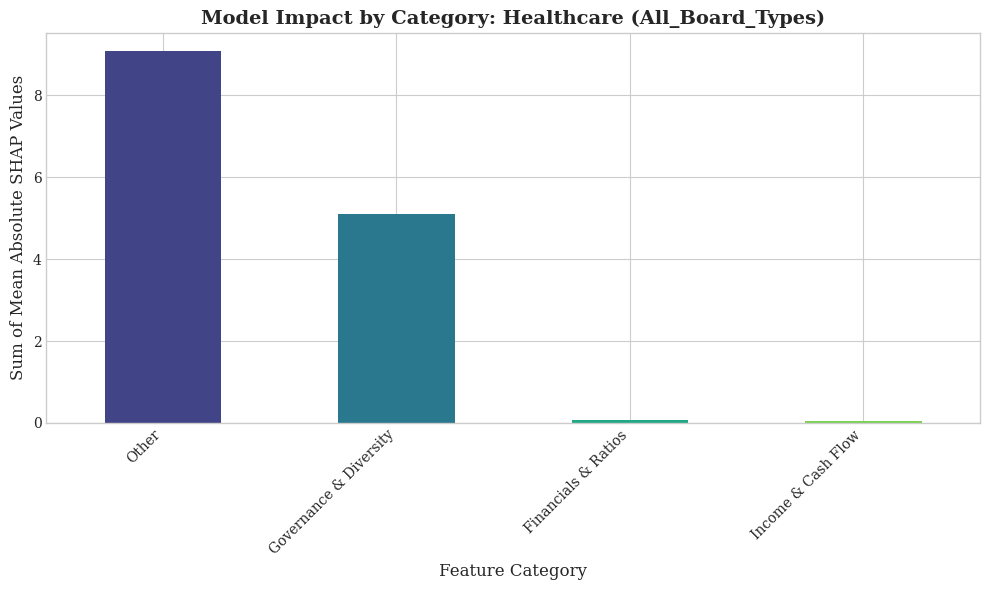


3. Running LIME Analysis...

--- LIME: Explanation for Test Instance #0 ---
Model Prediction for this instance: 59.45


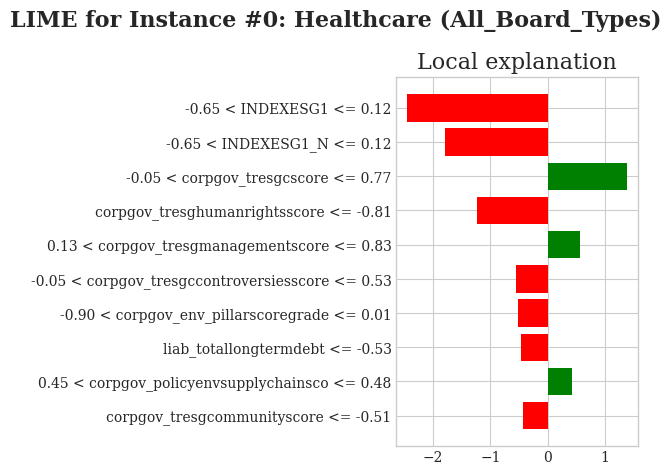


--- LIME: Explanation for Test Instance #103 ---
Model Prediction for this instance: 84.92


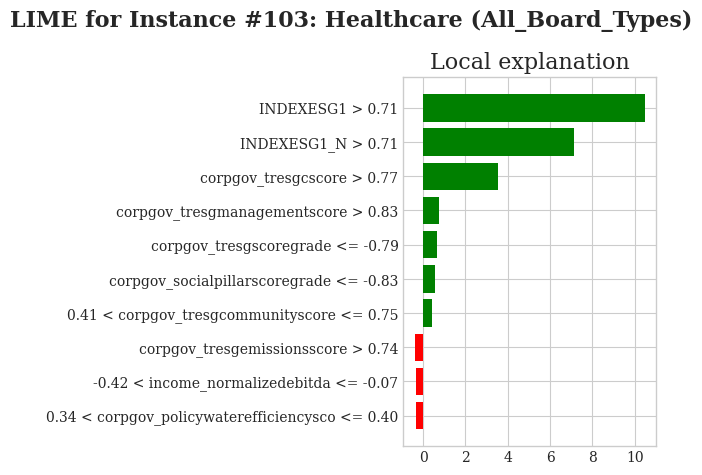


--- LIME: Explanation for Test Instance #206 ---
Model Prediction for this instance: 88.46


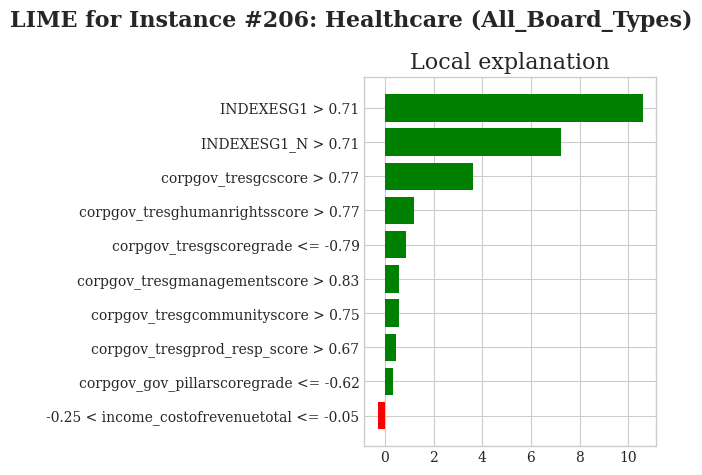



--- XAI Analysis for Scenario: Healthcare | Subset: Diverse_Board ---
1. Loading artifacts...
   Artifacts loaded successfully.

2. Running SHAP Analysis...


  0%|          | 0/50 [00:00<?, ?it/s]

   SHAP values calculated.

--- SHAP: Global Feature Importance ---


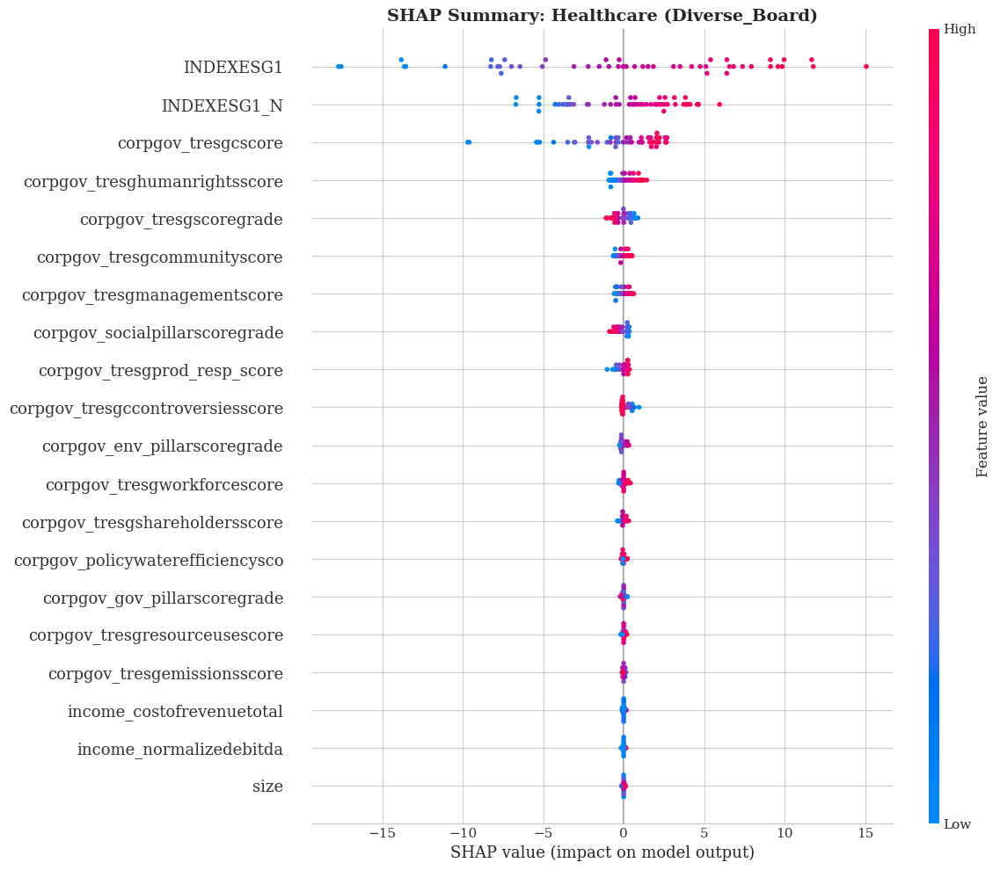


--- SHAP: Feature Contribution by Category ---


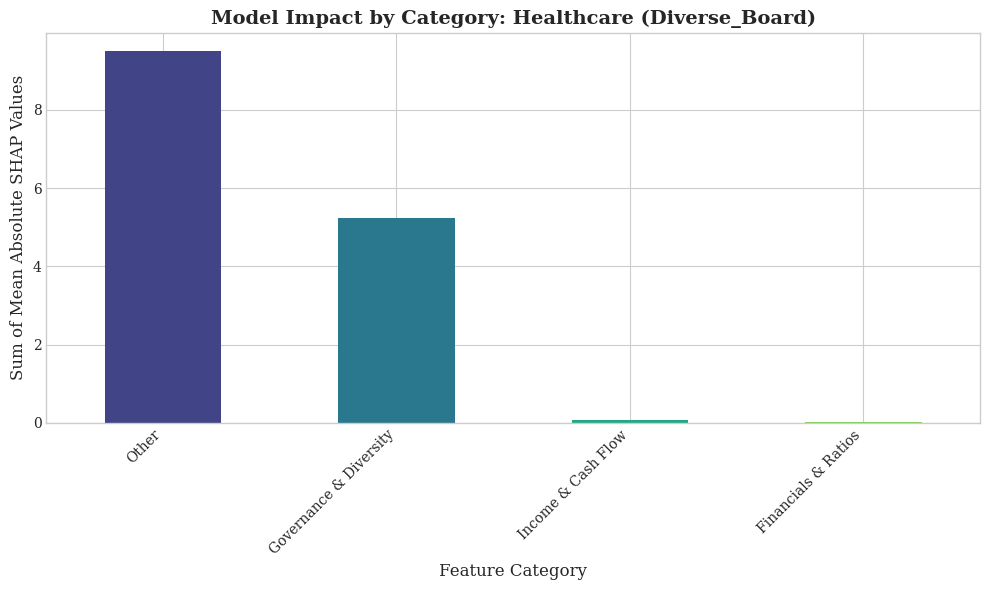


3. Running LIME Analysis...

--- LIME: Explanation for Test Instance #0 ---
Model Prediction for this instance: 54.52


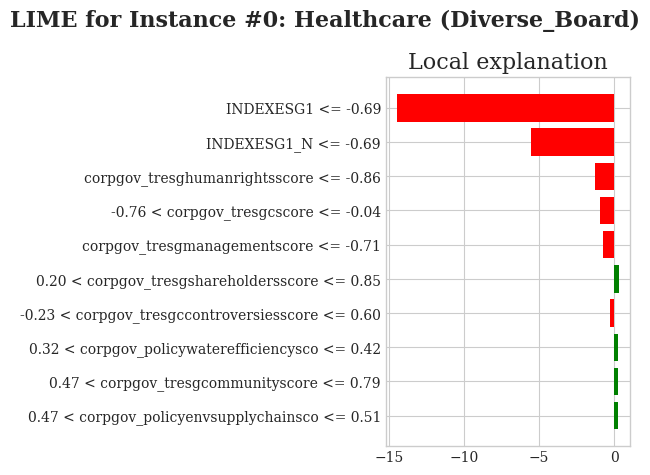


--- LIME: Explanation for Test Instance #78 ---
Model Prediction for this instance: 77.99


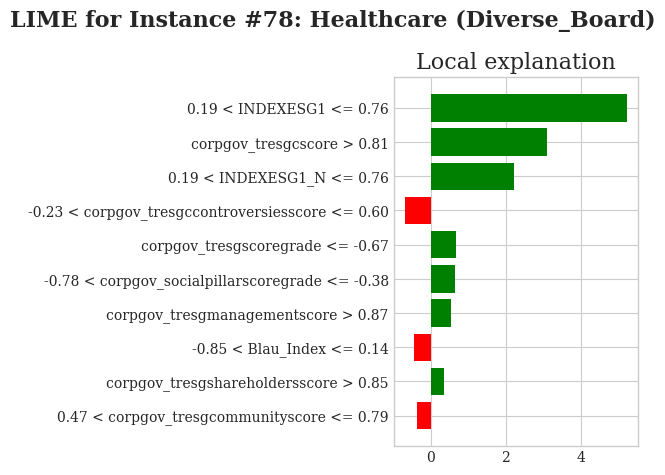


--- LIME: Explanation for Test Instance #157 ---
Model Prediction for this instance: 82.70


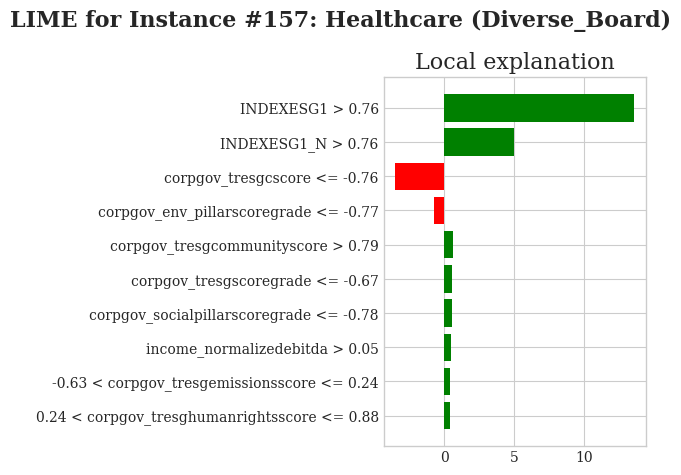



--- XAI Analysis for Scenario: Utilities | Subset: All-Men_Board ---
1. Loading artifacts...
   Artifacts loaded successfully.

2. Running SHAP Analysis...


  0%|          | 0/23 [00:00<?, ?it/s]

   SHAP values calculated.

--- SHAP: Global Feature Importance ---


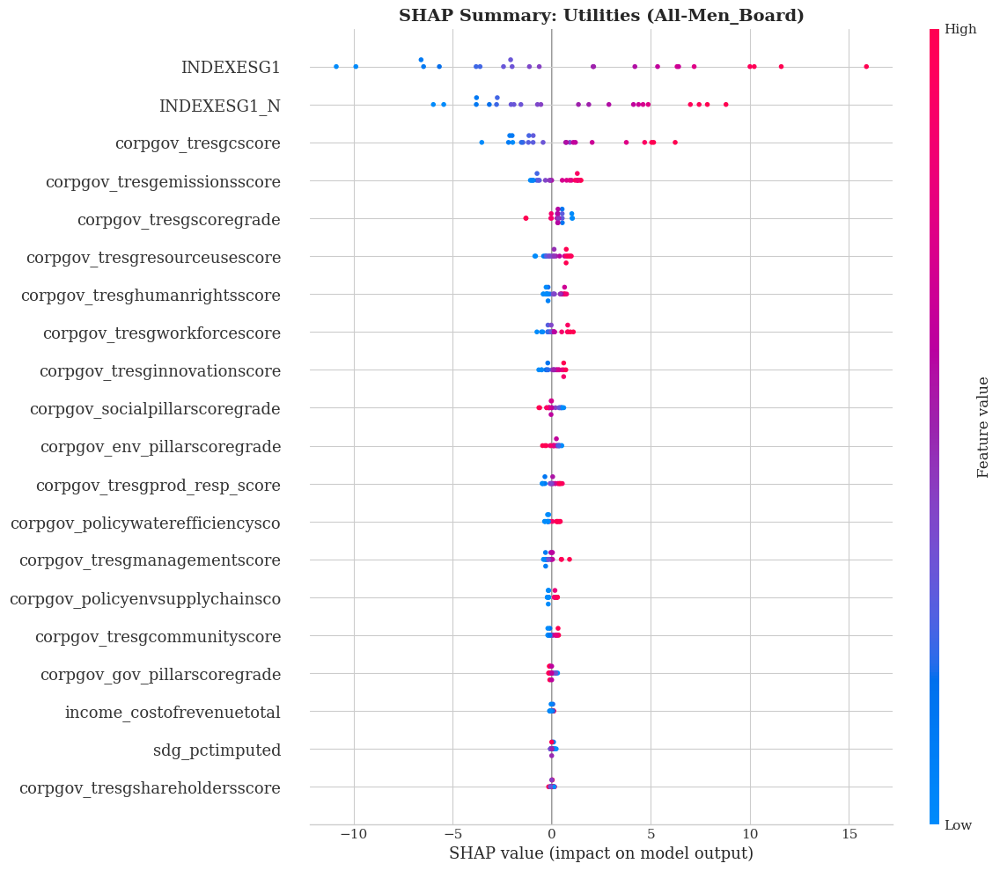


--- SHAP: Feature Contribution by Category ---


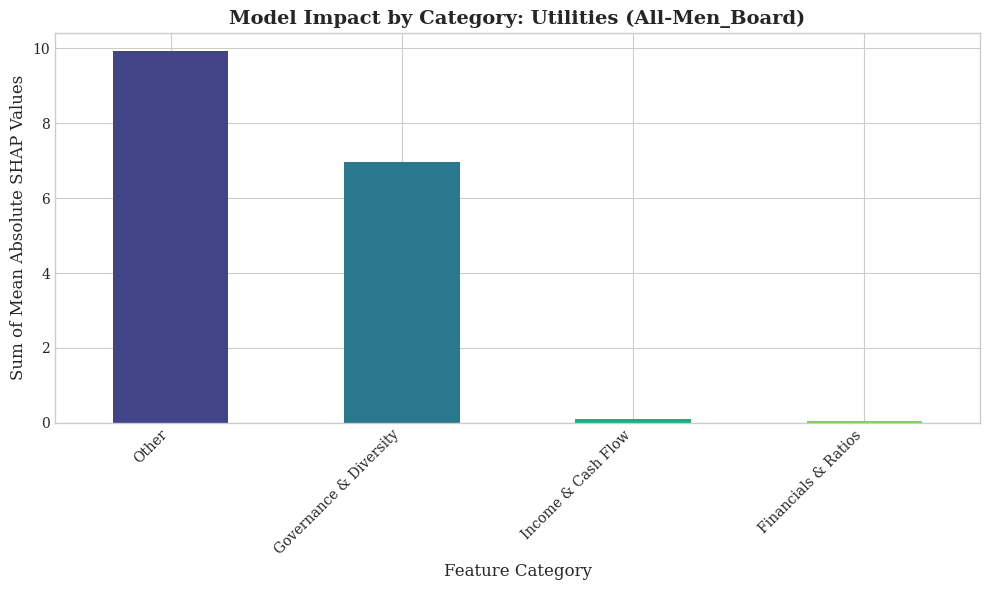


3. Running LIME Analysis...

--- LIME: Explanation for Test Instance #0 ---
Model Prediction for this instance: 27.37


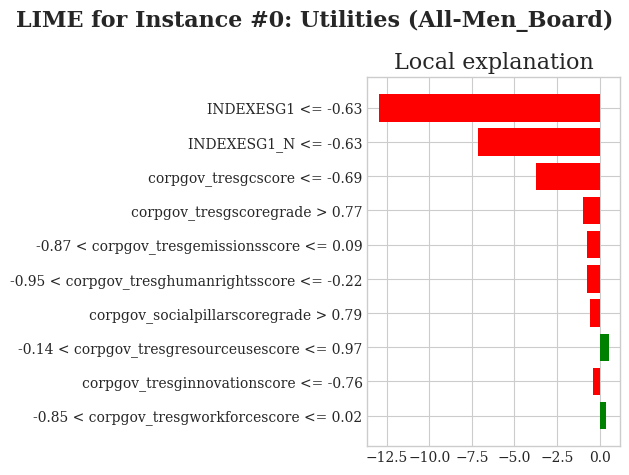


--- LIME: Explanation for Test Instance #11 ---
Model Prediction for this instance: 52.31


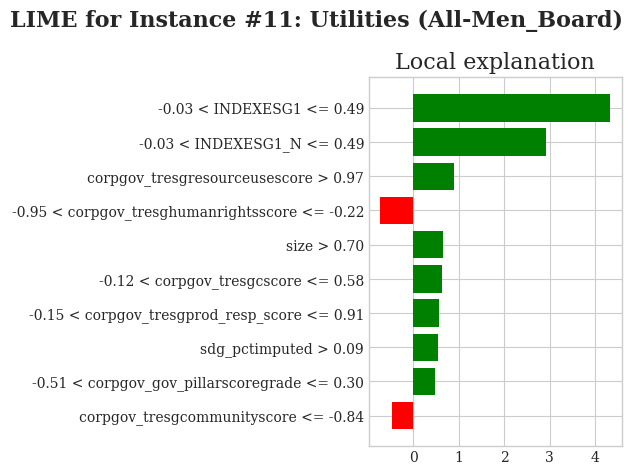


--- LIME: Explanation for Test Instance #22 ---
Model Prediction for this instance: 74.89


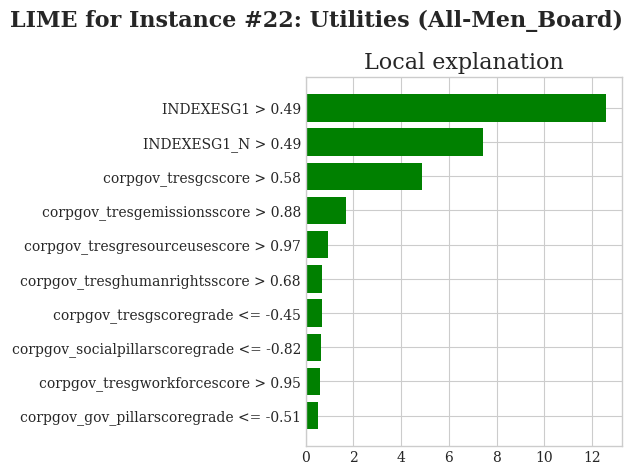



--- XAI Analysis for Scenario: Utilities | Subset: All_Board_Types ---
1. Loading artifacts...
   Artifacts loaded successfully.

2. Running SHAP Analysis...


  0%|          | 0/50 [00:00<?, ?it/s]

   SHAP values calculated.

--- SHAP: Global Feature Importance ---


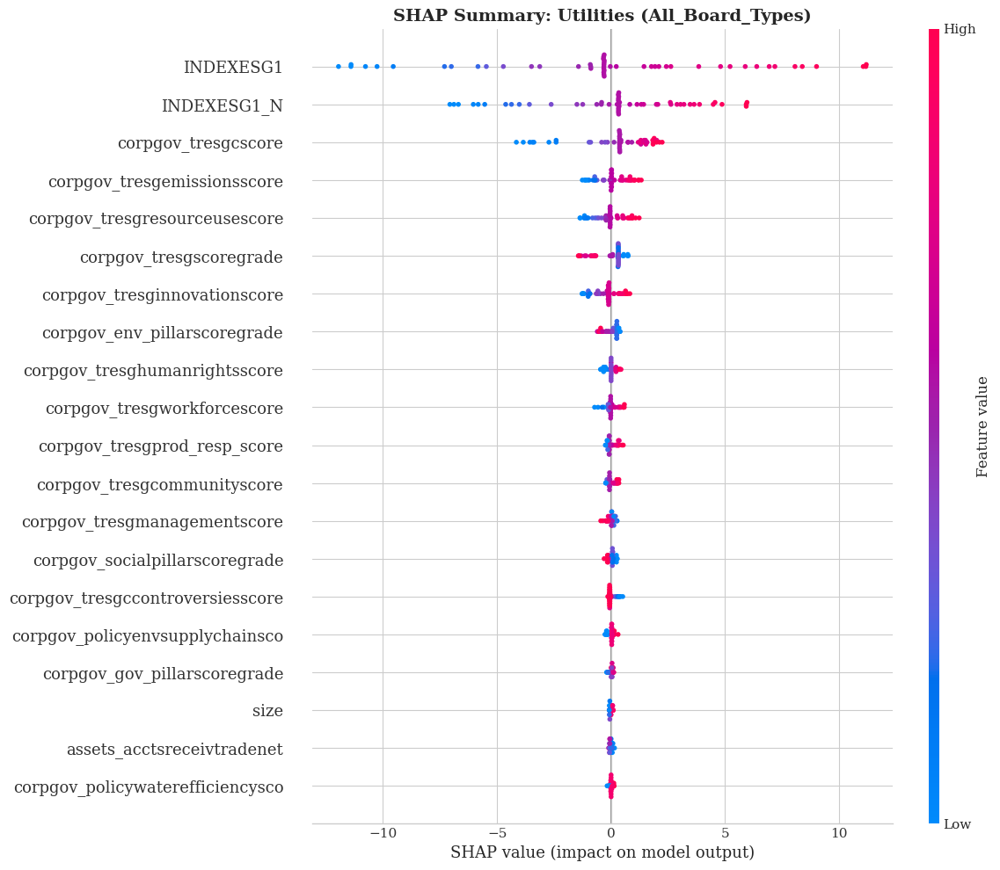


--- SHAP: Feature Contribution by Category ---


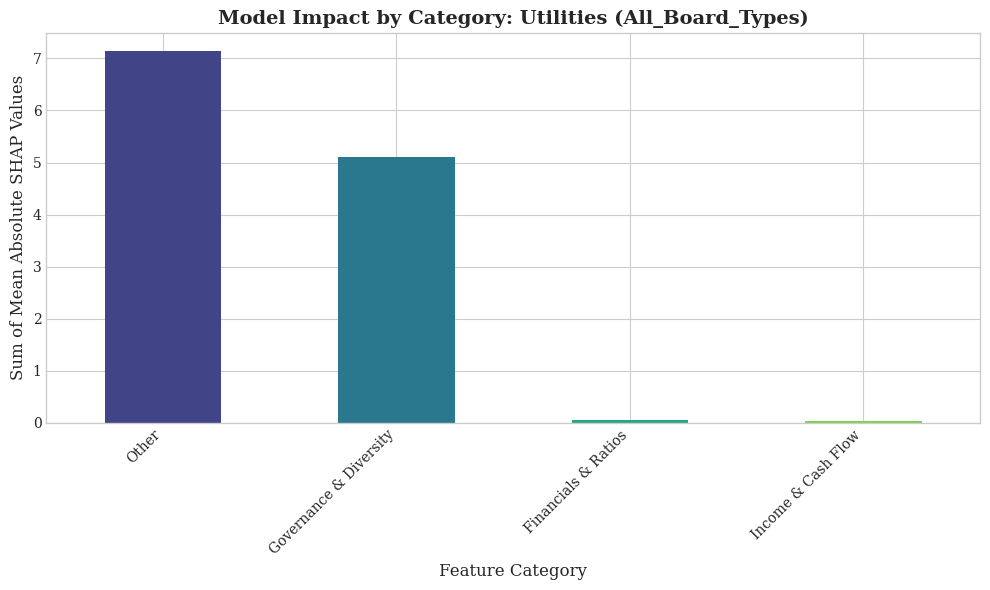


3. Running LIME Analysis...

--- LIME: Explanation for Test Instance #0 ---
Model Prediction for this instance: 30.94


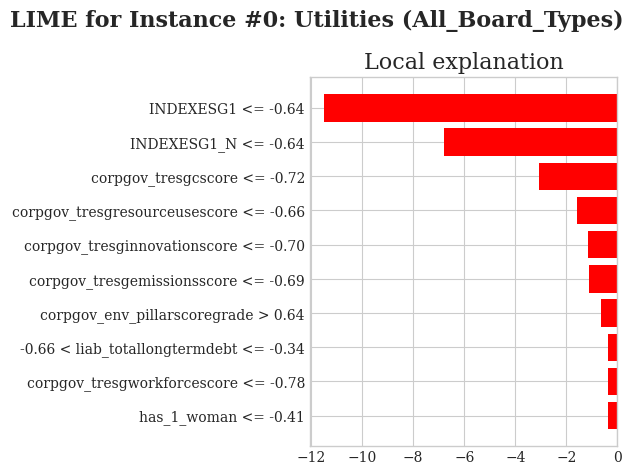


--- LIME: Explanation for Test Instance #96 ---
Model Prediction for this instance: 57.25


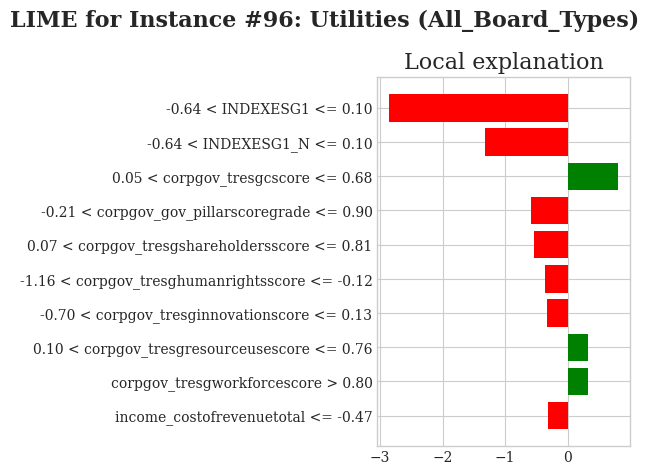


--- LIME: Explanation for Test Instance #193 ---
Model Prediction for this instance: 33.33


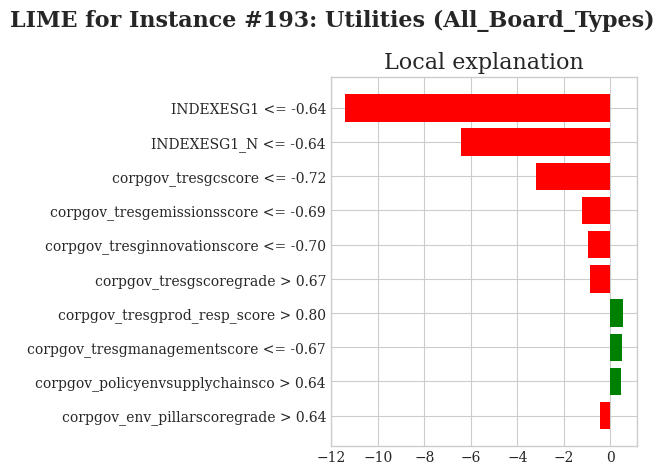



--- XAI Analysis for Scenario: Utilities | Subset: Diverse_Board ---
1. Loading artifacts...
   Artifacts loaded successfully.

2. Running SHAP Analysis...


  0%|          | 0/50 [00:00<?, ?it/s]

   SHAP values calculated.

--- SHAP: Global Feature Importance ---


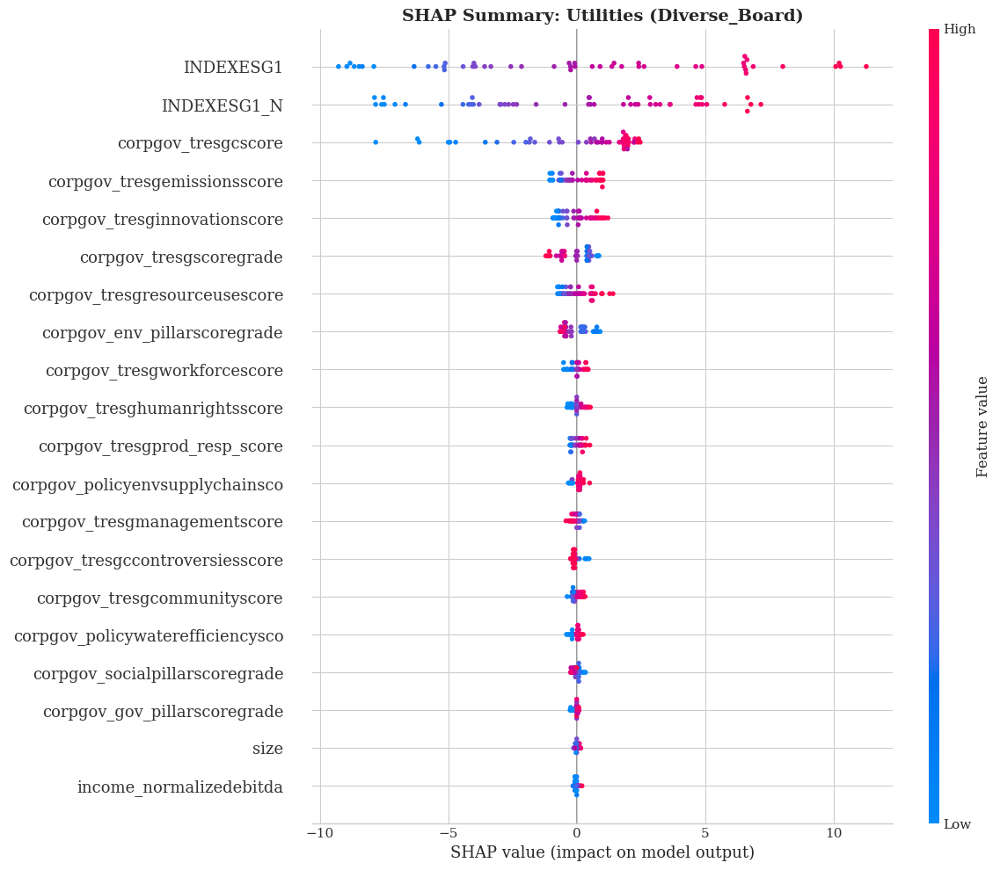


--- SHAP: Feature Contribution by Category ---


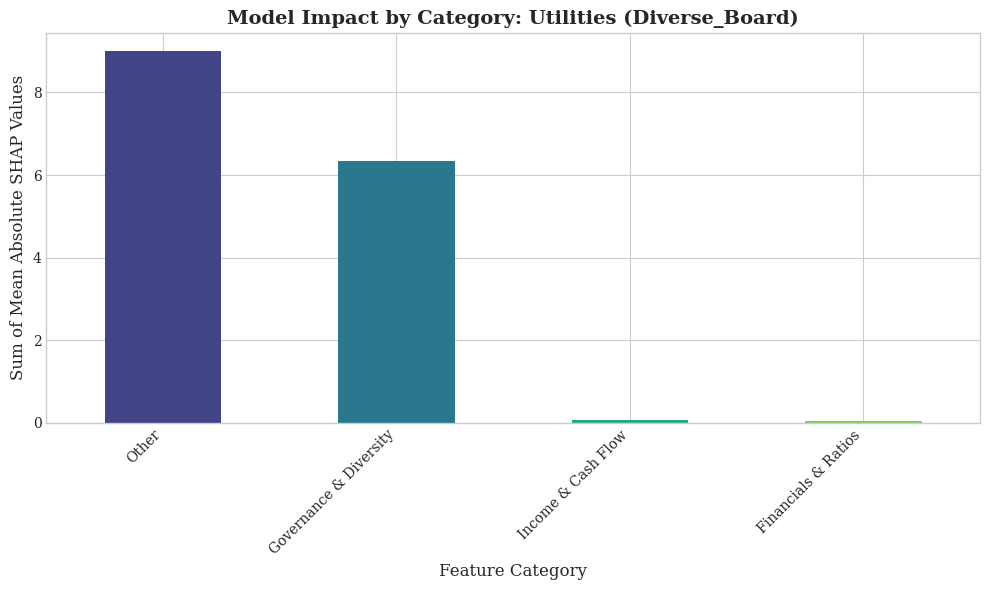


3. Running LIME Analysis...

--- LIME: Explanation for Test Instance #0 ---
Model Prediction for this instance: 71.19


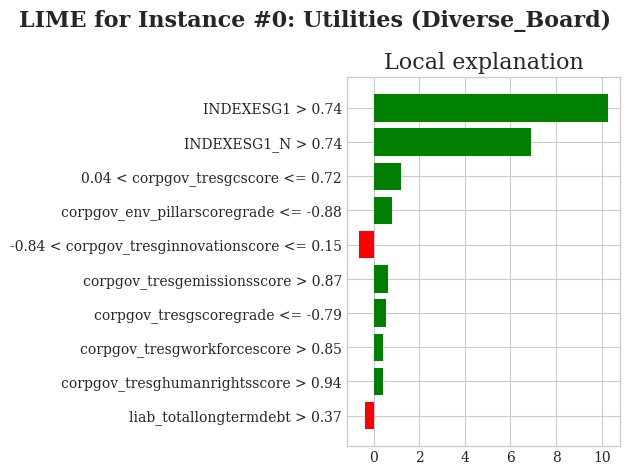


--- LIME: Explanation for Test Instance #73 ---
Model Prediction for this instance: 67.91


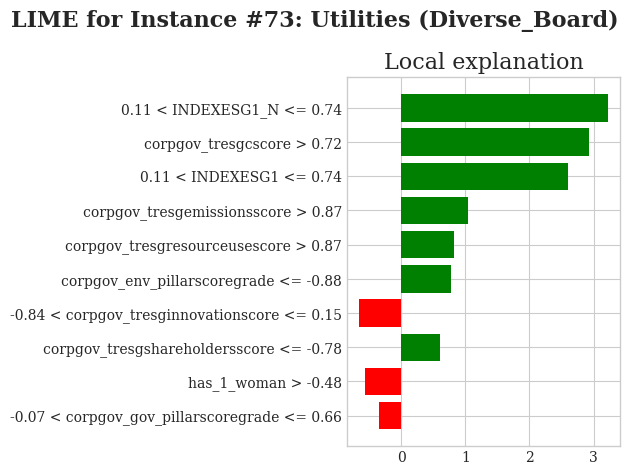


--- LIME: Explanation for Test Instance #146 ---
Model Prediction for this instance: 70.34


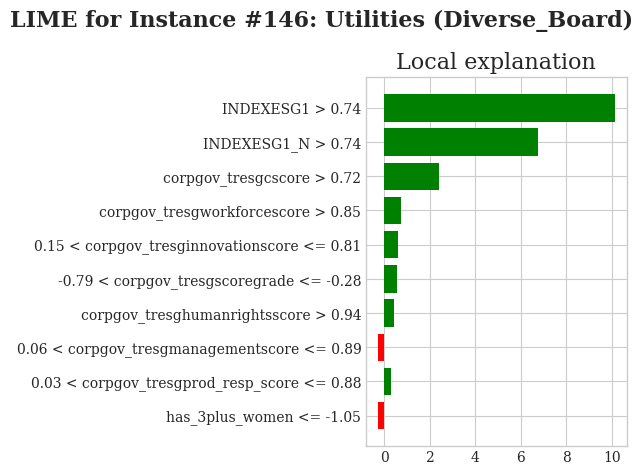



--- XAI Analysis for Scenario: Basic_Materials | Subset: All-Men_Board ---
1. Loading artifacts...
   Artifacts loaded successfully.

2. Running SHAP Analysis...


  0%|          | 0/50 [00:00<?, ?it/s]

   SHAP values calculated.

--- SHAP: Global Feature Importance ---


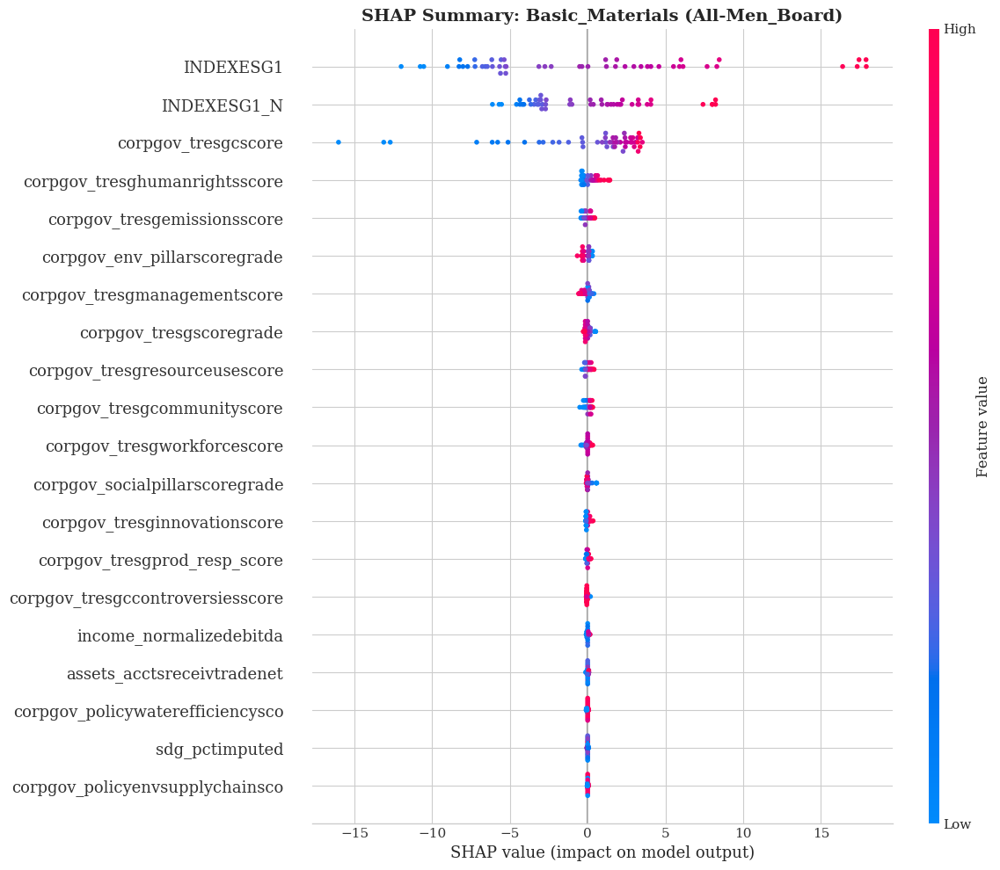


--- SHAP: Feature Contribution by Category ---


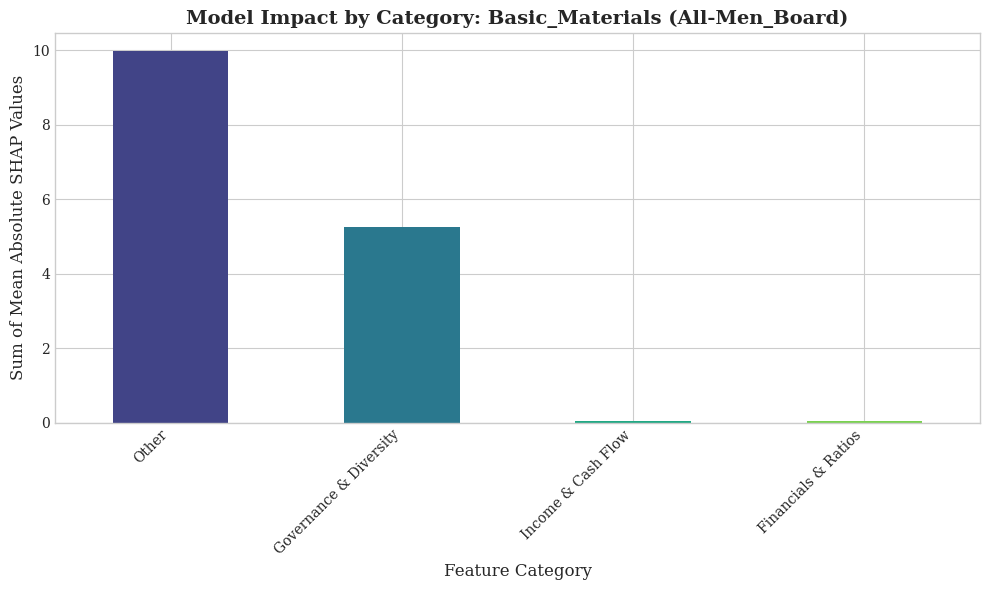


3. Running LIME Analysis...

--- LIME: Explanation for Test Instance #0 ---
Model Prediction for this instance: 23.67


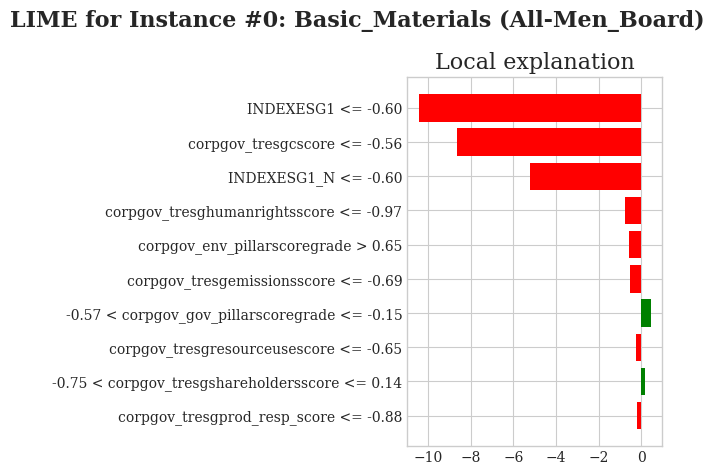


--- LIME: Explanation for Test Instance #48 ---
Model Prediction for this instance: 45.01


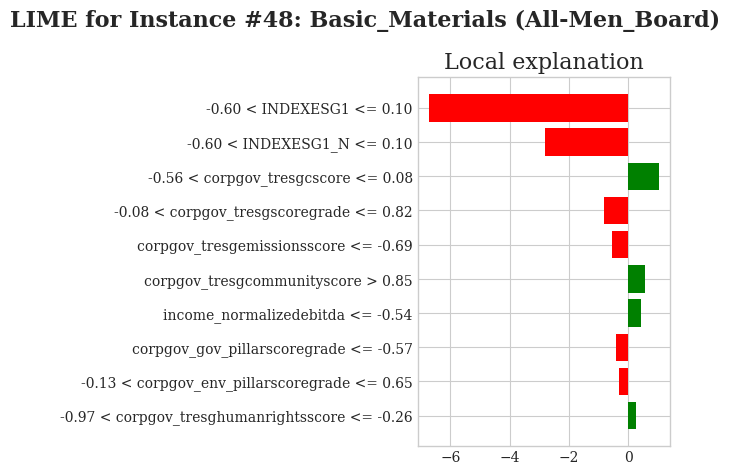


--- LIME: Explanation for Test Instance #97 ---
Model Prediction for this instance: 86.55


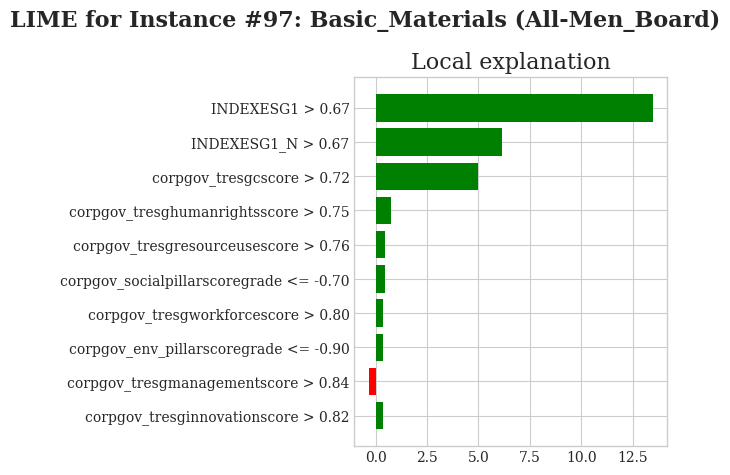



--- XAI Analysis for Scenario: Basic_Materials | Subset: All_Board_Types ---
1. Loading artifacts...
   Artifacts loaded successfully.

2. Running SHAP Analysis...


  0%|          | 0/50 [00:00<?, ?it/s]

   SHAP values calculated.

--- SHAP: Global Feature Importance ---


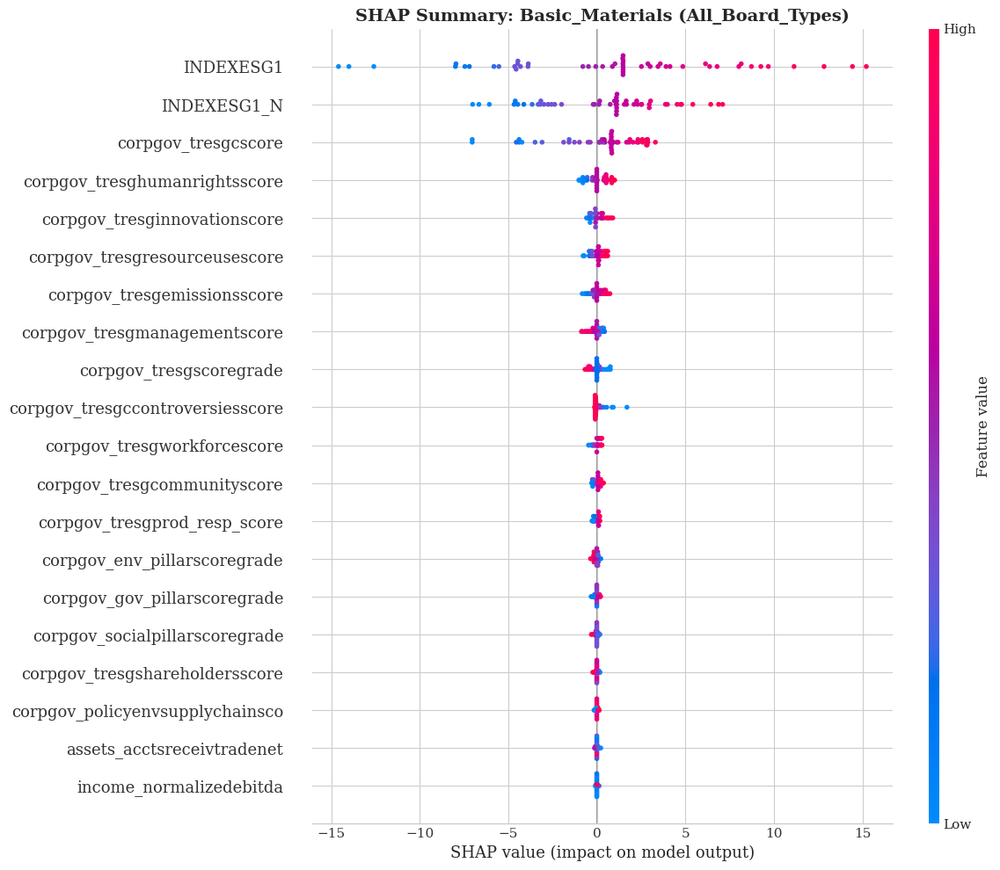


--- SHAP: Feature Contribution by Category ---


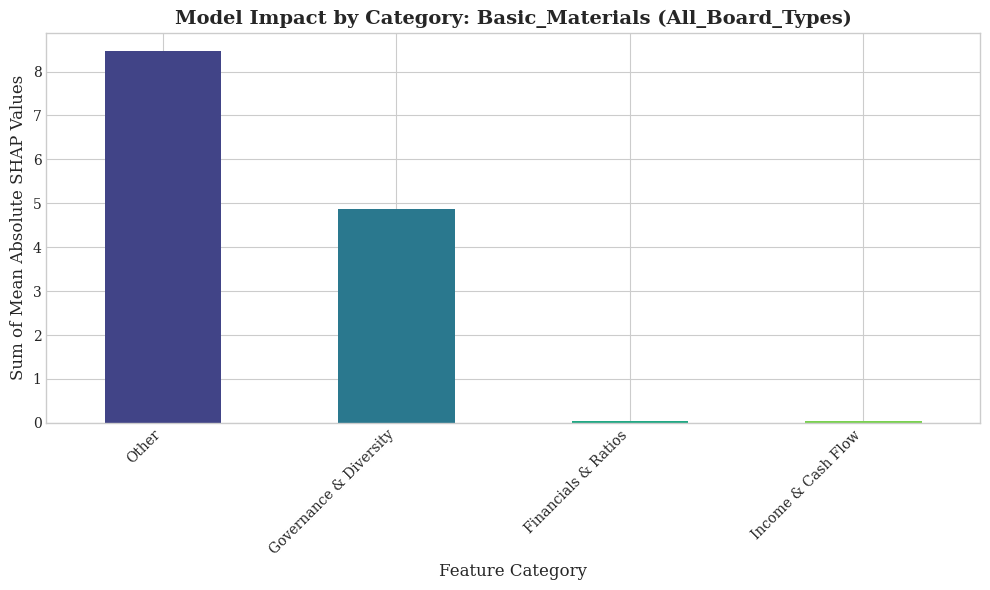


3. Running LIME Analysis...

--- LIME: Explanation for Test Instance #0 ---
Model Prediction for this instance: 32.78


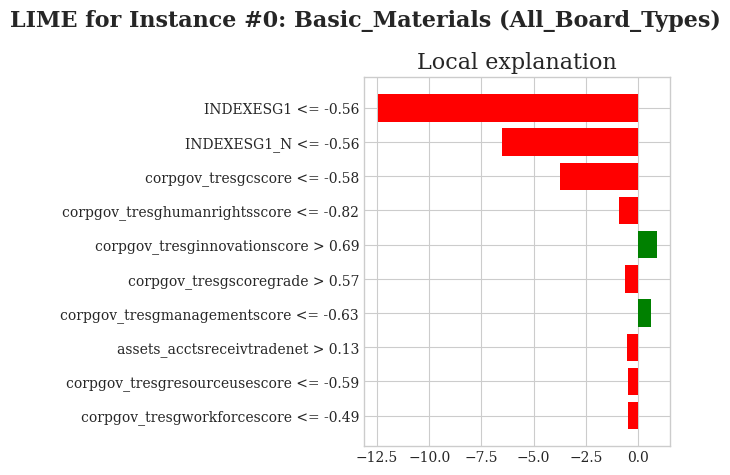


--- LIME: Explanation for Test Instance #276 ---
Model Prediction for this instance: 62.25


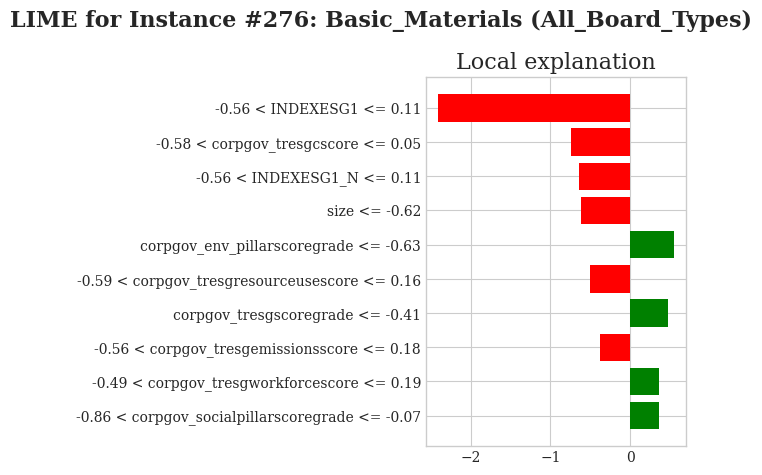


--- LIME: Explanation for Test Instance #553 ---
Model Prediction for this instance: 62.26


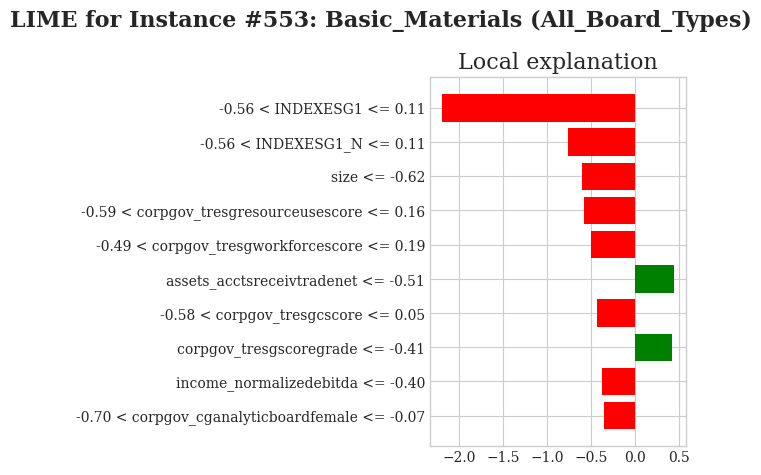



--- XAI Analysis for Scenario: Basic_Materials | Subset: Diverse_Board ---
1. Loading artifacts...
   Artifacts loaded successfully.

2. Running SHAP Analysis...


  0%|          | 0/50 [00:00<?, ?it/s]

   SHAP values calculated.

--- SHAP: Global Feature Importance ---


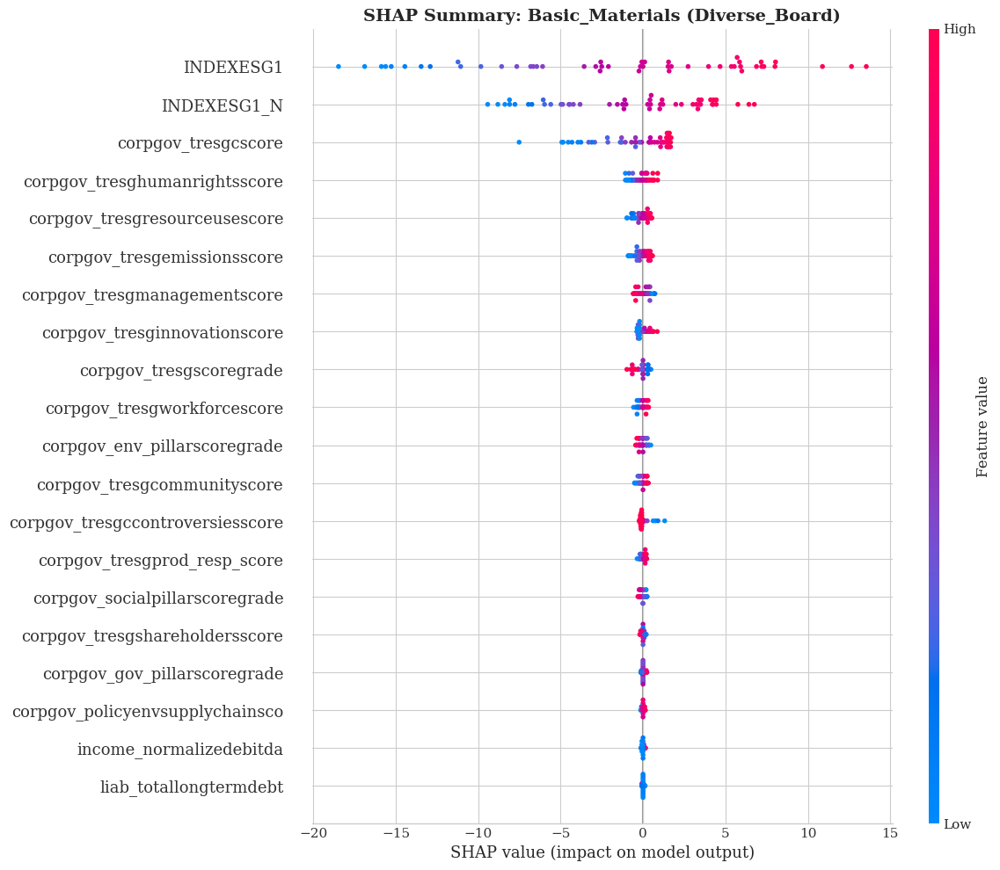


--- SHAP: Feature Contribution by Category ---


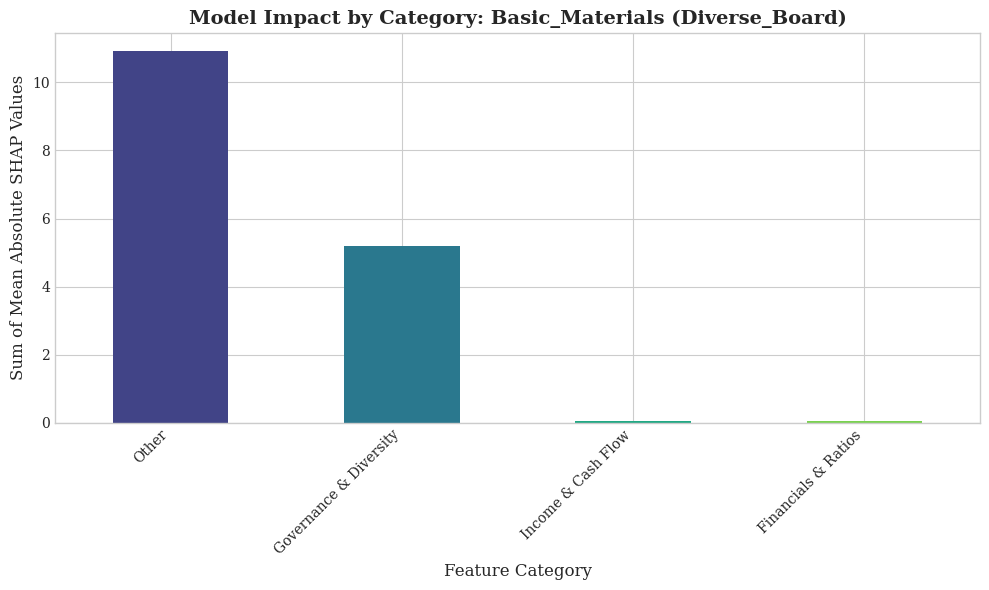


3. Running LIME Analysis...

--- LIME: Explanation for Test Instance #0 ---
Model Prediction for this instance: 37.03


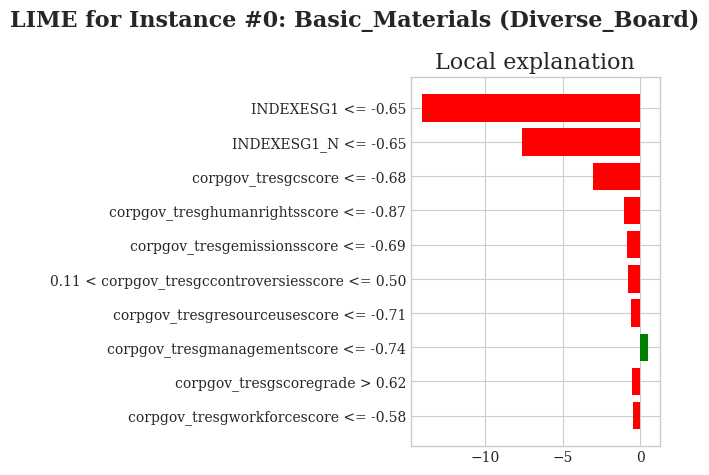


--- LIME: Explanation for Test Instance #176 ---
Model Prediction for this instance: 80.50


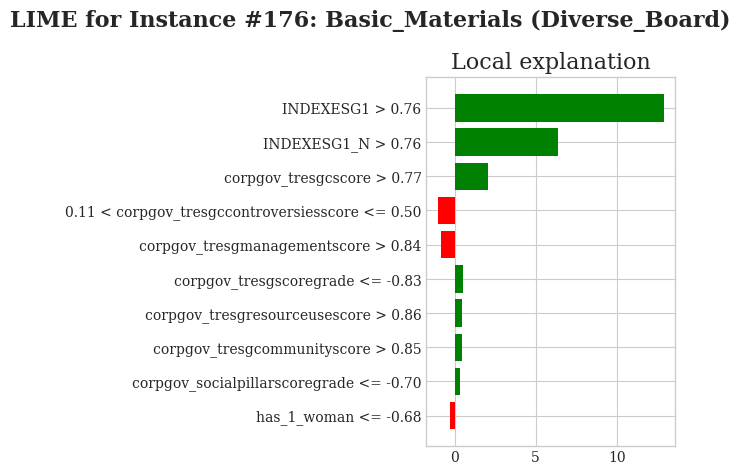


--- LIME: Explanation for Test Instance #353 ---
Model Prediction for this instance: 88.44


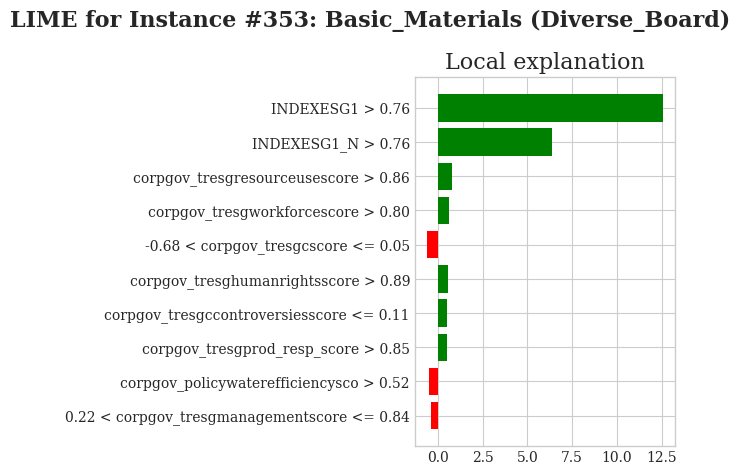



--- XAI Analysis for Scenario: Energy | Subset: All-Men_Board ---
1. Loading artifacts...
   Artifacts loaded successfully.

2. Running SHAP Analysis...


  0%|          | 0/29 [00:00<?, ?it/s]

   SHAP values calculated.

--- SHAP: Global Feature Importance ---


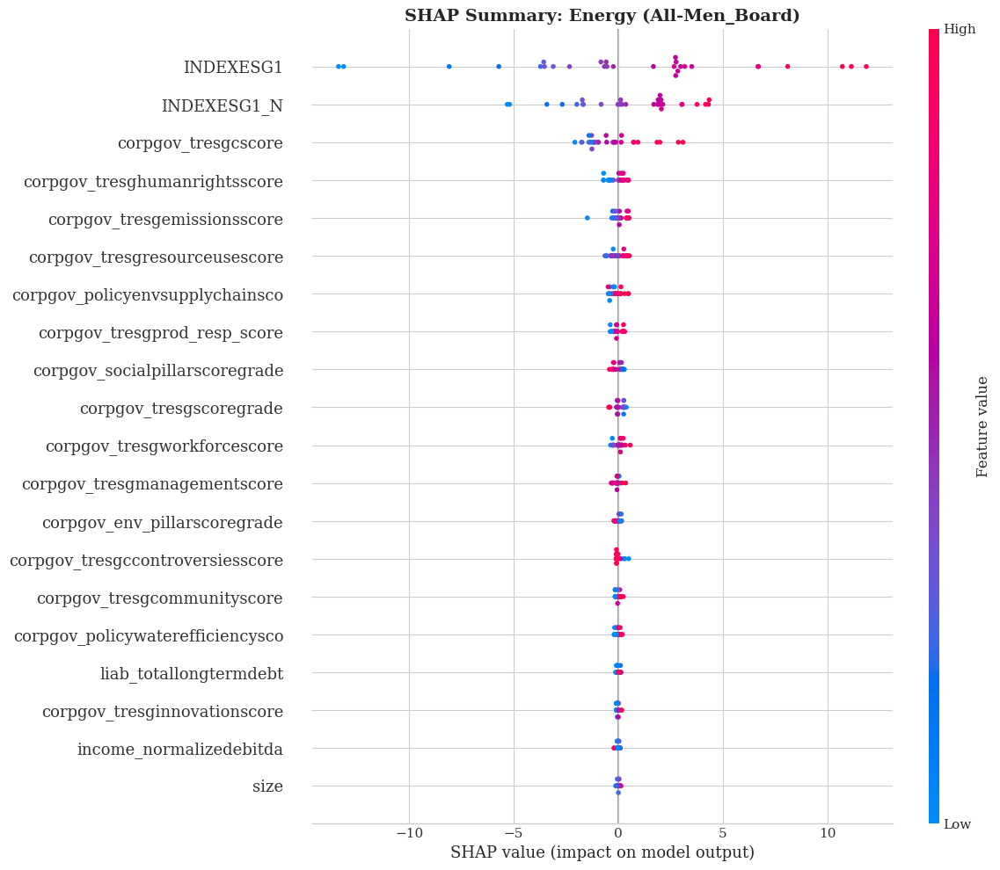


--- SHAP: Feature Contribution by Category ---


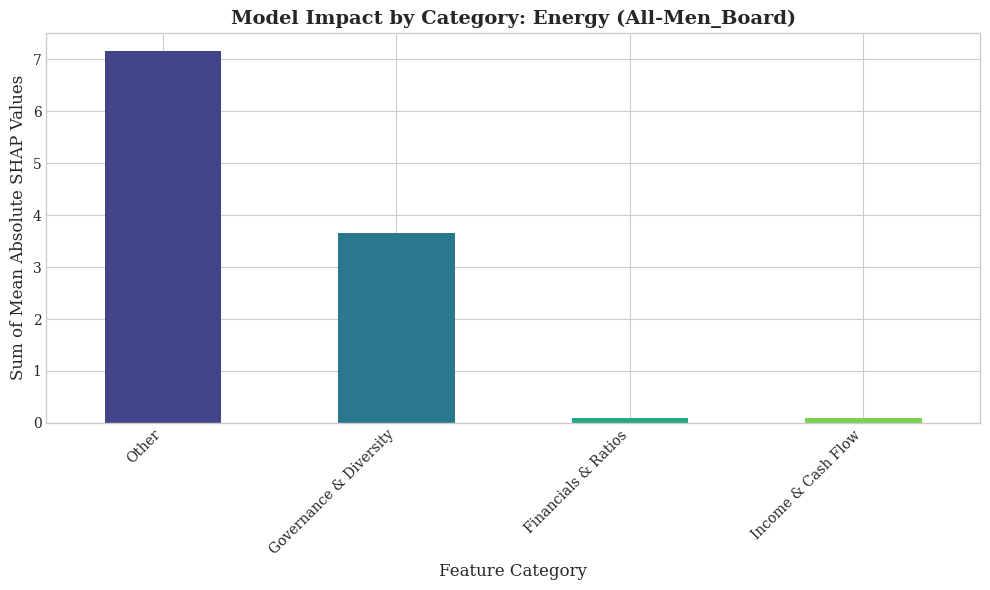


3. Running LIME Analysis...

--- LIME: Explanation for Test Instance #0 ---
Model Prediction for this instance: 56.22


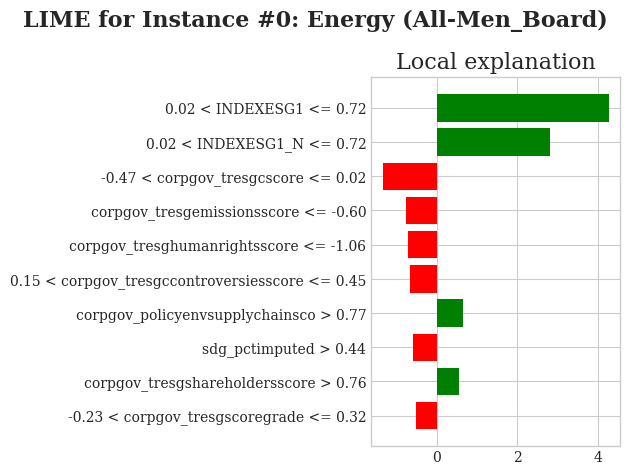


--- LIME: Explanation for Test Instance #14 ---
Model Prediction for this instance: 49.12


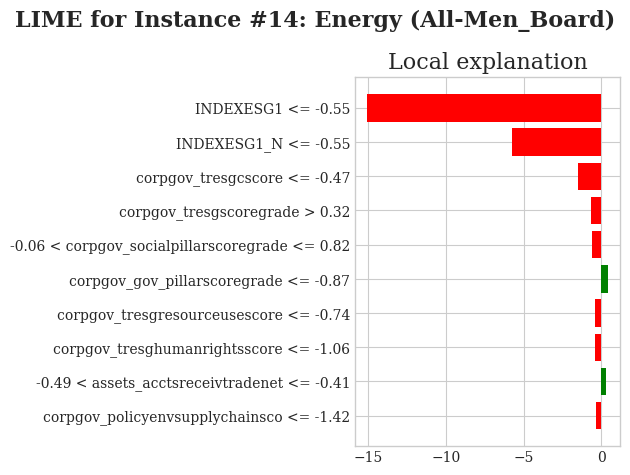


--- LIME: Explanation for Test Instance #28 ---
Model Prediction for this instance: 68.26


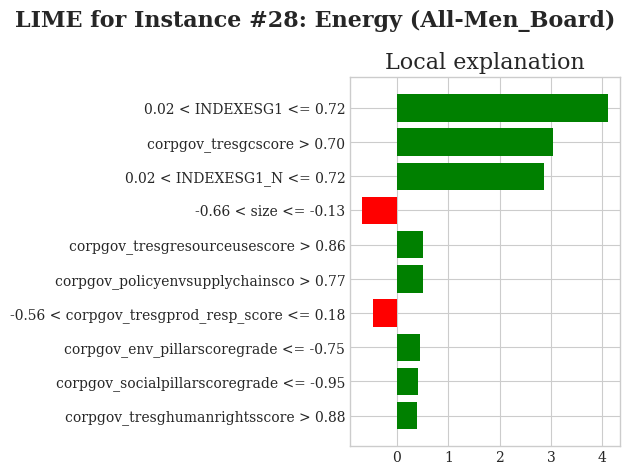



--- XAI Analysis for Scenario: Energy | Subset: All_Board_Types ---
1. Loading artifacts...
   Artifacts loaded successfully.

2. Running SHAP Analysis...


  0%|          | 0/50 [00:00<?, ?it/s]

   SHAP values calculated.

--- SHAP: Global Feature Importance ---


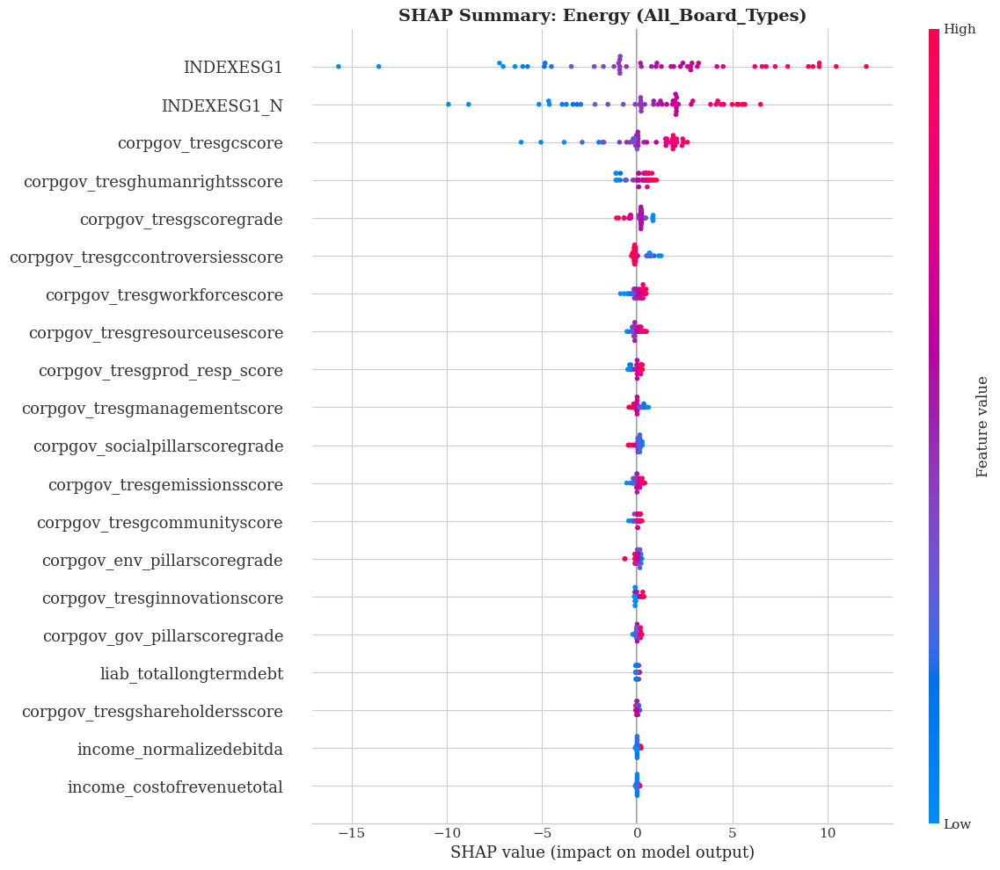


--- SHAP: Feature Contribution by Category ---


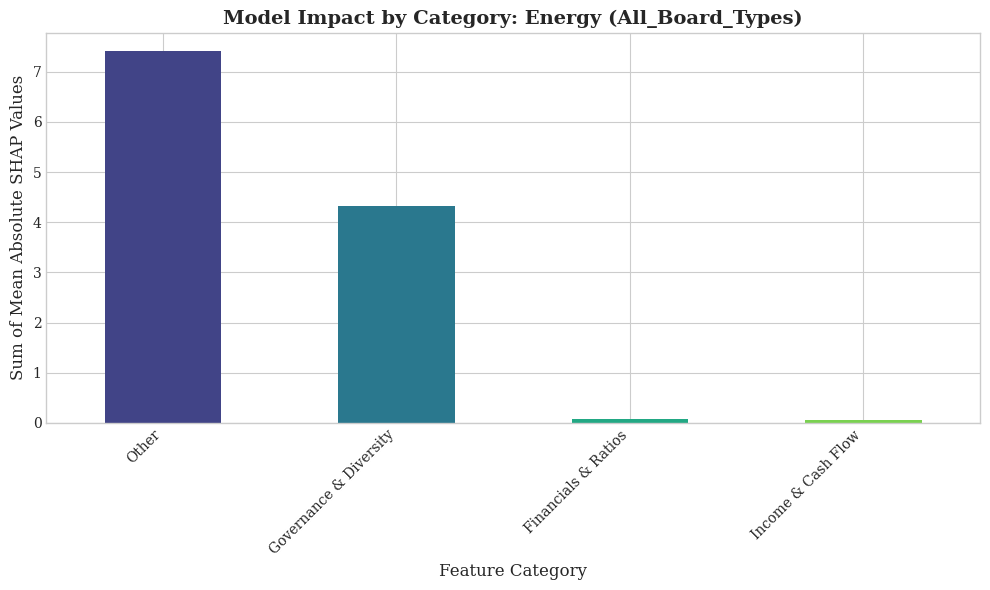


3. Running LIME Analysis...

--- LIME: Explanation for Test Instance #0 ---
Model Prediction for this instance: 61.89


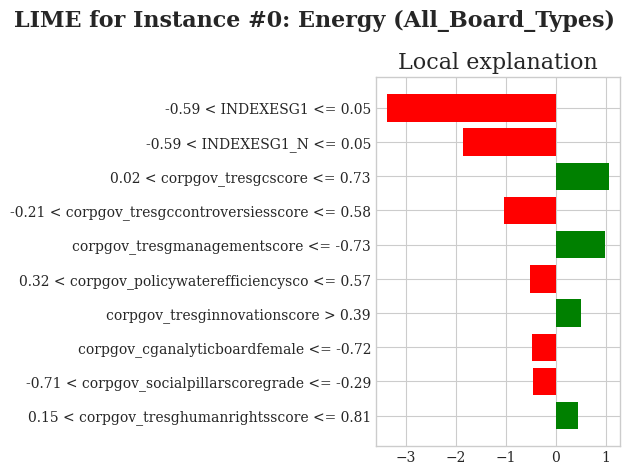


--- LIME: Explanation for Test Instance #101 ---
Model Prediction for this instance: 79.69


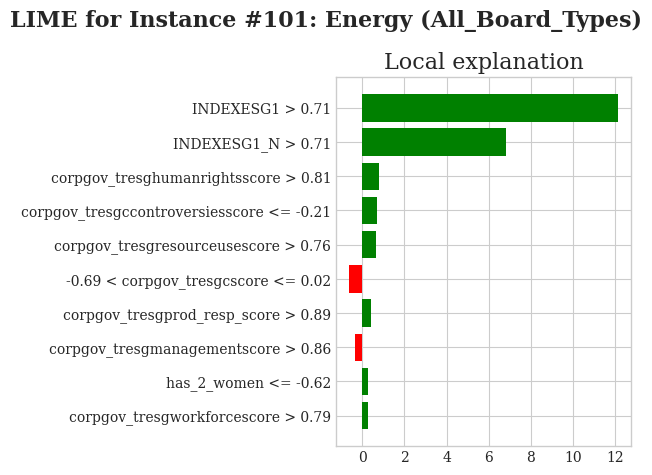


--- LIME: Explanation for Test Instance #203 ---
Model Prediction for this instance: 67.58


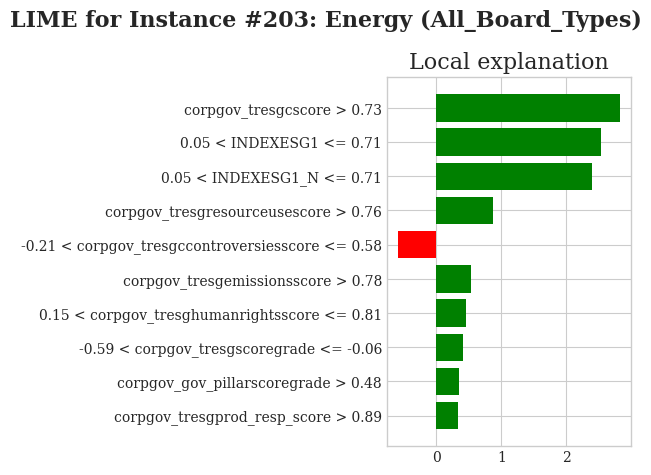



--- XAI Analysis for Scenario: Energy | Subset: Diverse_Board ---
1. Loading artifacts...
   Artifacts loaded successfully.

2. Running SHAP Analysis...


  0%|          | 0/50 [00:00<?, ?it/s]

   SHAP values calculated.

--- SHAP: Global Feature Importance ---


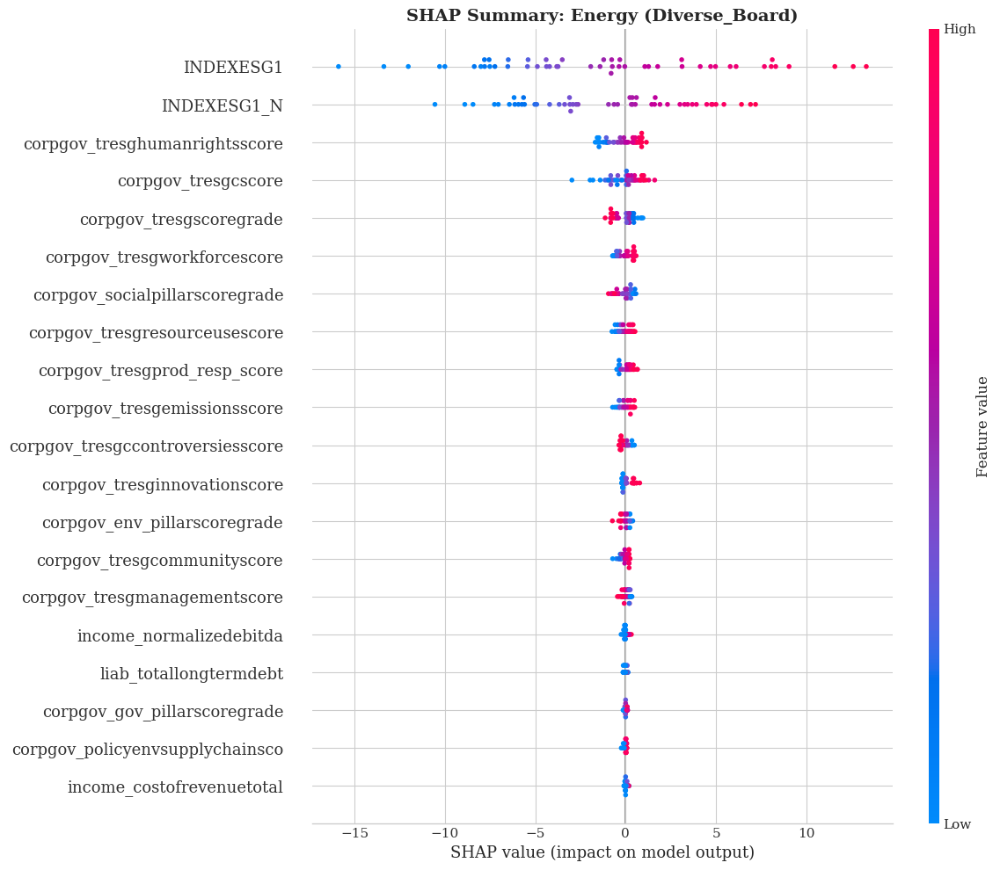


--- SHAP: Feature Contribution by Category ---


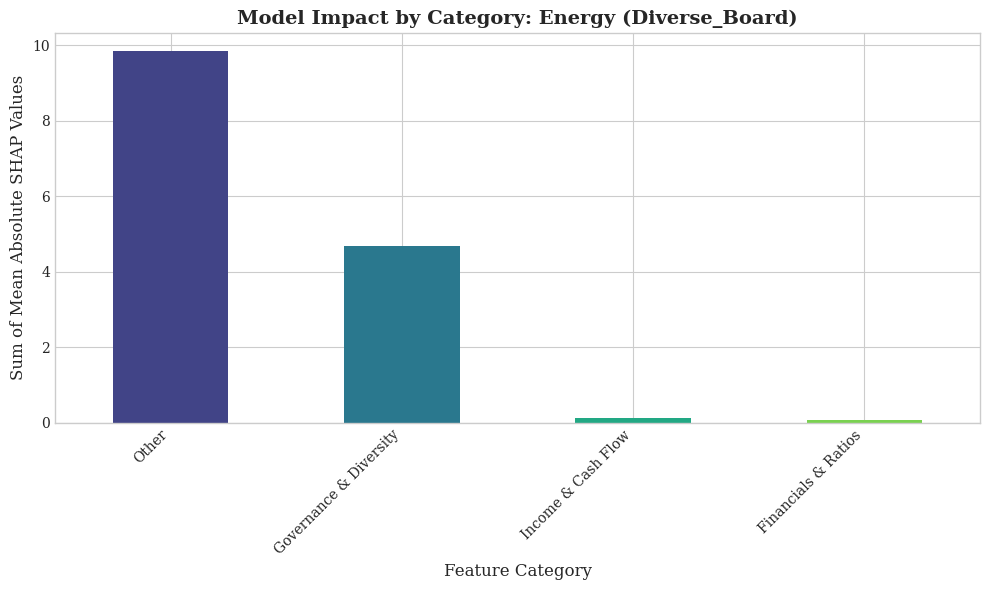


3. Running LIME Analysis...

--- LIME: Explanation for Test Instance #0 ---
Model Prediction for this instance: 46.87


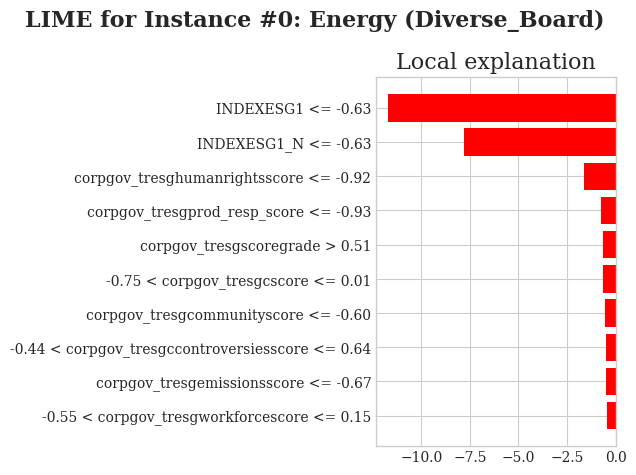


--- LIME: Explanation for Test Instance #78 ---
Model Prediction for this instance: 48.80


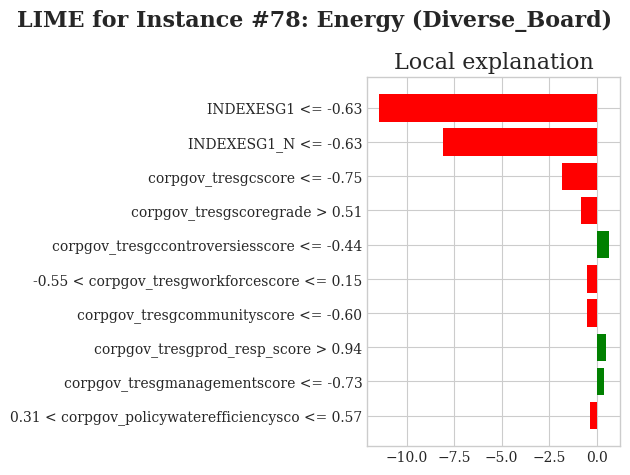


--- LIME: Explanation for Test Instance #156 ---
Model Prediction for this instance: 56.36


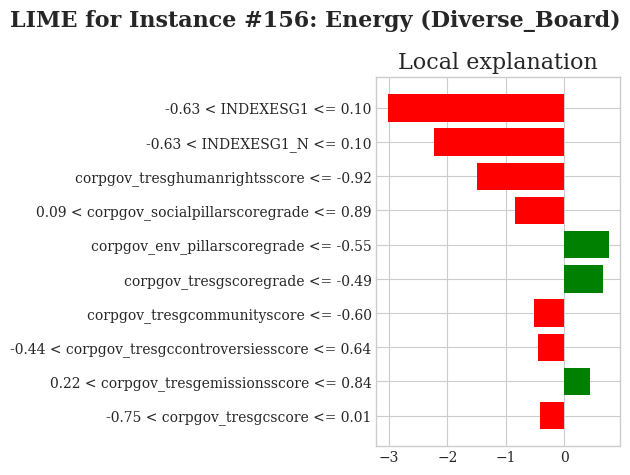



--- XAI Analysis for Scenario: Technology | Subset: All-Men_Board ---
1. Loading artifacts...
   Artifacts loaded successfully.

2. Running SHAP Analysis...


  0%|          | 0/50 [00:00<?, ?it/s]

   SHAP values calculated.

--- SHAP: Global Feature Importance ---


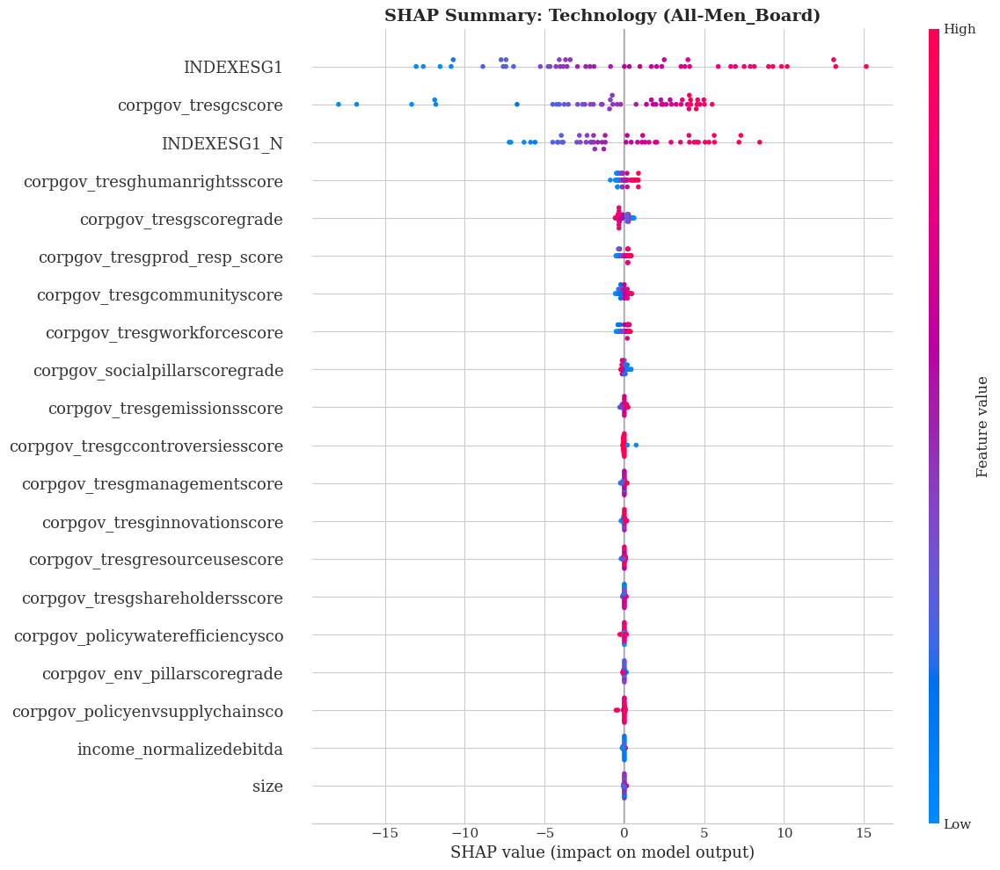


--- SHAP: Feature Contribution by Category ---


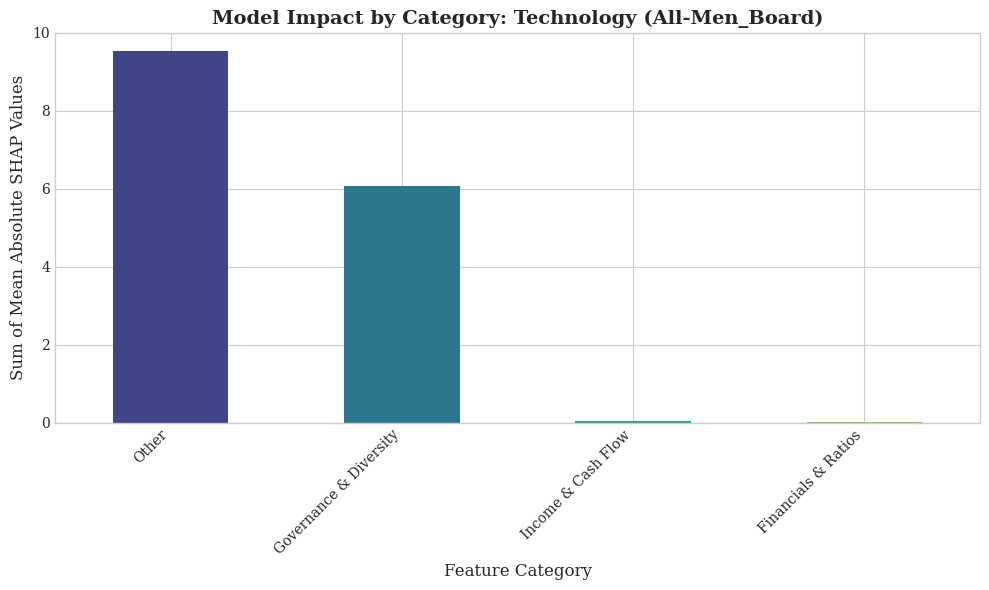


3. Running LIME Analysis...

--- LIME: Explanation for Test Instance #0 ---
Model Prediction for this instance: 81.68


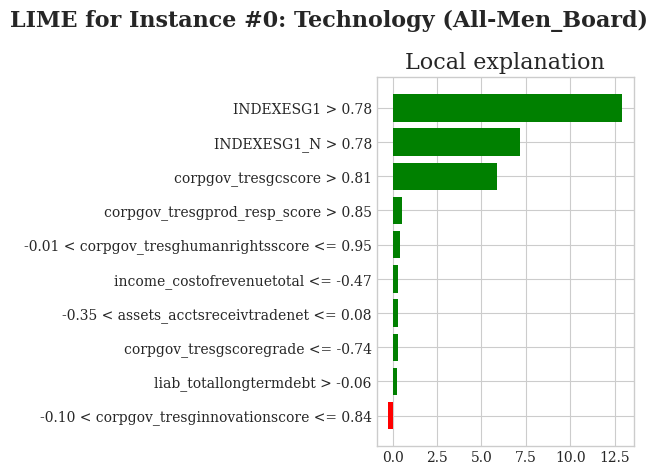


--- LIME: Explanation for Test Instance #66 ---
Model Prediction for this instance: 74.15


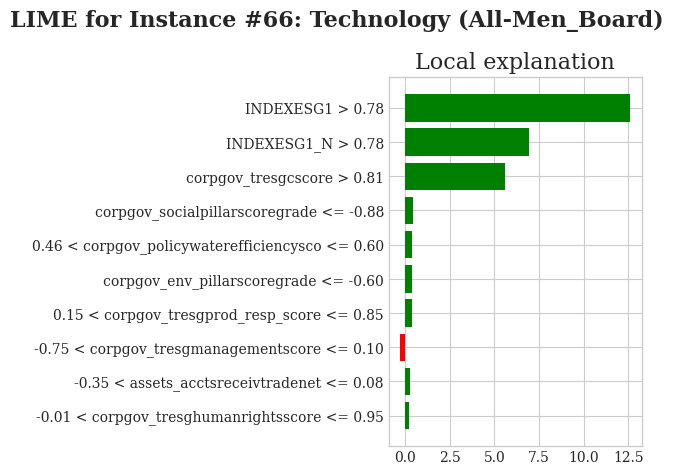


--- LIME: Explanation for Test Instance #132 ---
Model Prediction for this instance: 70.89


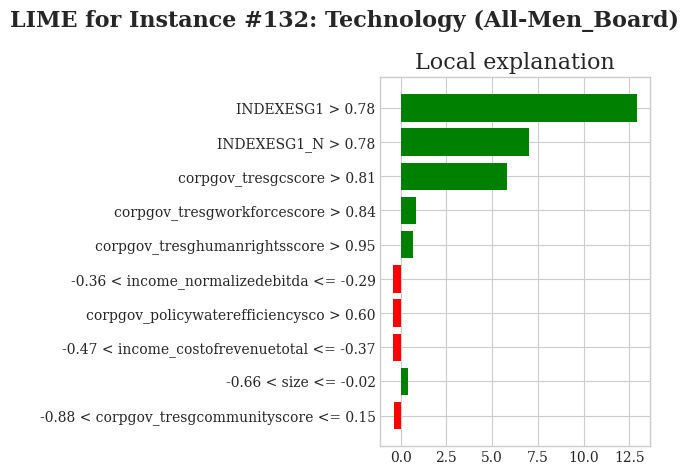



--- XAI Analysis for Scenario: Technology | Subset: All_Board_Types ---
1. Loading artifacts...
   Artifacts loaded successfully.

2. Running SHAP Analysis...


  0%|          | 0/50 [00:00<?, ?it/s]

   SHAP values calculated.

--- SHAP: Global Feature Importance ---


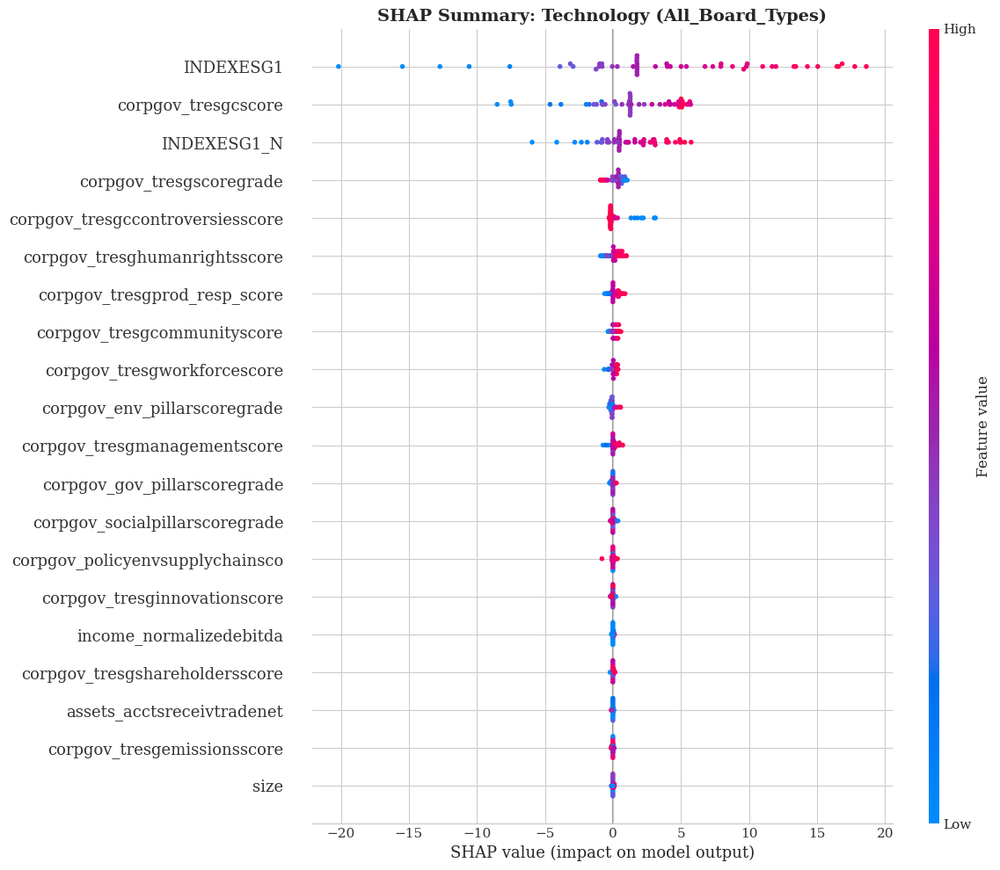


--- SHAP: Feature Contribution by Category ---


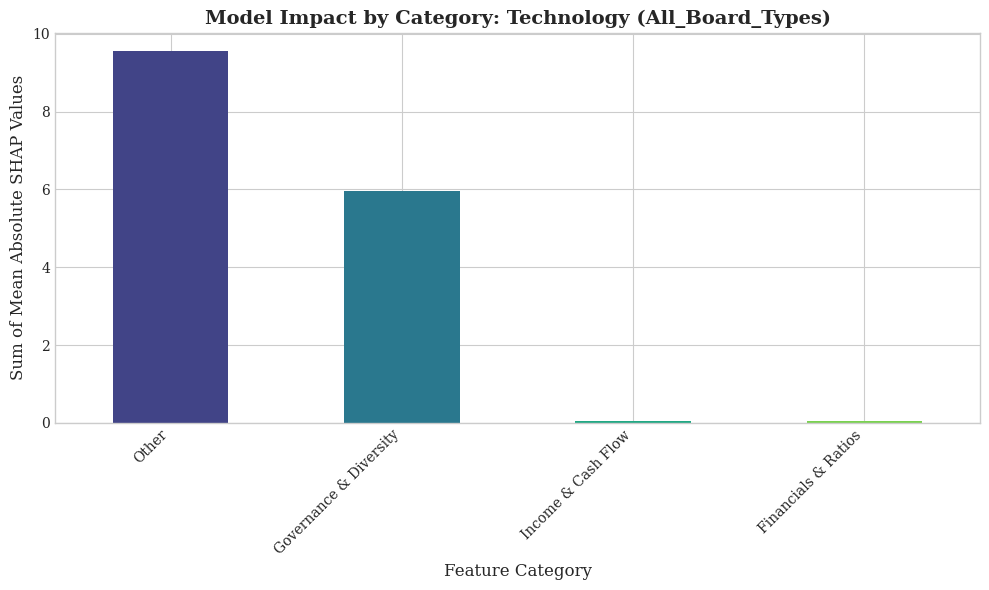


3. Running LIME Analysis...

--- LIME: Explanation for Test Instance #0 ---
Model Prediction for this instance: 66.60


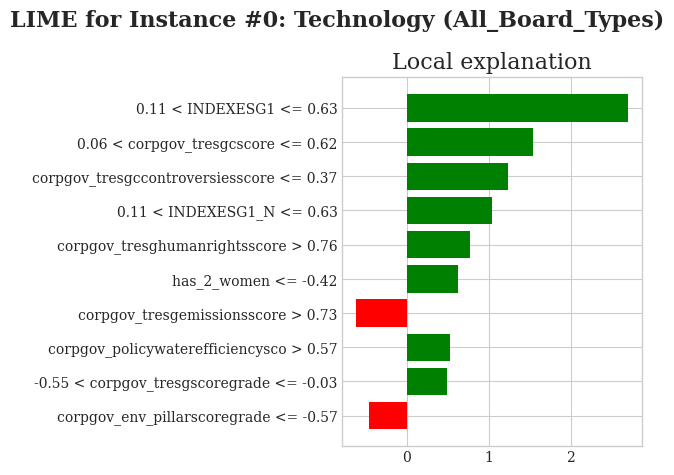


--- LIME: Explanation for Test Instance #337 ---
Model Prediction for this instance: 63.29


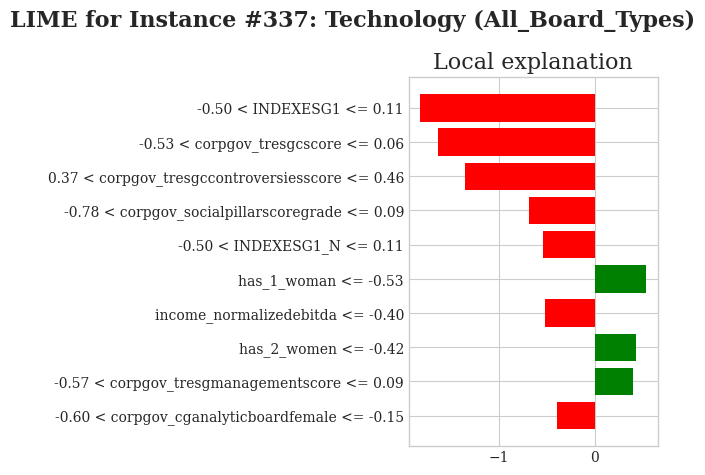


--- LIME: Explanation for Test Instance #675 ---
Model Prediction for this instance: 63.27


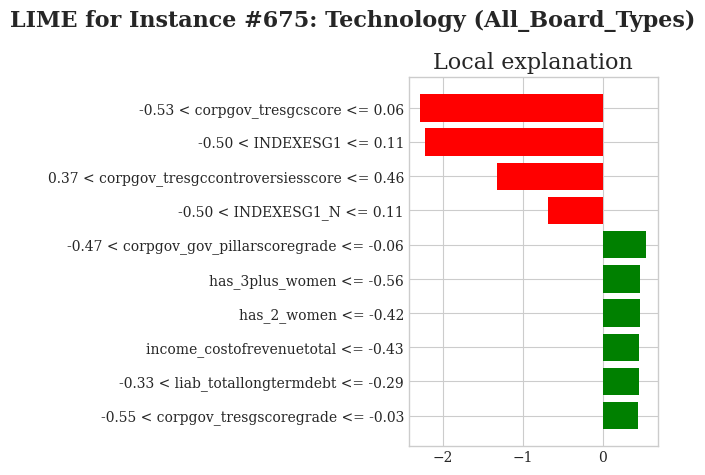



--- XAI Analysis for Scenario: Technology | Subset: Diverse_Board ---
1. Loading artifacts...
   Artifacts loaded successfully.

2. Running SHAP Analysis...


  0%|          | 0/50 [00:00<?, ?it/s]

   SHAP values calculated.

--- SHAP: Global Feature Importance ---


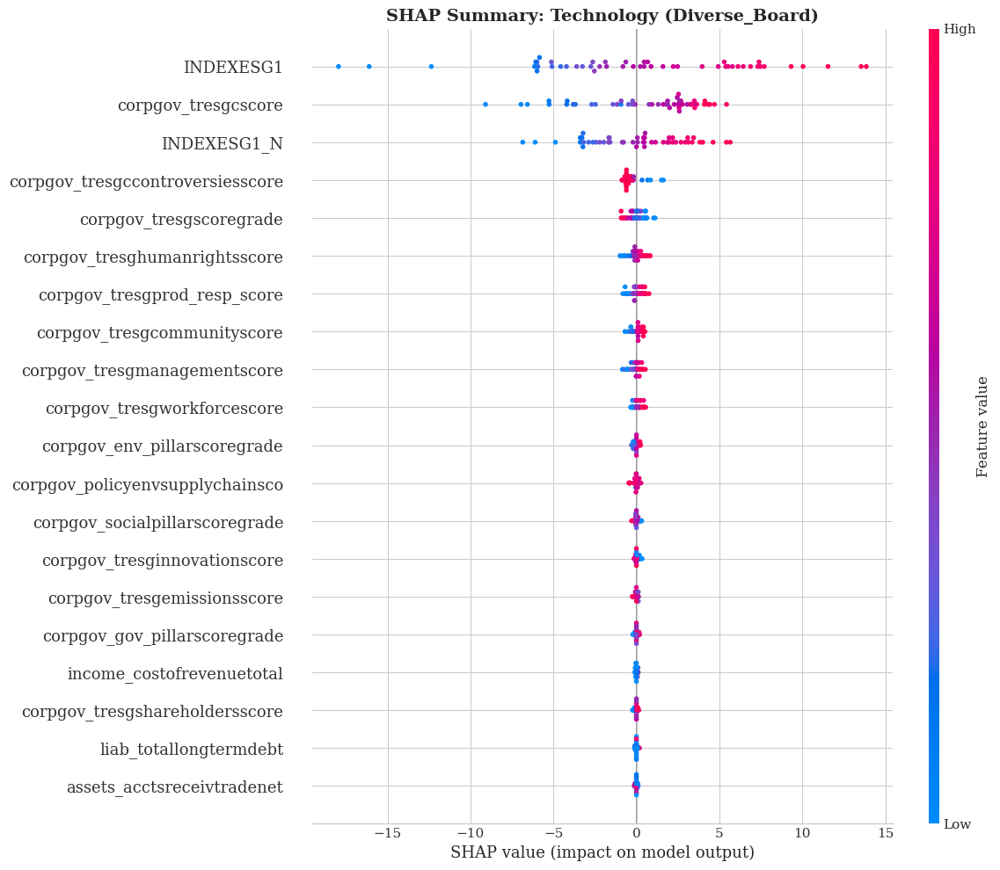


--- SHAP: Feature Contribution by Category ---


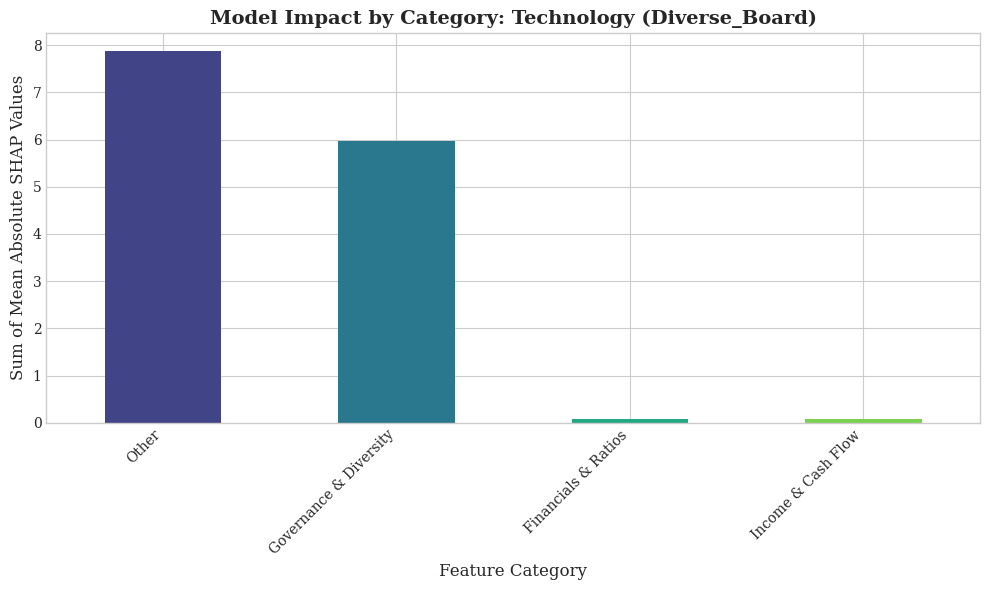


3. Running LIME Analysis...

--- LIME: Explanation for Test Instance #0 ---
Model Prediction for this instance: 65.50


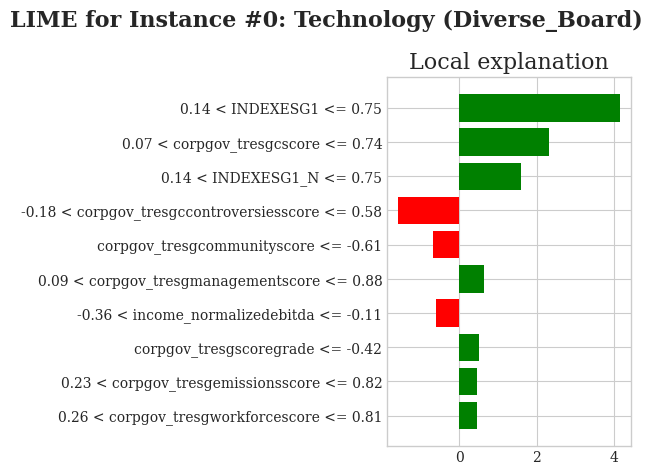


--- LIME: Explanation for Test Instance #205 ---
Model Prediction for this instance: 55.65


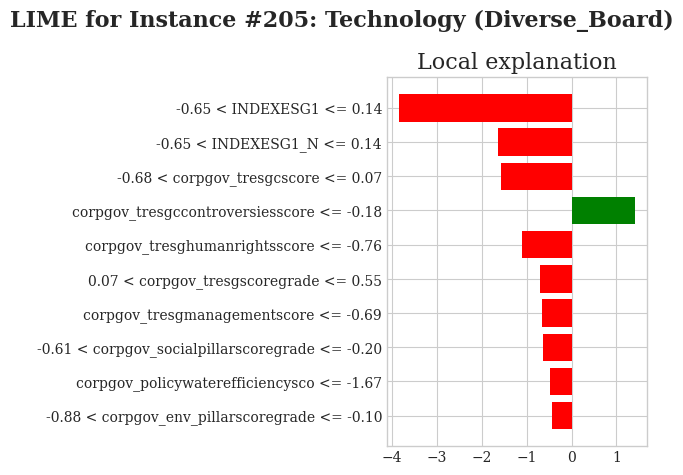


--- LIME: Explanation for Test Instance #410 ---
Model Prediction for this instance: 43.91


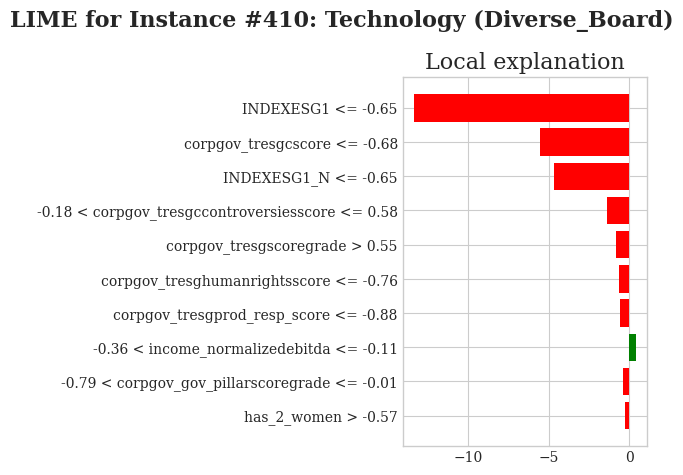



--- XAI Analysis for Scenario: Industrials | Subset: All-Men_Board ---
1. Loading artifacts...
   Artifacts loaded successfully.

2. Running SHAP Analysis...


  0%|          | 0/50 [00:00<?, ?it/s]

   SHAP values calculated.

--- SHAP: Global Feature Importance ---


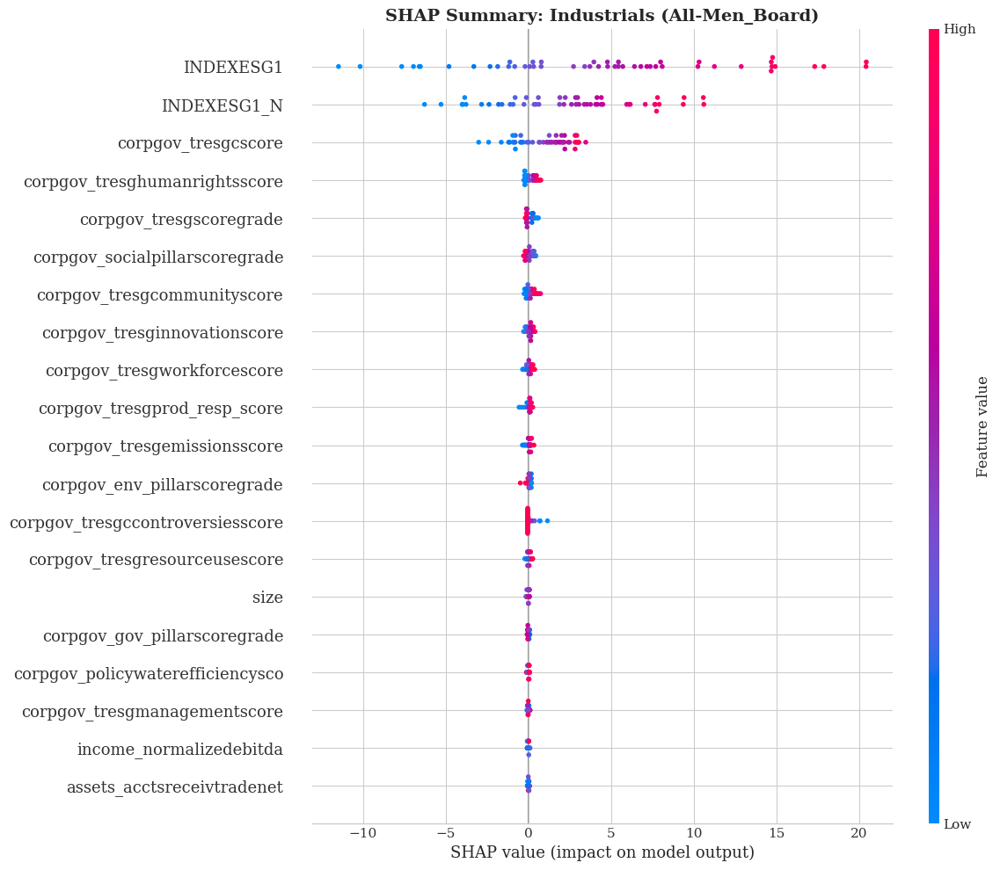


--- SHAP: Feature Contribution by Category ---


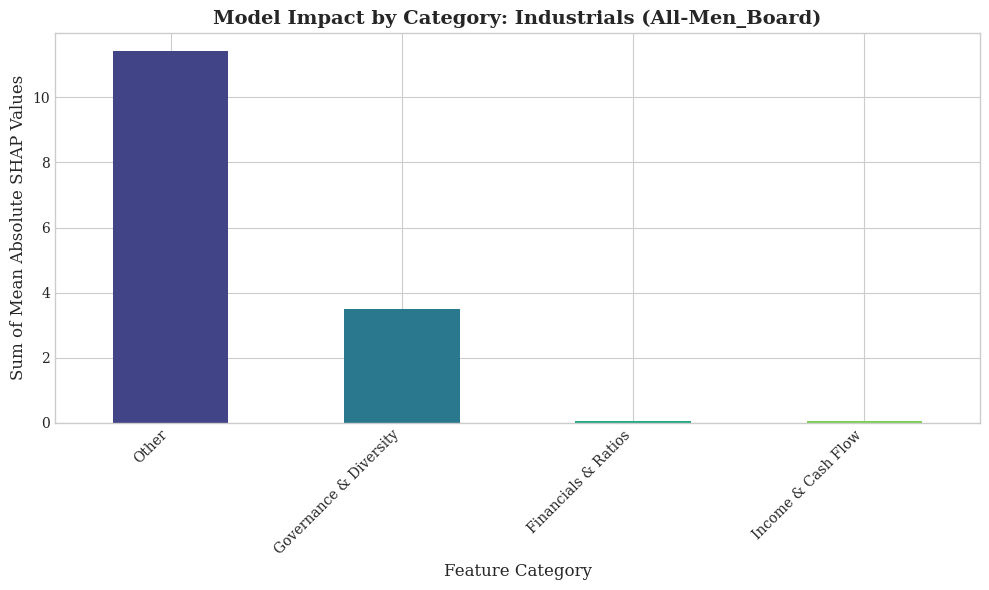


3. Running LIME Analysis...

--- LIME: Explanation for Test Instance #0 ---
Model Prediction for this instance: 41.75


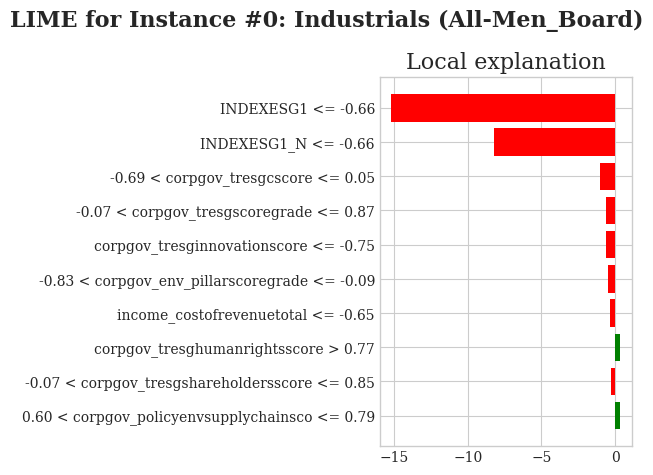


--- LIME: Explanation for Test Instance #56 ---
Model Prediction for this instance: 39.52


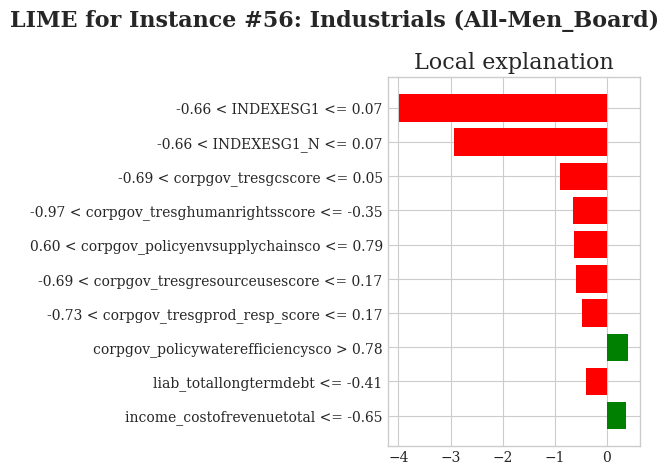


--- LIME: Explanation for Test Instance #112 ---
Model Prediction for this instance: 68.06


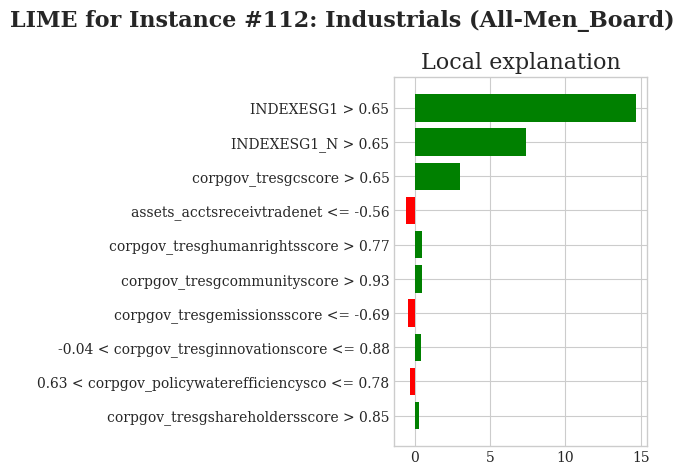



--- XAI Analysis for Scenario: Industrials | Subset: All_Board_Types ---
1. Loading artifacts...
   Artifacts loaded successfully.

2. Running SHAP Analysis...


  0%|          | 0/50 [00:00<?, ?it/s]

   SHAP values calculated.

--- SHAP: Global Feature Importance ---


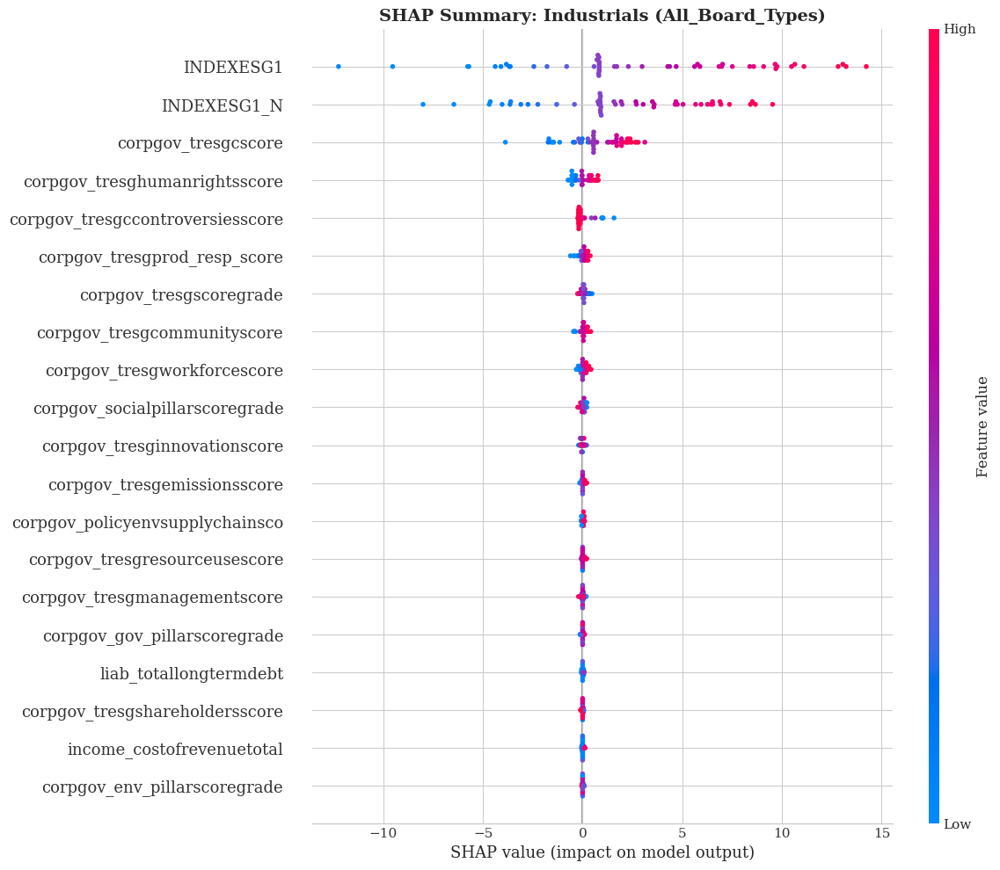


--- SHAP: Feature Contribution by Category ---


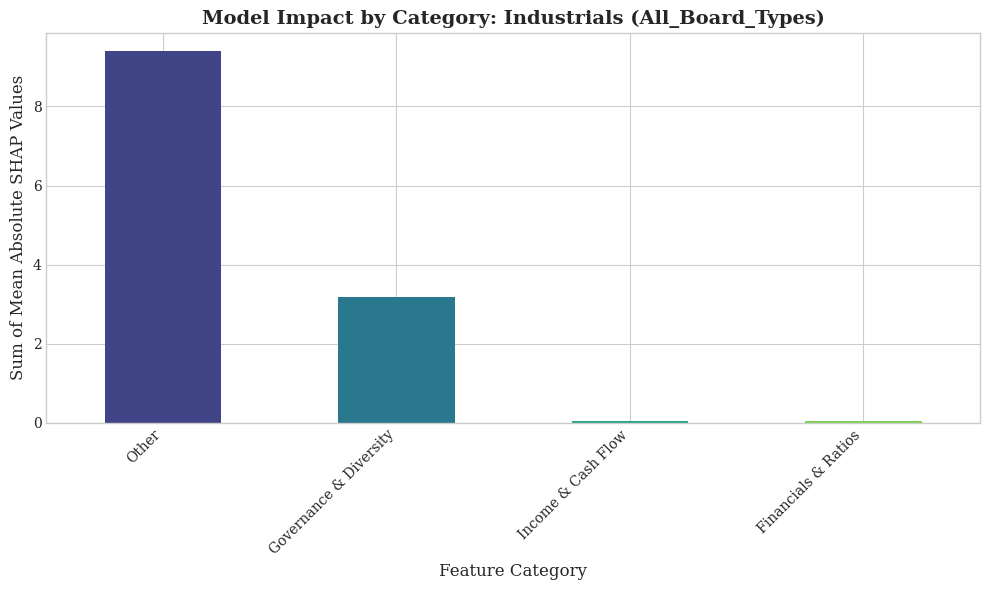


3. Running LIME Analysis...

--- LIME: Explanation for Test Instance #0 ---
Model Prediction for this instance: 61.07


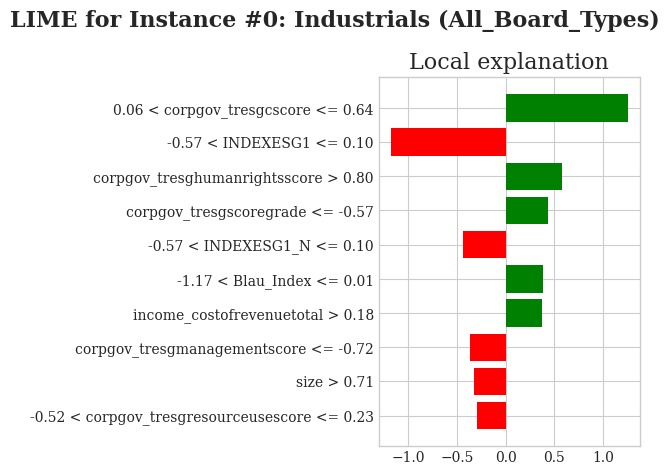


--- LIME: Explanation for Test Instance #328 ---
Model Prediction for this instance: 67.52


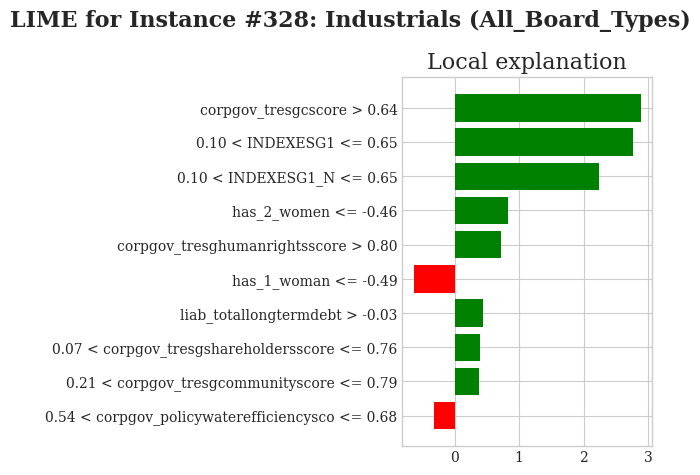


--- LIME: Explanation for Test Instance #657 ---
Model Prediction for this instance: 70.19


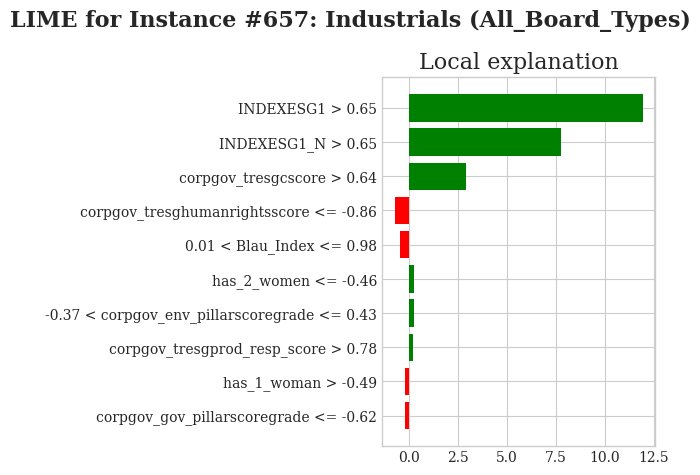



--- XAI Analysis for Scenario: Industrials | Subset: Diverse_Board ---
1. Loading artifacts...
   Artifacts loaded successfully.

2. Running SHAP Analysis...


  0%|          | 0/50 [00:00<?, ?it/s]

   SHAP values calculated.

--- SHAP: Global Feature Importance ---


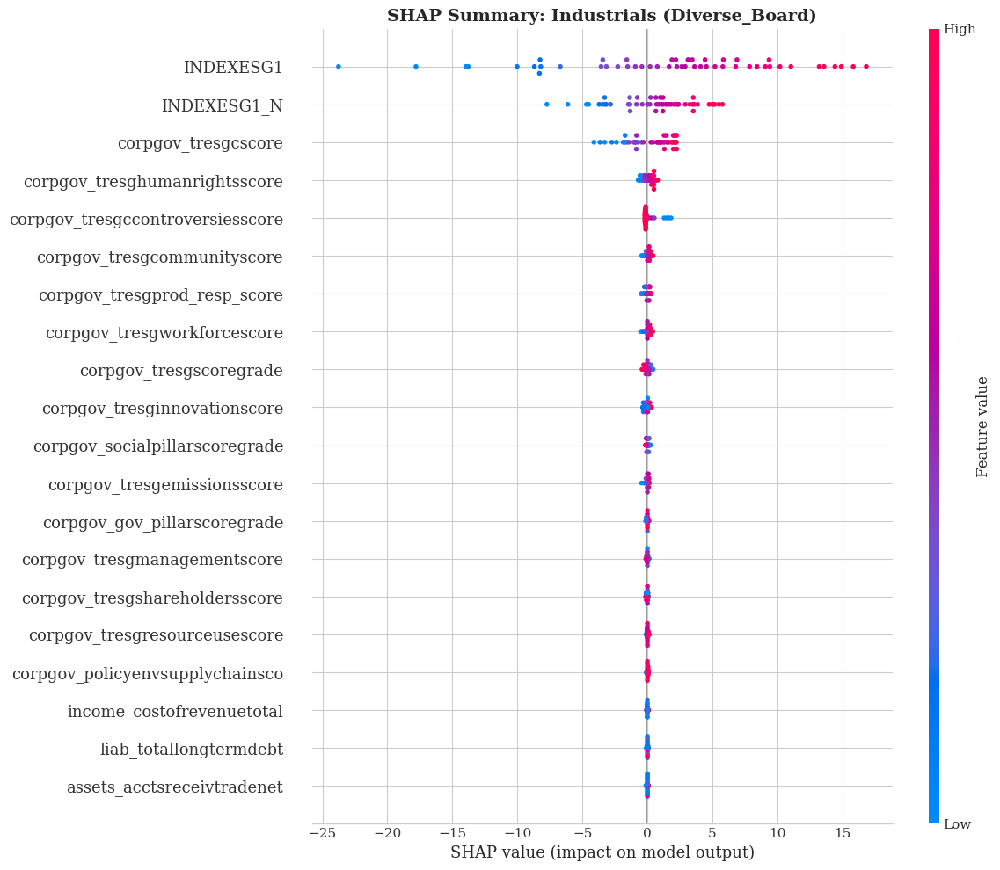


--- SHAP: Feature Contribution by Category ---


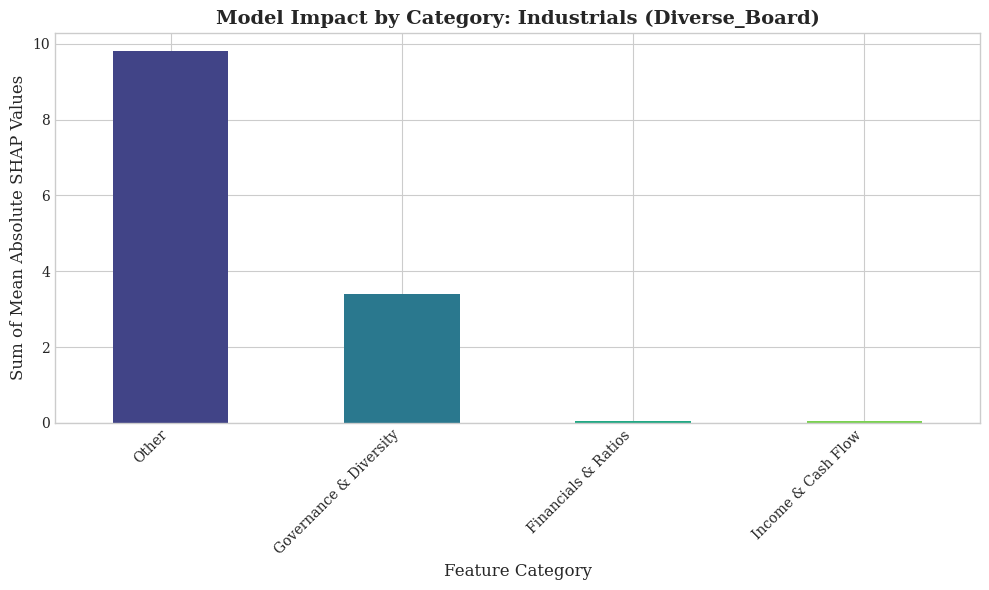


3. Running LIME Analysis...

--- LIME: Explanation for Test Instance #0 ---
Model Prediction for this instance: 73.56


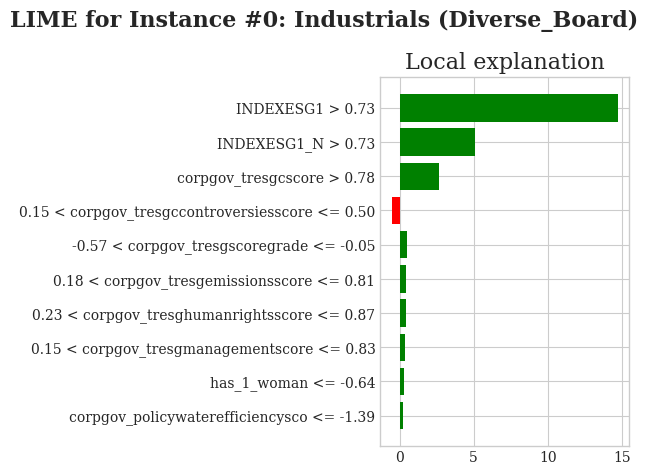


--- LIME: Explanation for Test Instance #215 ---
Model Prediction for this instance: 33.01


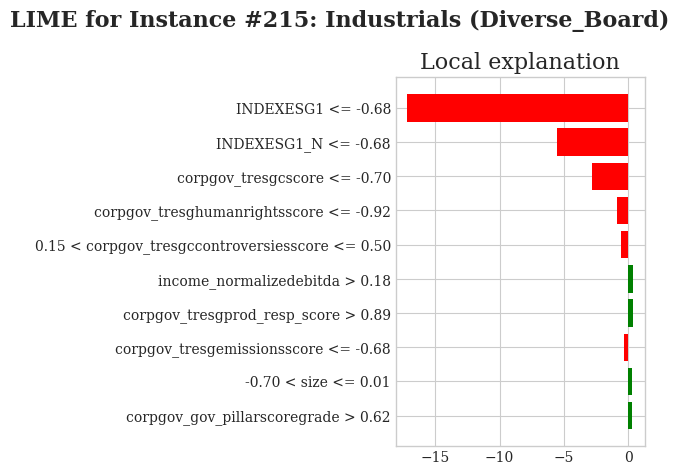


--- LIME: Explanation for Test Instance #431 ---
Model Prediction for this instance: 71.33


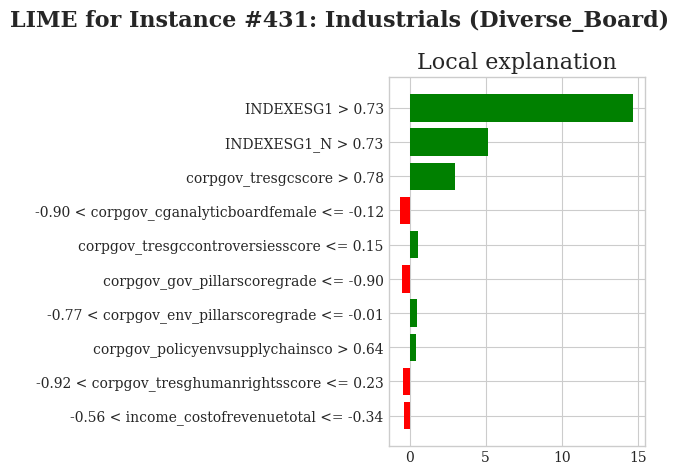



--- Full XAI Analysis for All Scenarios Complete ---


In [3]:
# ==============================================================================
# Cell 3: Explainable AI (XAI) for All Scenarios
# ==============================================================================
print("--- Starting Part 3: Explainable AI (XAI) for All Scenarios ---")

# Install LIME if not already installed
try:
    import lime
    import lime.lime_tabular
except ImportError:
    print("Installing LIME...")
    !pip install lime --quiet
    import lime
    import lime.lime_tabular

import shap
import joblib
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
import re

# --- Helper function for category analysis ---
def get_category(feature_name):
    if 'corpgov_' in feature_name or 'equality_' in feature_name or 'Blau' in feature_name or 'has_' in feature_name:
        return 'Governance & Diversity'
    elif 'stock_' in feature_name or 'beta_' in feature_name:
        return 'Market Performance'
    elif 'liab_' in feature_name or 'assets_' in feature_name or 'findev_' in feature_name or 'ROA' in feature_name or 'ROE' in feature_name:
        return 'Financials & Ratios'
    elif 'income_' in feature_name or 'cf_' in feature_name:
        return 'Income & Cash Flow'
    else:
        return 'Other'
        
# --- Loop Through All Saved Scenarios for XAI ---
BASE_ARTIFACT_PATH = '/kaggle/working/artifacts'
if not os.path.exists(BASE_ARTIFACT_PATH):
    print(f"Artifacts directory not found at {BASE_ARTIFACT_PATH}. Please run Cell 2 first.")
else:
    scenarios_to_analyze = [d for d in os.listdir(BASE_ARTIFACT_PATH) if os.path.isdir(os.path.join(BASE_ARTIFACT_PATH, d))]

    for scenario_name in scenarios_to_analyze:
        scenario_path = os.path.join(BASE_ARTIFACT_PATH, scenario_name)
        subsets_to_analyze = [d for d in os.listdir(scenario_path) if os.path.isdir(os.path.join(scenario_path, d))]
        
        for subset_name in subsets_to_analyze:
            print(f"\n\n{'='*70}\n--- XAI Analysis for Scenario: {scenario_name} | Subset: {subset_name} ---\n{'='*70}")
            artifact_dir = os.path.join(scenario_path, subset_name)

            # 1. Load Artifacts for the current scenario
            try:
                print("1. Loading artifacts...")
                model = joblib.load(os.path.join(artifact_dir, 'model_ESG_StackNet.joblib'))
                features = joblib.load(os.path.join(artifact_dir, 'features.joblib'))
                X_train_scaled = pd.read_csv(os.path.join(artifact_dir, 'X_train_scaled.csv'))
                X_test_scaled = pd.read_csv(os.path.join(artifact_dir, 'X_test_scaled.csv'))
                
                if X_test_scaled.shape[0] < 10:
                    print(f"   Skipping XAI for '{scenario_name} - {subset_name}' due to insufficient test data ({X_test_scaled.shape[0]} rows).")
                    continue
                print("   Artifacts loaded successfully.")

            except FileNotFoundError:
                print(f"   Artifacts not found for '{scenario_name} - {subset_name}'. Skipping.")
                continue

            # 2. SHAP Analysis
            print("\n2. Running SHAP Analysis...")
            def predict_fn_shap(data):
                df = pd.DataFrame(data, columns=features)
                return model.predict(df)
            
            explainer_shap = shap.KernelExplainer(predict_fn_shap, shap.sample(X_train_scaled, 50, random_state=1))
            
            n_shap_samples = min(50, X_test_scaled.shape[0])
            X_test_sample_shap = X_test_scaled.sample(n_shap_samples, random_state=1)
            shap_values = explainer_shap.shap_values(X_test_sample_shap)
            print("   SHAP values calculated.")

            # SHAP Summary Plot
            print("\n--- SHAP: Global Feature Importance ---")
            plt.figure()
            shap.summary_plot(shap_values, X_test_sample_shap, show=False)
            plt.title(f"SHAP Summary: {scenario_name} ({subset_name})", weight='bold', fontsize=14)
            plt.gcf().set_size_inches(12, 10)
            plt.tight_layout()
            plt.show()

            # Feature Contribution by Category
            print("\n--- SHAP: Feature Contribution by Category ---")
            shap_df = pd.DataFrame(shap_values, columns=features)
            mean_abs_shap = shap_df.abs().mean().sort_values(ascending=False)
            feature_categories = {feature: get_category(feature) for feature in features}
            mean_abs_shap_df = mean_abs_shap.to_frame('mean_abs_shap').reset_index()
            mean_abs_shap_df['category'] = mean_abs_shap_df['index'].map(feature_categories)
            category_impact = mean_abs_shap_df.groupby('category')['mean_abs_shap'].sum().sort_values(ascending=False)
            
            plt.figure(figsize=(10, 6))
            category_impact.plot(kind='bar', color=sns.color_palette('viridis', len(category_impact)))
            plt.title(f'Model Impact by Category: {scenario_name} ({subset_name})', weight='bold', fontsize=14)
            plt.ylabel('Sum of Mean Absolute SHAP Values')
            plt.xlabel('Feature Category')
            plt.xticks(rotation=45, ha='right')
            plt.tight_layout()
            plt.show()

            # 3. LIME Analysis
            print("\n3. Running LIME Analysis...")
            lime_explainer = lime.lime_tabular.LimeTabularExplainer(
                training_data=X_train_scaled.values,
                feature_names=features,
                class_names=['ESG Score'],
                mode='regression'
            )
            
            num_lime_instances = min(3, len(X_test_scaled))
            instance_indices = np.linspace(0, len(X_test_scaled) - 1, num_lime_instances, dtype=int)

            for i in instance_indices:
                print(f"\n--- LIME: Explanation for Test Instance #{i} ---")
                instance = X_test_scaled.iloc[i].values
                model_prediction = model.predict(instance.reshape(1, -1))[0]
                explanation = lime_explainer.explain_instance(
                    instance,
                    model.predict,
                    num_features=10
                )
                print(f"Model Prediction for this instance: {model_prediction:.2f}")
                fig = explanation.as_pyplot_figure()
                fig.suptitle(f"LIME for Instance #{i}: {scenario_name} ({subset_name})", fontsize=16, weight='bold')
                plt.tight_layout()
                plt.show()
                
    print("\n\n--- Full XAI Analysis for All Scenarios Complete ---")